In [1322]:
#importing necessary libraries
import pandas as pd
import numpy as np
import statsmodels.formula.api as smf
from sklearn.preprocessing import StandardScaler, OrdinalEncoder, OneHotEncoder, LabelEncoder, PowerTransformer
from sklearn.impute import SimpleImputer
from sklearn.compose import make_column_transformer
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV
from sklearn.feature_selection import SelectPercentile, chi2
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score,roc_curve, roc_auc_score, plot_roc_curve
from sklearn.ensemble import AdaBoostRegressor, GradientBoostingRegressor,RandomForestClassifier, BaggingClassifier
from sklearn.metrics import confusion_matrix, classification_report
from scipy.stats import norm, stats
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC
import statistics as st
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt
import pickle
import time


#import plotty
import warnings
warnings.filterwarnings('ignore')

In [1323]:
df = pd.read_csv(r"C:\Users\hp-pc\Desktop\Internship22\Micro credit defaulter project\Micro-Credit-Project\Micro Credit Project\Data file.csv")
df.head() #read the csv file

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,...,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,1,0,21408I70789,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,...,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,UPW,2016-07-20
1,2,1,76462I70374,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,...,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,UPW,2016-08-10
2,3,1,17943I70372,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,...,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-08-19
3,4,1,55773I70781,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,...,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,UPW,2016-06-06
4,5,1,03813I82730,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,...,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,UPW,2016-06-22


# Documentation:

1. The shape of this dataset is (209593, 37)
2. Our Label column contains 0 and 1 only, so, this is a classification problem.
3. Out of 37 columns, only 3 columns are in object form, rest all are in int and float.
4. Almost all columns is highly skewed, so, we can say this is a imbalanced dataset.
5. Some columns contains categorical data also like 
6. No duplicate values are found
7. There is unnamed column, which is unncessary and we need to delete it
8. Almost all columns contains zero values, so, we need to treat all zero values.

In [1324]:
df.shape #check the shape of the dataset

(209593, 37)

In [1325]:
df.info() #check the datatype of all columns

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209593 entries, 0 to 209592
Data columns (total 37 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Unnamed: 0            209593 non-null  int64  
 1   label                 209593 non-null  int64  
 2   msisdn                209593 non-null  object 
 3   aon                   209593 non-null  float64
 4   daily_decr30          209593 non-null  float64
 5   daily_decr90          209593 non-null  float64
 6   rental30              209593 non-null  float64
 7   rental90              209593 non-null  float64
 8   last_rech_date_ma     209593 non-null  float64
 9   last_rech_date_da     209593 non-null  float64
 10  last_rech_amt_ma      209593 non-null  int64  
 11  cnt_ma_rech30         209593 non-null  int64  
 12  fr_ma_rech30          209593 non-null  float64
 13  sumamnt_ma_rech30     209593 non-null  float64
 14  medianamnt_ma_rech30  209593 non-null  float64
 15  

In [1326]:
df.describe() #check the mean, std, iqr and quartile range parameters

,Unnamed: 0,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,...,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90
count,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,...,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000
mean,104797.000000,0.875177,8112.343445,5381.402289,6082.515068,2692.581910,3483.406534,3755.847800,3712.202921,2064.452797,...,2.758981,17.952021,274.658747,0.054029,18.520919,23.645398,6.703134,0.046077,3.398826,4.321485
std,60504.431823,0.330519,75696.082531,9220.623400,10918.812767,4308.586781,5770.461279,53905.892230,53374.833430,2370.786034,...,2.554502,17.379741,4245.264648,0.218039,224.797423,26.469861,2.103864,0.200692,8.813729,10.308108
min,1.000000,0.000000,-48.000000,-93.012667,-93.012667,-23737.140000,-24720.580000,-29.000000,-29.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,52399.000000,1.000000,246.000000,42.440000,42.692000,280.420000,300.260000,1.000000,0.000000,770.000000,...,1.000000,6.000000,6.000000,0.000000,1.000000,6.000000,6.000000,0.000000,0.000000,0.000000
50%,104797.000000,1.000000,527.000000,1469.175667,1500.000000,1083.570000,1334.000000,3.000000,0.000000,1539.000000,...,2.000000,12.000000,6.000000,0.000000,2.000000,12.000000,6.000000,0.000000,0.000000,1.666667
75%,157195.000000,1.000000,982.000000,7244.000000,7802.790000,3356.940000,4201.790000,7.000000,0.000000,2309.000000,...,4.000000,24.000000,6.000000,0.000000,5.000000,30.000000,6.000000,0.000000,3.750000,4.500000
max,209593.000000,1.000000,999860.755168,265926.000000,320630.000000,198926.110000,200148.110000,998650.377733,999171.809410,55000.000000,...,50.000000,306.000000,99864.560864,3.000000,4997.517944,438.000000,12.000000,3.000000,171.500000,171.500000


In [1327]:
df.duplicated().sum() #check the duplicate values

0

In [1328]:
df.isnull().sum() #check the null values

Unnamed: 0              0
label                   0
msisdn                  0
aon                     0
daily_decr30            0
daily_decr90            0
rental30                0
rental90                0
last_rech_date_ma       0
last_rech_date_da       0
last_rech_amt_ma        0
cnt_ma_rech30           0
fr_ma_rech30            0
sumamnt_ma_rech30       0
medianamnt_ma_rech30    0
medianmarechprebal30    0
cnt_ma_rech90           0
fr_ma_rech90            0
sumamnt_ma_rech90       0
medianamnt_ma_rech90    0
medianmarechprebal90    0
cnt_da_rech30           0
fr_da_rech30            0
cnt_da_rech90           0
fr_da_rech90            0
cnt_loans30             0
amnt_loans30            0
maxamnt_loans30         0
medianamnt_loans30      0
cnt_loans90             0
amnt_loans90            0
maxamnt_loans90         0
medianamnt_loans90      0
payback30               0
payback90               0
pcircle                 0
pdate                   0
dtype: int64

In [1329]:
df.skew() #check the skewness

Unnamed: 0               0.000000
label                   -2.270254
aon                     10.392949
daily_decr30             3.946230
daily_decr90             4.252565
rental30                 4.521929
rental90                 4.437681
last_rech_date_ma       14.790974
last_rech_date_da       14.814857
last_rech_amt_ma         3.781149
cnt_ma_rech30            3.283842
fr_ma_rech30            14.772833
sumamnt_ma_rech30        6.386787
medianamnt_ma_rech30     3.512324
medianmarechprebal30    14.779875
cnt_ma_rech90            3.425254
fr_ma_rech90             2.285423
sumamnt_ma_rech90        4.897950
medianamnt_ma_rech90     3.752706
medianmarechprebal90    44.880503
cnt_da_rech30           17.818364
fr_da_rech30            14.776430
cnt_da_rech90           27.267278
fr_da_rech90            28.988083
cnt_loans30              2.713421
amnt_loans30             2.975719
maxamnt_loans30         17.658052
medianamnt_loans30       4.551043
cnt_loans90             16.594408
amnt_loans90  

In [1330]:
df.all() #check the zero values

Unnamed: 0               True
label                   False
msisdn                   True
aon                      True
daily_decr30            False
daily_decr90            False
rental30                False
rental90                False
last_rech_date_ma       False
last_rech_date_da       False
last_rech_amt_ma        False
cnt_ma_rech30           False
fr_ma_rech30            False
sumamnt_ma_rech30       False
medianamnt_ma_rech30    False
medianmarechprebal30    False
cnt_ma_rech90           False
fr_ma_rech90            False
sumamnt_ma_rech90       False
medianamnt_ma_rech90    False
medianmarechprebal90    False
cnt_da_rech30           False
fr_da_rech30            False
cnt_da_rech90           False
fr_da_rech90            False
cnt_loans30             False
amnt_loans30            False
maxamnt_loans30         False
medianamnt_loans30      False
cnt_loans90             False
amnt_loans90            False
maxamnt_loans90         False
medianamnt_loans90      False
payback30 

In [1331]:
df.drop(columns='Unnamed: 0', inplace=True) #drop the unnecessary column

In [1332]:
df.shape #Now check the shape

(209593, 36)

In [1333]:
df.columns

Index(['label', 'msisdn', 'aon', 'daily_decr30', 'daily_decr90', 'rental30',
       'rental90', 'last_rech_date_ma', 'last_rech_date_da',
       'last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30',
       'sumamnt_ma_rech30', 'medianamnt_ma_rech30', 'medianmarechprebal30',
       'cnt_ma_rech90', 'fr_ma_rech90', 'sumamnt_ma_rech90',
       'medianamnt_ma_rech90', 'medianmarechprebal90', 'cnt_da_rech30',
       'fr_da_rech30', 'cnt_da_rech90', 'fr_da_rech90', 'cnt_loans30',
       'amnt_loans30', 'maxamnt_loans30', 'medianamnt_loans30', 'cnt_loans90',
       'amnt_loans90', 'maxamnt_loans90', 'medianamnt_loans90', 'payback30',
       'payback90', 'pcircle', 'pdate'],
      dtype='object')

In [1334]:
#Checking for wrong entries like symbols -,?,#,*,etc.
for col in df.columns:
    print('{} : {}'.format(col,df[col].unique()))

label : [0 1]
msisdn : ['21408I70789' '76462I70374' '17943I70372' ... '22758I85348' '59712I82733'
 '65061I85339']
aon : [2.72000000e+02 7.12000000e+02 5.35000000e+02 ... 8.03380622e+05
 5.81435484e+05 8.11881373e+05]
daily_decr30 : [ 3055.05       12122.          1398.         ... 11843.11166667
 12488.22833333  4489.362     ]
daily_decr90 : [ 3065.15       12124.75        1398.         ...   151.87233333
 12574.37        4534.82      ]
rental30 : [ 220.13 3691.26  900.13 ... 5861.83  411.83  483.92]
rental90 : [ 260.13 3691.26  900.13 ... 1728.36 8893.2   984.58]
last_rech_date_ma : [2.00000000e+00 2.00000000e+01 3.00000000e+00 ... 7.67980563e+05
 6.11678500e+05 5.90843122e+05]
last_rech_date_da : [0.00000000e+00 5.50000000e+01 6.30000000e+01 ... 8.09043117e+05
 7.99233445e+05 6.36529127e+05]
last_rech_amt_ma : [ 1539  5787   947  2309  3178   773  7526  1547   770     0  4048  8000
   173  1924  2320  4917  2593 10000  1720 11874  3193 16000  1333  4067
  3467  5814  7400  7560   777

# Column1: msisdn - Mobile Number of User

In [1335]:
df['msisdn'].unique() #check the unique values

array(['21408I70789', '76462I70374', '17943I70372', ..., '22758I85348',
       '59712I82733', '65061I85339'], dtype=object)

In [1336]:
df['msisdn'].value_counts() #check the counts of unique values

47819I90840    7
04581I85330    7
30080I90588    6
55809I89238    6
43430I70786    6
              ..
84780I90581    1
22867I88688    1
78588I70789    1
78729I70371    1
85209I84454    1
Name: msisdn, Length: 186243, dtype: int64

In [1337]:
df.drop(columns= 'msisdn', inplace = True) #drop the column

Observation:
1. This column contains only mobile numbers. 

In [1338]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (209593, 35)


# Column2: aon - age on cellular network in days

In [1339]:
df['aon'].unique() #check the unique values

array([2.72000000e+02, 7.12000000e+02, 5.35000000e+02, ...,
       8.03380622e+05, 5.81435484e+05, 8.11881373e+05])

In [1340]:
df['aon'].value_counts() #check the counts of unique values

95.000000        392
92.000000        362
96.000000        357
99.000000        356
157.000000       349
                ... 
818222.402828      1
603666.669107      1
852238.900959      1
851325.512514      1
913930.093986      1
Name: aon, Length: 4507, dtype: int64

In [1341]:
df['aon'].describe() #check the parameters

count    209593.000000
mean       8112.343445
std       75696.082531
min         -48.000000
25%         246.000000
50%         527.000000
75%         982.000000
max      999860.755168
Name: aon, dtype: float64

In [1342]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['aon'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['aon'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['aon'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 10.392948821587437


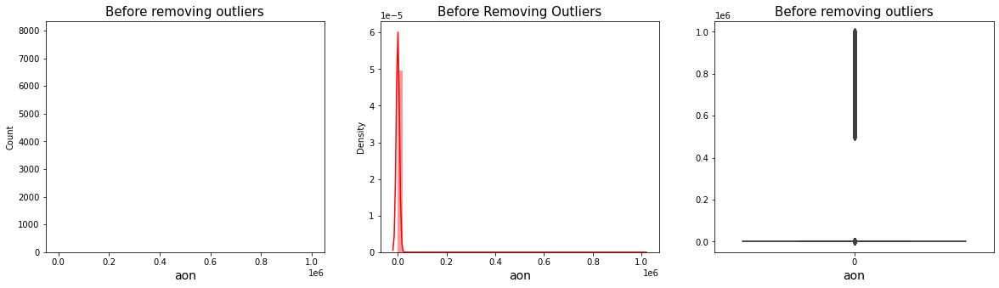

In [1343]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['aon']) #visualize the outliers by using histplot
plt.title('Before removing outliers', fontsize=15)
plt.xlabel('aon', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['aon'], color='r') #visualize the normalization curve by using distplot
plt.title('Before Removing Outliers', fontsize=15)
plt.xlabel('aon', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['aon']) #visualize the outliers by using boxplot
plt.title('Before removing outliers', fontsize=15)
plt.xlabel('aon', fontsize= 14)
plt.show()

In [1344]:
df['aon'].value_counts(bins = 4) #check the counts of unique values

(-1047.91, 249929.189]      207504
(749883.566, 999860.755]      1049
(499906.378, 749883.566]      1040
(249929.189, 499906.378]         0
Name: aon, dtype: int64

In [1345]:
df['aon'] = np.log(df['aon']) #scale the whole column

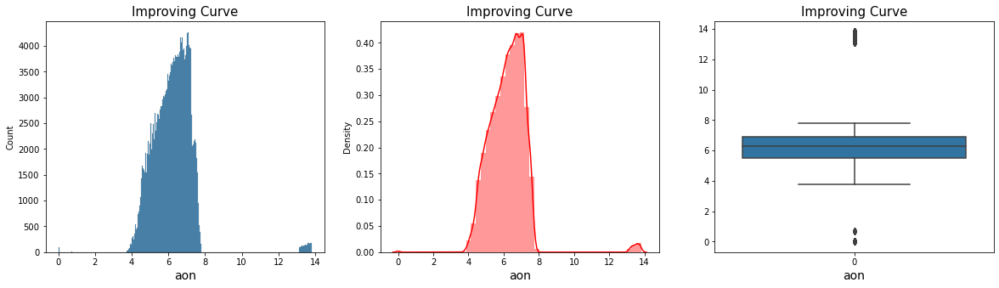

In [1346]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['aon']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('aon', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['aon'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('aon', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['aon']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('aon', fontsize= 14)
plt.show()

In [1347]:
df=df[df['aon']>2].reset_index(drop=True) #drop the low level outliers 

In [1348]:
df=df[df['aon']<13].reset_index(drop=True) #drop the high level outliers 

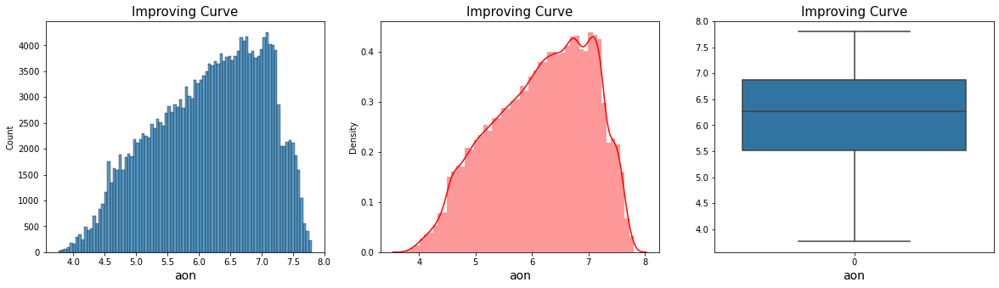

In [1349]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['aon']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('aon', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['aon'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('aon', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['aon']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('aon', fontsize= 14)
plt.show()

In [1350]:
# Calculate mean, median, mode and std to check the normalization curve
print('Mean of the column:----->',df['aon'].mean())
print('Median of the column:----->',df['aon'].median())
print('Mode of the column:----->',st.mode(df['aon']))
print('std of the column:----->',df['aon'].std())

Mean of the column:-----> 6.166426567704083
Median of the column:-----> 6.263398262591624
Mode of the column:-----> 4.553876891600541
std of the column:-----> 0.8663149738581036


In [1351]:
df['aon'] = df['aon'].replace(4.553876891600541,df['aon'].mean())

In [1352]:
# Calculate mean, median, mode and std to check the normalization curve
print('Mean of the column:----->',df['aon'].mean())
print('Median of the column:----->',df['aon'].median())
print('Mode of the column:----->',st.mode(df['aon']))
print('std of the column:----->',df['aon'].std())

Mean of the column:-----> 6.1694972404187896
Median of the column:-----> 6.263398262591624
Mode of the column:-----> 6.166426567704083
std of the column:-----> 0.8634469112277342


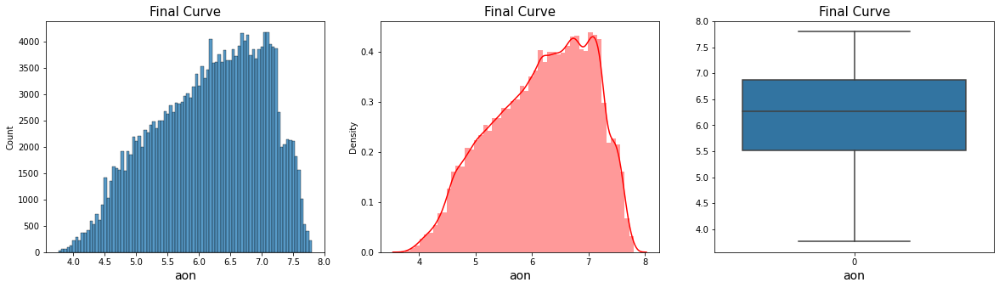

In [1353]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['aon']) #visualize the outliers by using histplot
plt.title('Final Curve', fontsize=15)
plt.xlabel('aon', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['aon'], color='r') #visualize the normalization curve by using distplot
plt.title('Final Curve', fontsize=15)
plt.xlabel('aon', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['aon']) #visualize the outliers by using boxplot
plt.title('Final Curve', fontsize=15)
plt.xlabel('aon', fontsize= 14)
plt.show()

In [1354]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['aon'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['aon'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['aon'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> -0.3431214803438746


correlation between the Features and with label:-----> (33, 33)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

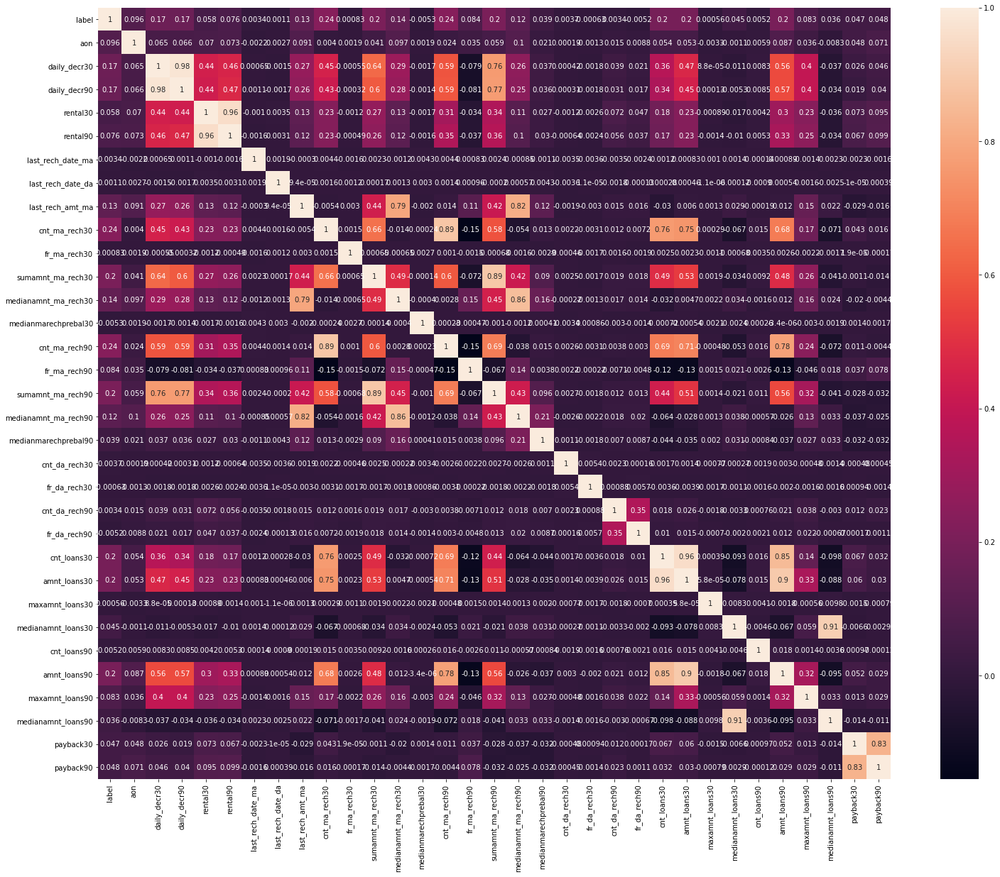

In [1355]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(25,20))
sns.heatmap(corr, annot=True)
plt.show 

Observation:
1. Column is highly negetive skewed
2. After scalling by np.log, skewness is improved
3. Mean, Median,Mode is also improved
4. As we can see by (group by) method, Mostly, life of cellular network is less in days. 
5. As we can see by histogram, this column doesnot have any multicollinearity with other columns.

In [1356]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (205857, 35)


# Column3: daily_decr30 - Daily amount spent from main account, averaged over last 30 days (in Indonesian Rupiah)

In [1357]:
df['daily_decr30'].unique() #check the unique values

array([ 3055.05      , 12122.        ,  1398.        , ...,
       11843.11166667, 12488.22833333,  4489.362     ])

In [1358]:
df['daily_decr30'].value_counts() #check the counts of unique values

0.000000        4093
500.000000       808
1000.000000      561
600.000000       340
700.000000       337
                ... 
11056.795000       1
113.342667         1
19.796000          1
3033.510000        1
8025.668000        1
Name: daily_decr30, Length: 145353, dtype: int64

In [1359]:
df['daily_decr30'].value_counts(bins = 10) #check the counts of unique values

(-359.03299999999996, 26508.889]    198641
(26508.889, 53110.79]                 6257
(53110.79, 79712.691]                  726
(79712.691, 106314.592]                172
(106314.592, 132916.494]                40
(132916.494, 159518.395]                 9
(159518.395, 186120.296]                 9
(186120.296, 212722.197]                 2
(239324.099, 265926.0]                   1
(212722.197, 239324.099]                 0
Name: daily_decr30, dtype: int64

In [1360]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['daily_decr30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['daily_decr30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['daily_decr30'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 3.9178726753237396


In [1361]:
df['daily_decr30'] = df['daily_decr30'].replace(0.0, df['daily_decr30'].mean()) #replace mode by mean value

In [1362]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['daily_decr30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['daily_decr30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['daily_decr30'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 3.9282137626599343


In [1363]:
df['daily_decr30'].value_counts(bins = 10) #check the counts of unique values

(-359.03299999999996, 26508.889]    198641
(26508.889, 53110.79]                 6257
(53110.79, 79712.691]                  726
(79712.691, 106314.592]                172
(106314.592, 132916.494]                40
(132916.494, 159518.395]                 9
(159518.395, 186120.296]                 9
(186120.296, 212722.197]                 2
(239324.099, 265926.0]                   1
(212722.197, 239324.099]                 0
Name: daily_decr30, dtype: int64

In [1364]:
df.groupby('label')['daily_decr30'].value_counts()
#check the relationship between column and label

label  daily_decr30 
0      5421.149495      3572
       500.000000        529
       1000.000000       270
       700.000000        155
       600.000000        143
                        ... 
1      183850.000000       1
       185313.000000       1
       212202.000000       1
       212364.000000       1
       265926.000000       1
Name: daily_decr30, Length: 149037, dtype: int64

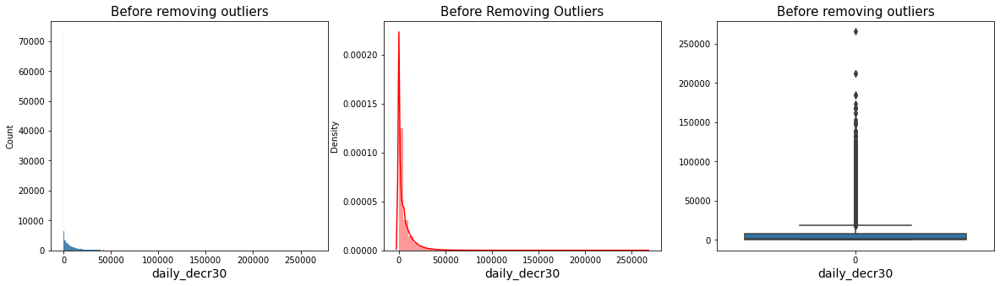

In [1365]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['daily_decr30']) #visualize the outliers by using histplot
plt.title('Before removing outliers', fontsize=15)
plt.xlabel('daily_decr30', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['daily_decr30'], color='r') #visualize the normalization curve by using distplot
plt.title('Before Removing Outliers', fontsize=15)
plt.xlabel('daily_decr30', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['daily_decr30']) #visualize the outliers by using boxplot
plt.title('Before removing outliers', fontsize=15)
plt.xlabel('daily_decr30', fontsize= 14)
plt.show()

In [1366]:
# Calculate mean, median, mode and std to check the normalization curve
print('Mean of the column:----->',df['daily_decr30'].mean())
print('Median of the column:----->',df['daily_decr30'].median())
print('Mode of the column:----->',st.mode(df['daily_decr30']))
print('std of the column:----->',df['daily_decr30'].std())

Mean of the column:-----> 5528.936769462167
Median of the column:-----> 1804.8
Mode of the column:-----> 5421.149495361601
std of the column:-----> 9204.371812397563


In [1367]:
df['daily_decr30'] = np.log(df['daily_decr30']) # scale the data

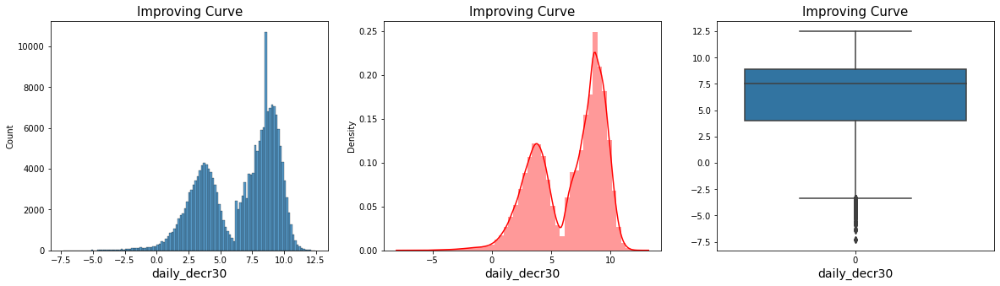

In [1368]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['daily_decr30']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('daily_decr30', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['daily_decr30'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('daily_decr30', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['daily_decr30']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('daily_decr30', fontsize= 14)
plt.show()

In [1369]:
# Calculate mean, median, mode and std to check the normalization curve
print('Mean of the column:----->',df['daily_decr30'].mean())
print('Median of the column:----->',df['daily_decr30'].median())
print('Mode of the column:----->',st.mode(df['daily_decr30']))
print('std of the column:----->',df['daily_decr30'].std())

Mean of the column:-----> 6.559173778642749
Median of the column:-----> 7.545865322216723
Mode of the column:-----> 8.598063155962112
std of the column:-----> 2.847094429290356


In [1370]:
df=df[df['daily_decr30']>-3].reset_index(drop=True) #treating the outliers

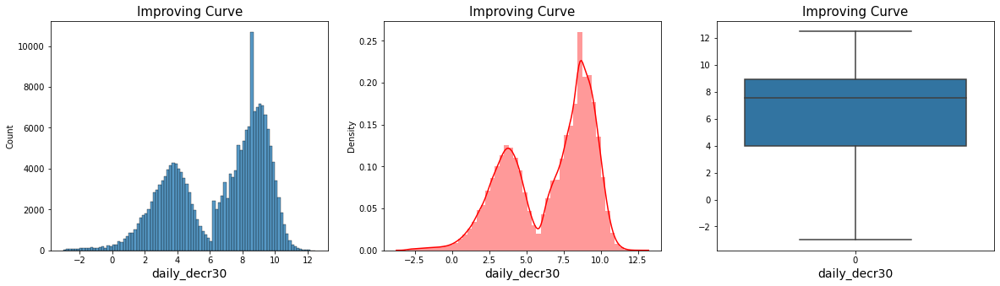

In [1371]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['daily_decr30']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('daily_decr30', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['daily_decr30'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('daily_decr30', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['daily_decr30']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('daily_decr30', fontsize= 14)
plt.show()

In [1372]:
# Calculate mean, median, mode and std to check the normalization curve
print('Mean of the column:----->',df['daily_decr30'].mean())
print('Median of the column:----->',df['daily_decr30'].median())
print('Mode of the column:----->',st.mode(df['daily_decr30']))
print('std of the column:----->',df['daily_decr30'].std())

Mean of the column:-----> 6.574098124229187
Median of the column:-----> 7.5504509160459845
Mode of the column:-----> 8.598063155962112
std of the column:-----> 2.82122859270934


In [1373]:
df['daily_decr30'] = df['daily_decr30'].replace(8.598063155962112, df['daily_decr30'].mean())
#replacing mode value by mean value

In [1374]:
# Calculate mean, median, mode and std to check the normalization curve
print('Mean of the column:----->',df['daily_decr30'].mean())
print('Median of the column:----->',df['daily_decr30'].median())
print('Mode of the column:----->',st.mode(df['daily_decr30']))
print('std of the column:----->',df['daily_decr30'].std())

Mean of the column:-----> 6.533441416116294
Median of the column:-----> 7.3613754289773485
Mode of the column:-----> 6.574098124229187
std of the column:-----> 2.8063124624519586


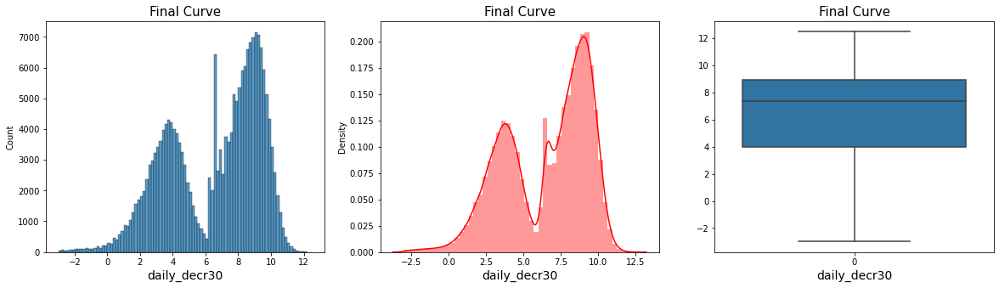

In [1375]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['daily_decr30']) #visualize the outliers by using histplot
plt.title('Final Curve', fontsize=15)
plt.xlabel('daily_decr30', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['daily_decr30'], color='r') #visualize the normalization curve by using distplot
plt.title('Final Curve', fontsize=15)
plt.xlabel('daily_decr30', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['daily_decr30']) #visualize the outliers by using boxplot
plt.title('Final Curve', fontsize=15)
plt.xlabel('daily_decr30', fontsize= 14)
plt.show()

In [1376]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['daily_decr30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['daily_decr30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['daily_decr30'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> -0.516545766719827


In [1377]:
df.groupby('label')['daily_decr30'].value_counts()
#check the relationship between column and label

label  daily_decr30
0      6.574098        3572
       6.214608         529
       6.907755         270
       6.551080         155
       6.396930         143
                       ... 
1      12.121875          1
       12.129802          1
       12.265294          1
       12.266057          1
       12.490973          1
Name: daily_decr30, Length: 148201, dtype: int64

correlation between the Features and with label:-----> (33, 33)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

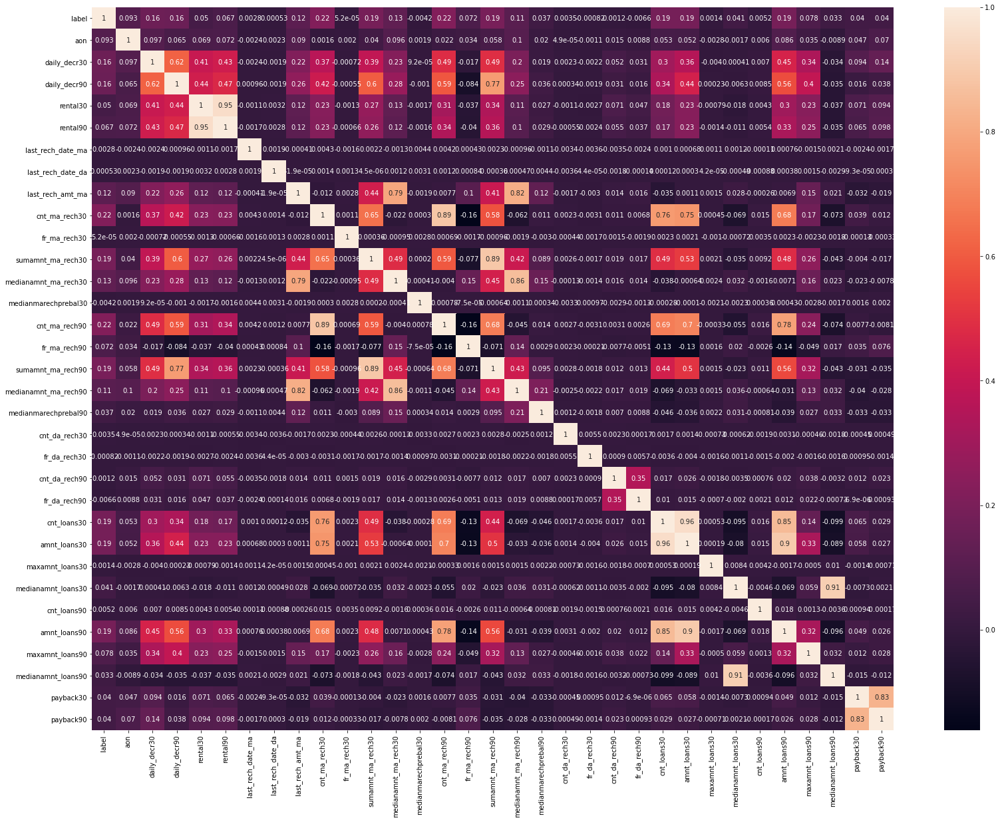

In [1378]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

Observation:
- Data Cleaning
1. 4093 data contains zero values, so, we replace them by column mean value
2. Column is highly skewed but after scalling it will improved from 3.92 to -0.51
3. No null values are found
4. Huge amount of outliers are found thats why column is negative skewed
5. Mean, median, mode values are improved
- Results by EDA
1. Mostly, peoples are spending daily amount is less 26500 in indonesian rupiah
2. We can see, mainly people unable to pay back the amount where daily average amount is less.

In [1379]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (203757, 35)


# Column4: daily_decr90 - Daily amount spent from main account, averaged over last 90 days (in Indonesian Rupiah)

In [1380]:
df['daily_decr90'].unique() #check the unique values

array([ 3065.15      , 12124.75      ,  1398.        , ...,
         151.87233333, 12574.37      ,  4534.82      ])

In [1381]:
df['daily_decr90'].value_counts() #check the counts of unique values

0.00        4014
500.00       760
1000.00      482
600.00       303
700.00       301
            ... 
10870.35       1
5674.75        1
11850.67       1
7698.84        1
30525.39       1
Name: daily_decr90, Length: 156172, dtype: int64

In [1382]:
df['daily_decr90'].value_counts(bins=5) #check the counts of unique values

(-320.631, 64126.0]     202809
(64126.0, 128252.0]        878
(128252.0, 192378.0]        58
(192378.0, 256504.0]        10
(256504.0, 320630.0]         2
Name: daily_decr90, dtype: int64

In [1383]:
df.groupby('label')['daily_decr90'].value_counts()
#check the relationship between column and label

label  daily_decr90
0      0.00            3572
       500.00           529
       1000.00          271
       700.00           155
       600.00           143
                       ... 
1      231228.81          1
       244906.76          1
       254657.13          1
       259525.00          1
       320630.00          1
Name: daily_decr90, Length: 160564, dtype: int64

In [1384]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['daily_decr90'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['daily_decr90'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['daily_decr90'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 4.218537807929994


In [1385]:
df['daily_decr90'] = df['daily_decr90'].replace(0.0, df['daily_decr90'].mean()) #replace mode by mean value

In [1386]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['daily_decr90'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['daily_decr90'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['daily_decr90'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 4.229401911246664


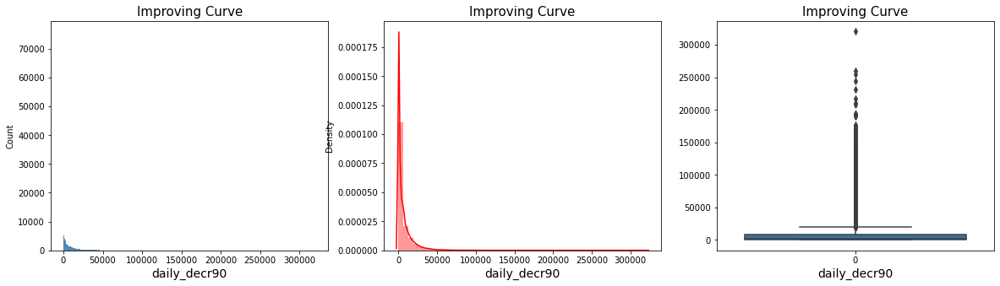

In [1387]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['daily_decr90']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('daily_decr90', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['daily_decr90'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('daily_decr90', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['daily_decr90']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('daily_decr90', fontsize= 14)
plt.show()

In [1388]:
df['daily_decr90'] = np.log(df['daily_decr90']) #scale the data

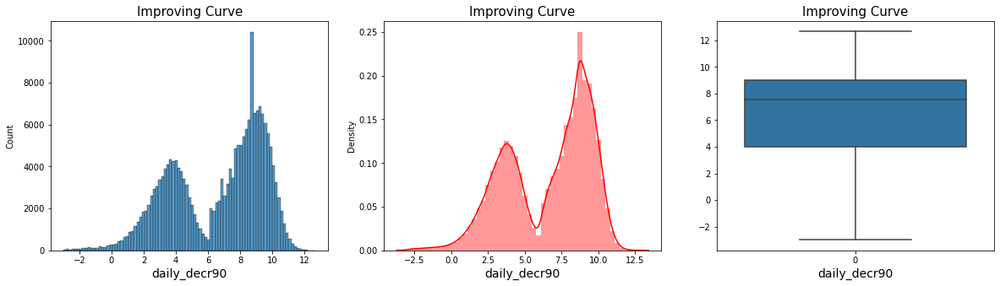

In [1389]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['daily_decr90']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('daily_decr90', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['daily_decr90'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('daily_decr90', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['daily_decr90']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('daily_decr90', fontsize= 14)
plt.show()

In [1390]:
df=df[df['daily_decr90']>0].reset_index(drop=True) #treating the outliers

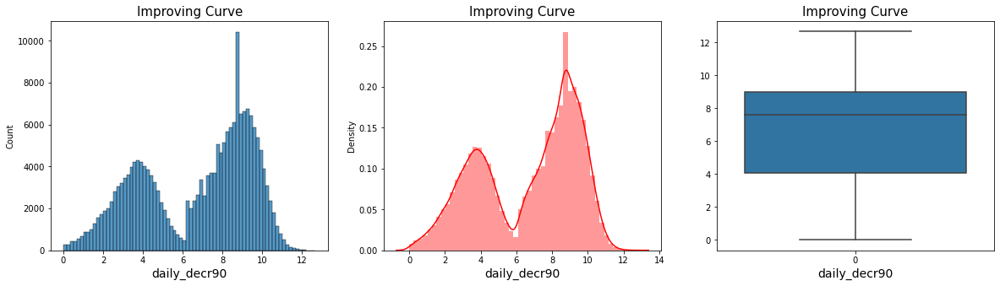

In [1391]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['daily_decr90']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('daily_decr90', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['daily_decr90'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('daily_decr90', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['daily_decr90']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('daily_decr90', fontsize= 14)
plt.show()

In [1392]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['daily_decr90'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['daily_decr90'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['daily_decr90'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> -0.4348061713936629


In [1393]:
# Calculate mean, median, mode and std to check the normalization curve
print('Mean of the column:----->',df['daily_decr90'].mean())
print('Median of the column:----->',df['daily_decr90'].median())
print('Mode of the column:----->',st.mode(df['daily_decr90']))
print('std of the column:----->',df['daily_decr90'].std())

Mean of the column:-----> 6.696406043214596
Median of the column:-----> 7.621474398685141
Mode of the column:-----> 8.730973346277299
std of the column:-----> 2.769950243648307


In [1394]:
df['daily_decr90'] = df['daily_decr90'].replace(8.730973346277299,df['daily_decr90'].mean())

In [1395]:
# Calculate mean, median, mode and std to check the normalization curve
print('Mean of the column:----->',df['daily_decr90'].mean())
print('Median of the column:----->',df['daily_decr90'].median())
print('Mode of the column:----->',st.mode(df['daily_decr90']))
print('std of the column:----->',df['daily_decr90'].std())

Mean of the column:-----> 6.655935901663348
Median of the column:-----> 7.432483807917119
Mode of the column:-----> 6.696406043214596
std of the column:-----> 2.7547498755844786


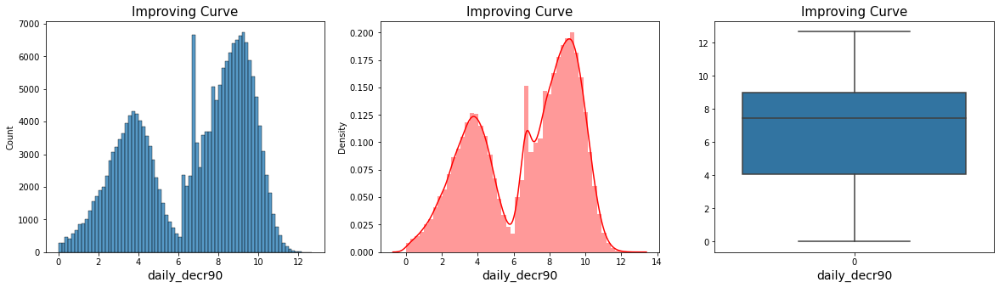

In [1396]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['daily_decr90']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('daily_decr90', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['daily_decr90'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('daily_decr90', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['daily_decr90']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('daily_decr90', fontsize= 14)
plt.show()

In [1397]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['daily_decr90'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['daily_decr90'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['daily_decr90'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> -0.40598065622117246


In [1398]:
df.groupby('label')['daily_decr90'].value_counts()
#check the relationship between column and label

label  daily_decr90
0      6.696406        3572
       6.214608         529
       6.907755         271
       6.551080         155
       6.396930         143
                       ... 
1      12.351163          1
       12.408633          1
       12.447673          1
       12.466608          1
       12.678043          1
Name: daily_decr90, Length: 159717, dtype: int64

correlation between the Features and with label:-----> (33, 33)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

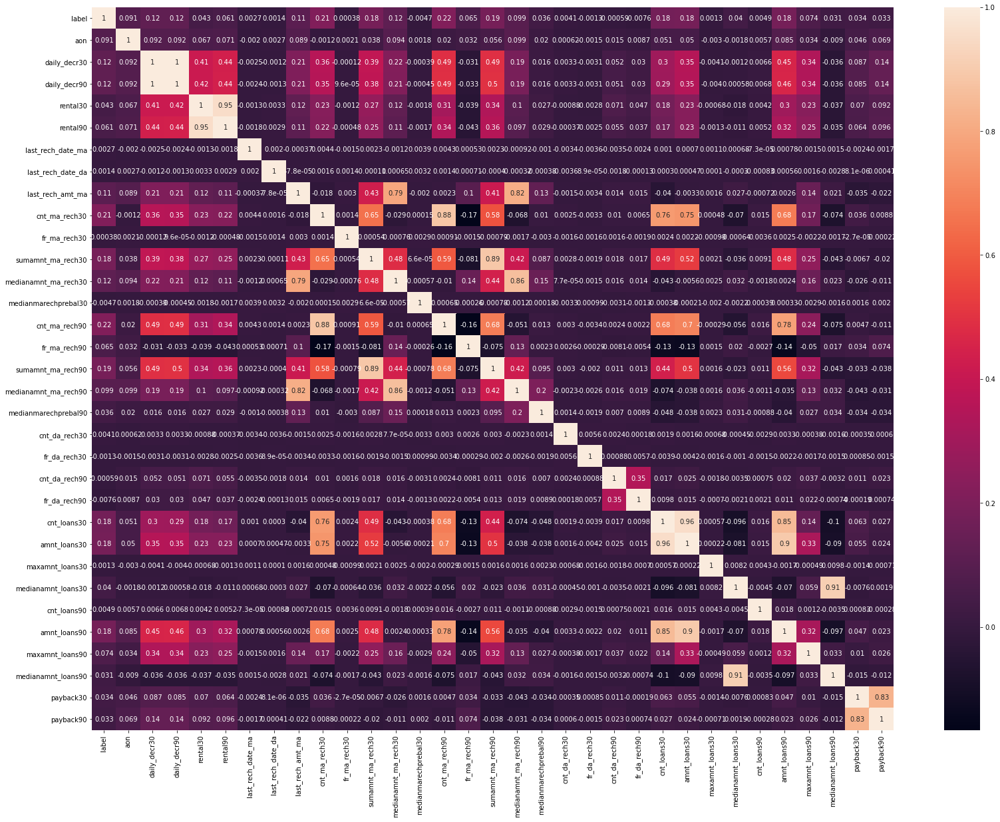

In [1399]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

Observation:
- Data Cleaning
1. 4014 zero values are found and replaced by column mean value
2. skewness is improved from 4.22 to -0.40
3. data in this column is negatively skewed, so, we need scalling to improve curve
4. Mean, median, mode values are improved
- Result by EDA
1. We can see by histogram, Daily-Decr-30 and Daily-decr-90 are highly related to each other, so, we can easily drop one column at the end. 
2. We can see, mainly people unable to pay back the amount where daily average amount is less.

In [1400]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (201797, 35)


# Column5: rental30 - Average main account balance over last 30 days

In [1401]:
df['rental30'].unique() #check the unique values

array([ 220.13, 3691.26,  900.13, ..., 5861.83,  411.83,  483.92])

In [1402]:
df['rental30'].value_counts() #check the counts of unique values

0.00       6091
200.13     1352
99.56       962
400.26      527
199.12      448
           ... 
4060.62       1
755.25        1
2592.08       1
1042.73       1
677.66        1
Name: rental30, Length: 129412, dtype: int64

In [1403]:
df['rental30'].value_counts(bins=30) #check the counts of unique values

(-1470.815, 5951.293]       174040
(5951.293, 13373.402]        20569
(13373.402, 20795.51]         5294
(20795.51, 28217.618]         1093
(-8892.923, -1470.815]         303
(28217.618, 35639.727]         268
(35639.727, 43061.835]         100
(43061.835, 50483.943]          64
(50483.943, 57906.052]          29
(57906.052, 65328.16]           16
(65328.16, 72750.268]            5
(72750.268, 80172.377]           5
(102438.702, 109860.81]          3
(-23959.804, -16315.032]         1
(146971.352, 154393.46]          1
(117282.918, 124705.027]         1
(87594.485, 95016.593]           1
(95016.593, 102438.702]          1
(-16315.032, -8892.923]          1
(80172.377, 87594.485]           1
(191504.002, 198926.11]          1
(109860.81, 117282.918]          0
(124705.027, 132127.135]         0
(132127.135, 139549.243]         0
(139549.243, 146971.352]         0
(154393.46, 161815.568]          0
(161815.568, 169237.677]         0
(169237.677, 176659.785]         0
(176659.785, 184081.

In [1404]:
df.groupby('label')['rental30'].value_counts()
#check the relationship between column and label

label  rental30 
0      0.00         2352
       99.56         134
       200.13        105
       434.78         80
       24.00          56
                    ... 
1      104277.59       1
       107663.98       1
       124355.64       1
       147045.42       1
       198926.11       1
Name: rental30, Length: 134651, dtype: int64

In [1405]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['rental30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['rental30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['rental30'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 4.464917519461373


In [1406]:
df['rental30'] = df['rental30'].replace(0.0, df['rental30'].mean()) #treating the zero values

In [1407]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['rental30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['rental30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['rental30'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 4.4996385930331435


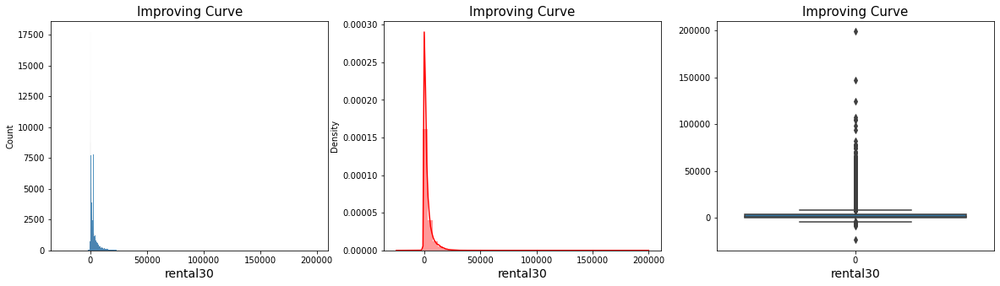

In [1408]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['rental30']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('rental30', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['rental30'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('rental30', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['rental30']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('rental30', fontsize= 14)
plt.show()

In [1409]:
df['rental30'] = np.log(df['rental30']) #scalling the column

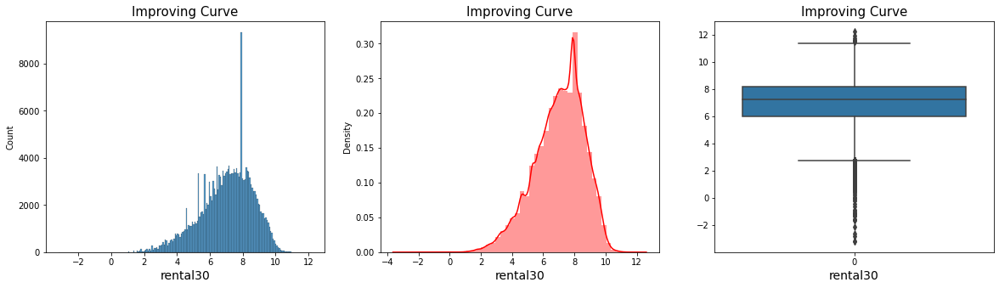

In [1410]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['rental30']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('rental30', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['rental30'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('rental30', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['rental30']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('rental30', fontsize= 14)
plt.show()

In [1411]:
df=df[df['rental30']>3].reset_index(drop=True) #removing the lower side outliers

In [1412]:
df=df[df['rental30']<11].reset_index(drop=True) #removing the higher side outliers

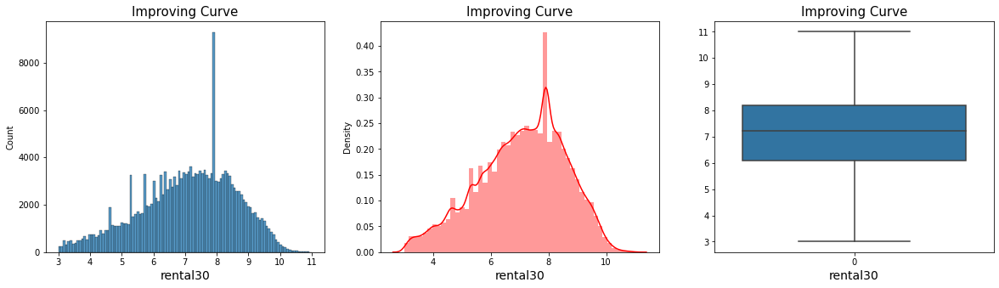

In [1413]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['rental30']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('rental30', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['rental30'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('rental30', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['rental30']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('rental30', fontsize= 14)
plt.show()

In [1414]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['rental30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['rental30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['rental30'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> -0.3791768630158064


correlation between the Features and with label:-----> (33, 33)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

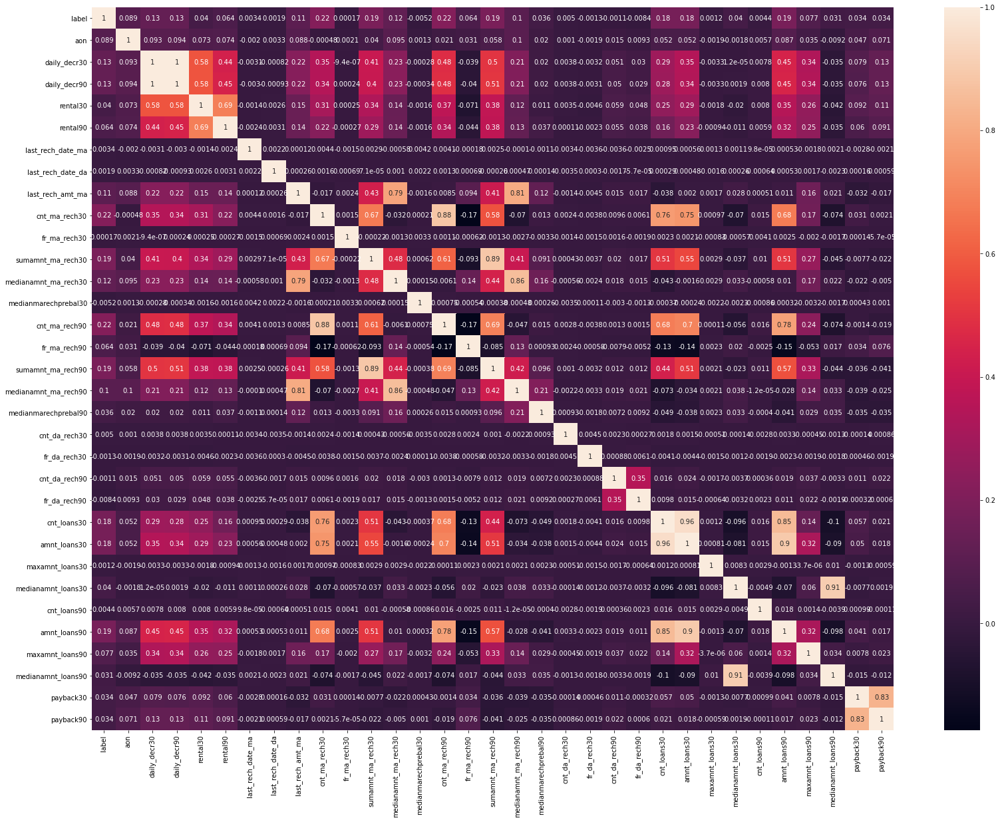

In [1415]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

Observation:
- Data Cleaning
1. 6091 zero values are found and replaced by column mean value
2. skewness is improved from 4.46 to -0.38
3. data in this column is negatively skewed, so, we need scalling to improve curve
4. Mean, median, mode values are improved
- Result by EDA
1. We can see by histogram, rental-30 and rental-90 are highly related to each other, so, we can easily drop one column at the end. 
2. We can see, mainly people unable to pay back the amount where average main balance is less.

In [1416]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (193567, 35)


# Column6: rental90 - Average main account balance over last 90 days

In [1417]:
df['rental90'].unique() #check the unique values

array([ 260.13, 3691.26,  900.13, ..., 1728.36, 8893.2 ,  984.58])

In [1418]:
df['rental90'].value_counts() #check the counts of unique values

0.00       5451
200.13      890
99.56       714
90.00       658
60.00       644
           ... 
1513.19       1
703.22        1
2841.02       1
1899.33       1
1852.14       1
Name: rental90, Length: 133279, dtype: int64

In [1419]:
df['rental90'].value_counts(bins=15) #check the counts of unique values

(-5214.241, 2175.651]     112632
(2175.651, 9456.331]       60165
(9456.331, 16737.012]      12986
(16737.012, 24017.693]      4823
(24017.693, 31298.373]      1816
(31298.373, 38579.054]       672
(38579.054, 45859.735]       248
(45859.735, 53140.415]       103
(53140.415, 60421.096]        50
(60421.096, 67701.777]        41
(67701.777, 74982.457]        20
(74982.457, 82263.138]         6
(82263.138, 89543.819]         3
(89543.819, 96824.499]         1
(96824.499, 104105.18]         1
Name: rental90, dtype: int64

In [1420]:
df.groupby('label')['rental90'].value_counts()
#check the relationship between column and label

label  rental90 
0      0.00         2352
       60.00         210
       90.00         166
       99.56         134
       200.13        105
                    ... 
1      83242.48        1
       83599.81        1
       89121.76        1
       89887.04        1
       104105.18       1
Name: rental90, Length: 138033, dtype: int64

In [1421]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['rental90'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['rental90'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['rental90'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 3.4356269158606465


In [1422]:
df['rental90'] = df['rental90'].replace(0.0, df['rental90'].mean()) #replace the zero by column mean value

In [1423]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['rental90'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['rental90'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['rental90'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 3.451818812729955


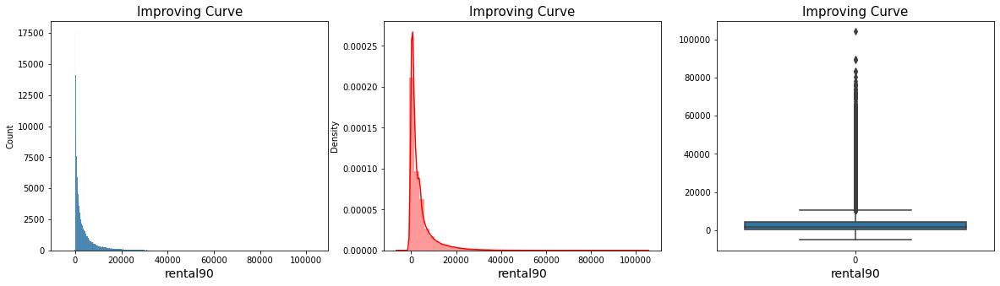

In [1424]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['rental90']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('rental90', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['rental90'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('rental90', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['rental90']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('rental90', fontsize= 14)
plt.show()

In [1425]:
df['rental90'] = np.log(df['rental90']) #scaling the column

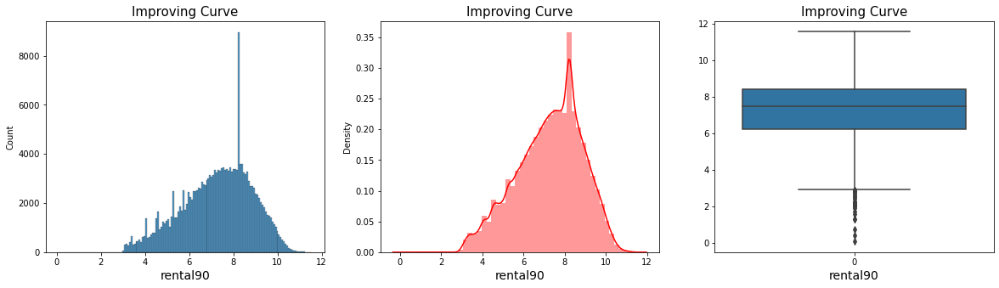

In [1426]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['rental90']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('rental90', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['rental90'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('rental90', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['rental90']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('rental90', fontsize= 14)
plt.show()

In [1427]:
df=df[df['rental90']>3].reset_index(drop=True) #treating the outliers

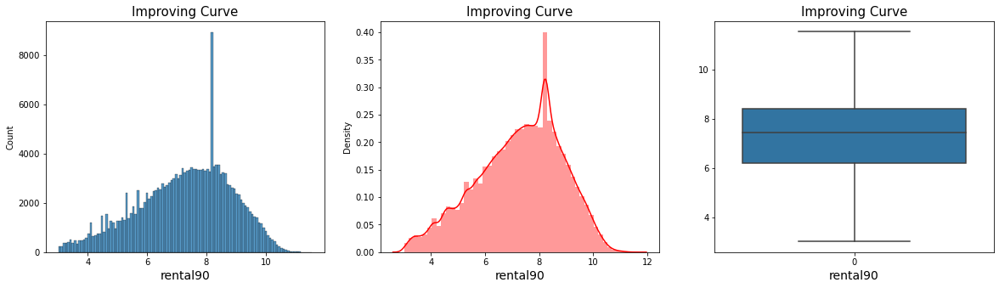

In [1428]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['rental90']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('rental90', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['rental90'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('rental90', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['rental90']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('rental90', fontsize= 14)
plt.show()

In [1429]:
# Calculate mean, median, mode and std to check the normalization curve
print('Mean of the column:----->',df['rental90'].mean())
print('Median of the column:----->',df['rental90'].median())
print('Mode of the column:----->',st.mode(df['rental90']))
print('std of the column:----->',df['rental90'].std())

Mean of the column:-----> 7.272226755492809
Median of the column:-----> 7.457730459523701
Mode of the column:-----> 8.215906478550044
std of the column:-----> 1.57941180193799


In [1430]:
df['rental90'] = df['rental90'].replace(8.215906478550044,df['rental90'].mean())
#replacing the mode value by mean value

In [1431]:
# Calculate mean, median, mode and std to check the normalization curve
print('Mean of the column:----->',df['rental90'].mean())
print('Median of the column:----->',df['rental90'].median())
print('Mode of the column:----->',st.mode(df['rental90']))
print('std of the column:----->',df['rental90'].std())

Mean of the column:-----> 7.245608808189392
Median of the column:-----> 7.333088371727768
Mode of the column:-----> 7.272226755492809
std of the column:-----> 1.5712142356139729


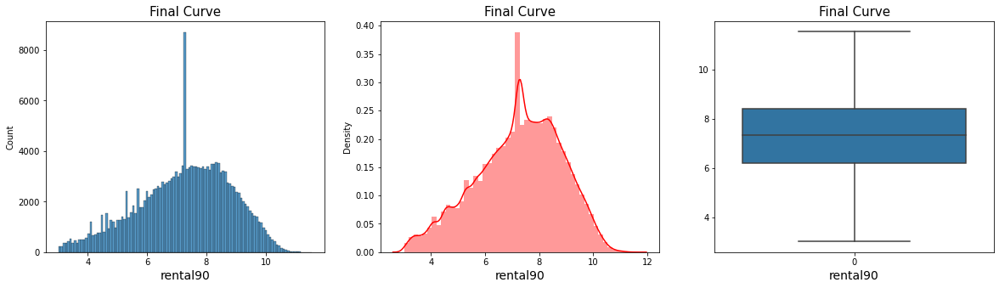

In [1432]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['rental90']) #visualize the outliers by using histplot
plt.title('Final Curve', fontsize=15)
plt.xlabel('rental90', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['rental90'], color='r') #visualize the normalization curve by using distplot
plt.title('Final Curve', fontsize=15)
plt.xlabel('rental90', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['rental90']) #visualize the outliers by using boxplot
plt.title('Final Curve', fontsize=15)
plt.xlabel('rental90', fontsize= 14)
plt.show()

In [1433]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['rental90'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['rental90'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['rental90'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> -0.35162724337806767


correlation between the Features and with label:-----> (33, 33)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

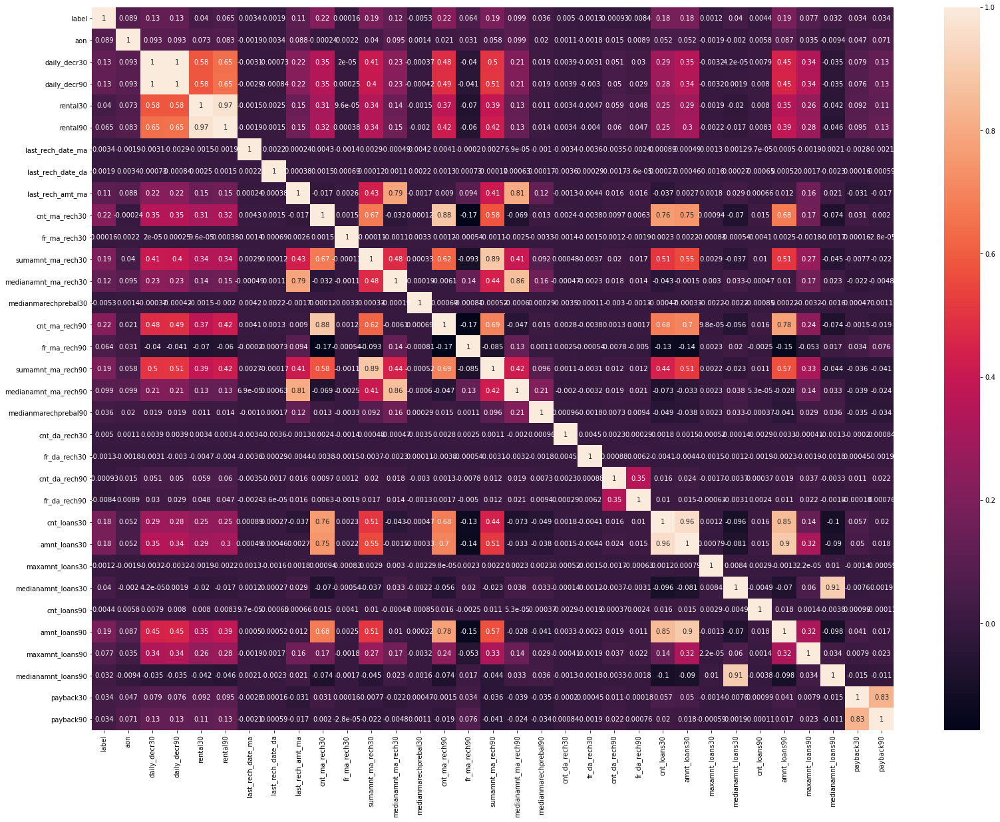

In [1434]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

Observation:
- Data Cleaning
1. 5451 zero values are found and replaced by column mean value
2. skewness is improved from 3.43 to -0.35
3. data in this column is negatively skewed, so, we need scalling to improve curve
4. Mean, median, mode values are improved
- Result by EDA
1. We can see by histogram, rental-30 and rental-90 are highly related to each other, so, we can easily drop one column at the end. 
2. We can see, mainly people unable to pay back the amount where average main balance is less.

In [1435]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (193253, 35)


# Column7: last_rech_date_ma - Number of days till last recharge of main account

In [1436]:
df['last_rech_date_ma'].unique() #check the unique values

array([2.00000000e+00, 2.00000000e+01, 3.00000000e+00, ...,
       7.17893572e+05, 6.11678500e+05, 5.90843122e+05])

In [1437]:
df['last_rech_date_ma'].value_counts() #check the counts of unique values

1.000000         44170
2.000000         25627
3.000000         19067
0.000000         15959
4.000000         14655
                 ...  
824616.273632        1
931546.437088        1
740555.920987        1
826835.412416        1
700461.145723        1
Name: last_rech_date_ma, Length: 1121, dtype: int64

In [1438]:
df['last_rech_date_ma'].value_counts(bins=15) #check the counts of unique values

(-1027.68, 66549.625]       192271
(532600.001, 599178.627]       147
(865493.127, 932071.753]       140
(665757.252, 732335.877]       135
(798914.502, 865493.127]       135
(932071.753, 998650.378]       131
(599178.627, 665757.252]       128
(732335.877, 798914.502]       111
(466021.376, 532600.001]        55
(66549.625, 133128.25]           0
(133128.25, 199706.876]          0
(199706.876, 266285.501]         0
(266285.501, 332864.126]         0
(332864.126, 399442.751]         0
(399442.751, 466021.376]         0
Name: last_rech_date_ma, dtype: int64

In [1439]:
df.groupby('label')['last_rech_date_ma'].value_counts()
#check the relationship between column and label

label  last_rech_date_ma
0      0.000000             6273
       2.000000             1809
       1.000000             1271
       3.000000             1222
       4.000000             1005
                            ... 
1      993905.540090           1
       994295.955985           1
       994622.180471           1
       997717.809631           1
       998650.377733           1
Name: last_rech_date_ma, Length: 1214, dtype: int64

In [1440]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['last_rech_date_ma'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['last_rech_date_ma'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['last_rech_date_ma'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 14.660822784028634


In [1441]:
df.drop(columns = 'last_rech_date_ma', inplace = True) #drop the column

correlation between the Features and with label:-----> (32, 32)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

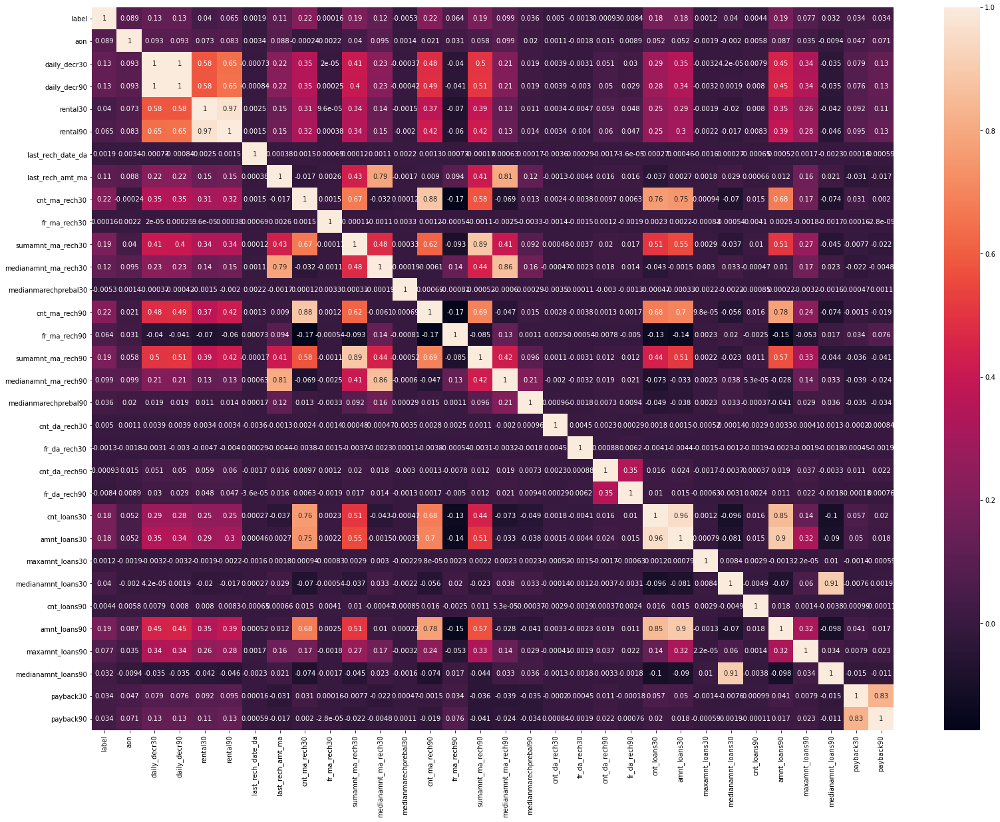

In [1442]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

Observation:
1. column is highly skewed, so, it is better to drop this column

In [1443]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (193253, 34)


# Column8: last_rech_date_da - Number of days till last recharge of data account

In [1444]:
df['last_rech_date_da'].unique() #check the unique values

array([0.00000000e+00, 5.50000000e+01, 6.30000000e+01, ...,
       8.59210206e+05, 8.09043117e+05, 6.36529127e+05])

In [1445]:
df['last_rech_date_da'].value_counts() #check the counts of unique values

0.000000         186821
7.000000            157
8.000000            154
13.000000           146
11.000000           144
                  ...  
115.000000            1
986622.708268         1
563558.458467         1
740229.979390         1
617088.100524         1
Name: last_rech_date_da, Length: 1094, dtype: int64

In [1446]:
df['last_rech_date_da'].value_counts(bins=15) #check the counts of unique values

(-1028.202, 66584.387]      192283
(532878.098, 599491.486]       143
(666104.873, 732718.26]        139
(599491.486, 666104.873]       135
(932558.422, 999171.809]       134
(799331.648, 865945.035]       128
(732718.26, 799331.648]        115
(865945.035, 932558.422]       108
(466264.711, 532878.098]        68
(66584.387, 133197.775]          0
(133197.775, 199811.162]         0
(199811.162, 266424.549]         0
(266424.549, 333037.936]         0
(333037.936, 399651.324]         0
(399651.324, 466264.711]         0
Name: last_rech_date_da, dtype: int64

In [1447]:
df.groupby('label')['last_rech_date_da'].value_counts()
#check the relationship between column and label

label  last_rech_date_da
0      0.000000             20744
       17.000000               20
       7.000000                19
       16.000000               18
       24.000000               17
                            ...  
1      995848.999708            1
       996627.049171            1
       996923.219296            1
       997499.911347            1
       997920.294292            1
Name: last_rech_date_da, Length: 1167, dtype: int64

In [1448]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['last_rech_date_da'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['last_rech_date_da'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['last_rech_date_da'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 14.783112667473983


In [1449]:
df['last_rech_date_da'] = df['last_rech_date_da'].replace(0.0,df['last_rech_date_da'].mean())
#replace the zero value by column mean value

In [1450]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['last_rech_date_da'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['last_rech_date_da'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['last_rech_date_da'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 14.787303593331728


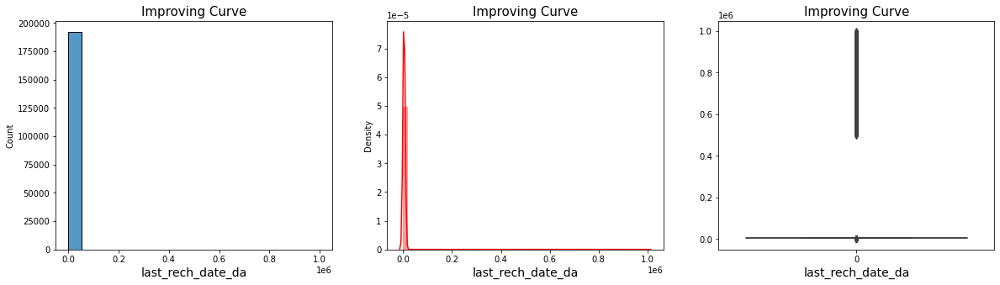

In [1451]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['last_rech_date_da']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('last_rech_date_da', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['last_rech_date_da'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('last_rech_date_da', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['last_rech_date_da']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('last_rech_date_da', fontsize= 14)
plt.show()

In [1452]:
df['last_rech_date_da'] = np.log(df['last_rech_date_da']) #scale the column to improve the curve

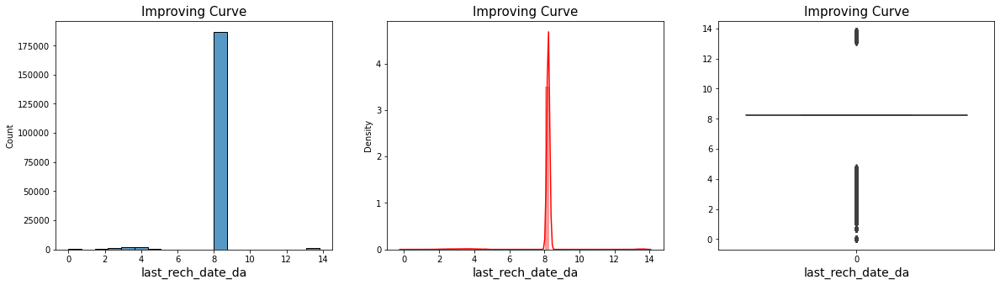

In [1453]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['last_rech_date_da']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('last_rech_date_da', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['last_rech_date_da'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('last_rech_date_da', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['last_rech_date_da']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('last_rech_date_da', fontsize= 14)
plt.show()

In [1454]:
# Calculate mean, median, mode and std to check the normalization curve
print('Mean of the column:----->',df['last_rech_date_da'].mean())
print('Median of the column:----->',df['last_rech_date_da'].median())
print('Mode of the column:----->',st.mode(df['last_rech_date_da']))
print('std of the column:----->',df['last_rech_date_da'].std())

Mean of the column:-----> 8.108569973144904
Median of the column:-----> 8.223430566195434
Mode of the column:-----> 8.223430566195434
std of the column:-----> 0.9265425805492142


In [1455]:
df.drop(columns= 'last_rech_date_da',inplace=True) #drop the column

Obsdervagtion:
1. Column is highly skewed, so, thats why we need to drop this column

correlation between the Features and with label:-----> (31, 31)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

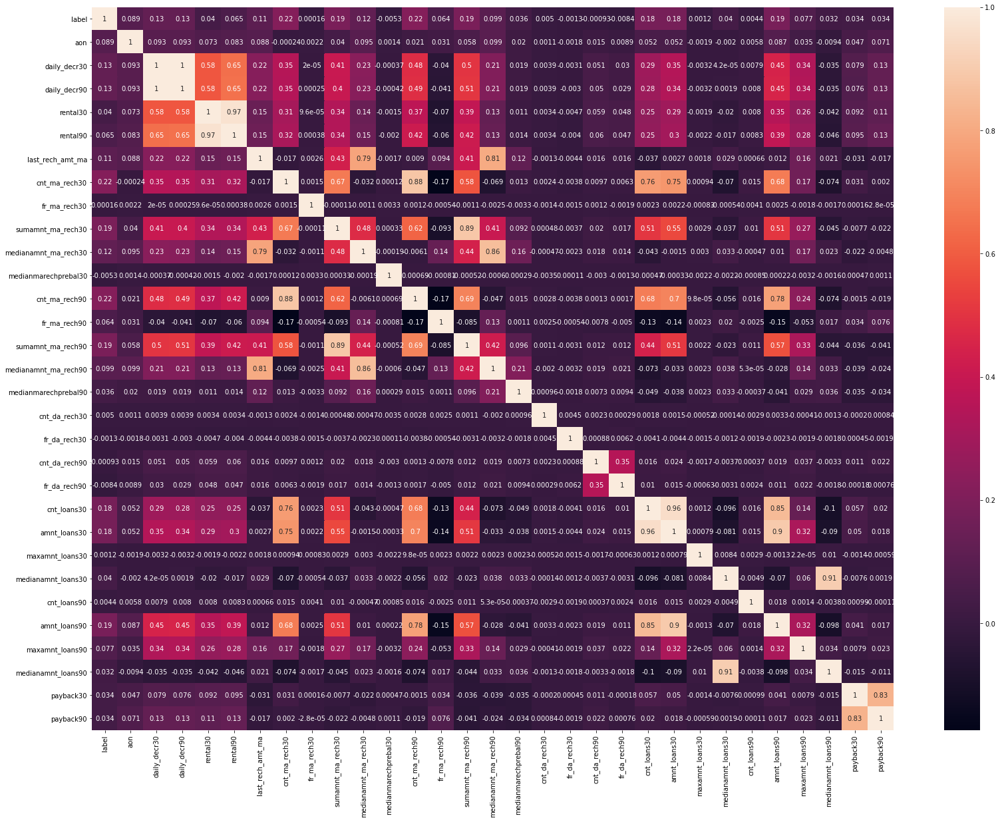

In [1456]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

In [1457]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (193253, 33)


# Column9: last_rech_amt_ma - Amount of last recharge of main account (in Indonesian Rupiah)

In [1458]:
df['last_rech_amt_ma'].unique() #check the unique values

array([ 1539,  5787,   947,  2309,  3178,   773,  7526,  1547,   770,
           0,  4048,  8000,   173,  1924,  2320,  4917,  2593, 10000,
        1720, 11874, 16000,  1333,  3193,  4067,  3467,  5814,  7400,
        7560,   777, 15400,  1933, 17391, 11927,  6960, 21739,  1554,
       11327,  4940,   790,  5214, 32000, 11900, 11000,  3466,  9400,
       55000, 12500,  4340,   769, 11004,  4066, 19130, 17467,  1580,
        4047, 14783,  6222,   177,   954, 19913,  1546,  1923, 22609,
         946,  7999,  1538, 15652,   772, 34783, 10454], dtype=int64)

In [1459]:
df['last_rech_amt_ma'].value_counts() #check the counts of unique values

1539     54563
770      40216
773      17432
0        16187
2309     15561
         ...  
34783        1
19913        1
946          1
14783        1
17467        1
Name: last_rech_amt_ma, Length: 70, dtype: int64

In [1460]:
df['last_rech_amt_ma'].value_counts(bins=15) #check the counts of unique values

(-55.001, 3666.667]       164678
(3666.667, 7333.333]       14934
(7333.333, 11000.0]        12350
(11000.0, 14666.667]        1092
(14666.667, 18333.333]       145
(29333.333, 33000.0]          23
(51333.333, 55000.0]          23
(18333.333, 22000.0]           6
(22000.0, 25666.667]           1
(33000.0, 36666.667]           1
(25666.667, 29333.333]         0
(36666.667, 40333.333]         0
(40333.333, 44000.0]           0
(44000.0, 47666.667]           0
(47666.667, 51333.333]         0
Name: last_rech_amt_ma, dtype: int64

In [1461]:
df.groupby('label')['last_rech_amt_ma'].value_counts()
#check the relationship between column and label

label  last_rech_amt_ma
0      0                   6397
       1539                3797
       770                 3731
       773                 2457
       2309                 924
                           ... 
1      15652                  1
       17467                  1
       19913                  1
       22609                  1
       34783                  1
Name: last_rech_amt_ma, Length: 118, dtype: int64

In [1462]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['last_rech_amt_ma'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['last_rech_amt_ma'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['last_rech_amt_ma'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 3.8501556670865837


In [1463]:
df['last_rech_amt_ma'] = df['last_rech_amt_ma'].replace(0.0,df['last_rech_amt_ma'].mean())
#replace the mode value by mean value

In [1464]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['last_rech_amt_ma'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['last_rech_amt_ma'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['last_rech_amt_ma'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 4.150350853181259


In [1465]:
df['last_rech_amt_ma'] = np.log(df['last_rech_amt_ma']) #scale the column

In [1466]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['last_rech_amt_ma'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['last_rech_amt_ma'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['last_rech_amt_ma'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 0.7201550072081019


Text(0, 0.5, 'daily_decr30')

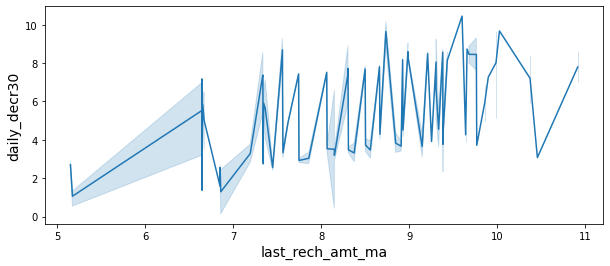

In [1467]:
#visualization
plt.figure(figsize=(10,4))
sns.lineplot(x= 'last_rech_amt_ma', y = 'daily_decr30', data=df)
plt.xlabel('last_rech_amt_ma', fontsize = 14)
plt.ylabel('daily_decr30', fontsize = 14)

Text(0, 0.5, 'rental30')

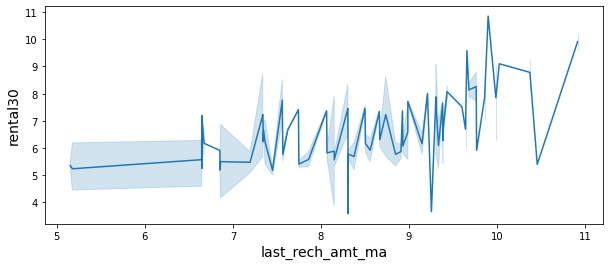

In [1468]:
#visualization
plt.figure(figsize=(10,4))
sns.lineplot(x= 'last_rech_amt_ma', y = 'rental30', data=df)
plt.xlabel('last_rech_amt_ma', fontsize = 14)
plt.ylabel('rental30', fontsize = 14)

Text(0, 0.5, 'aon')

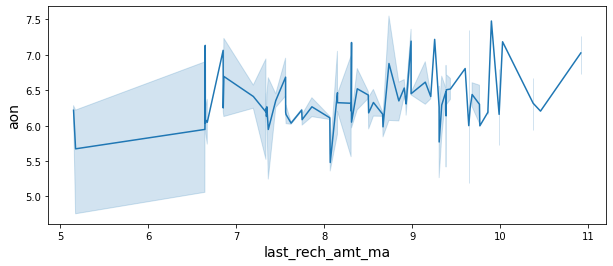

In [1469]:
#visualization
plt.figure(figsize=(10,4))
sns.lineplot(x= 'last_rech_amt_ma', y = 'aon', data=df)
plt.xlabel('last_rech_amt_ma', fontsize = 14)
plt.ylabel('aon', fontsize = 14)

correlation between the Features and with label:-----> (31, 31)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

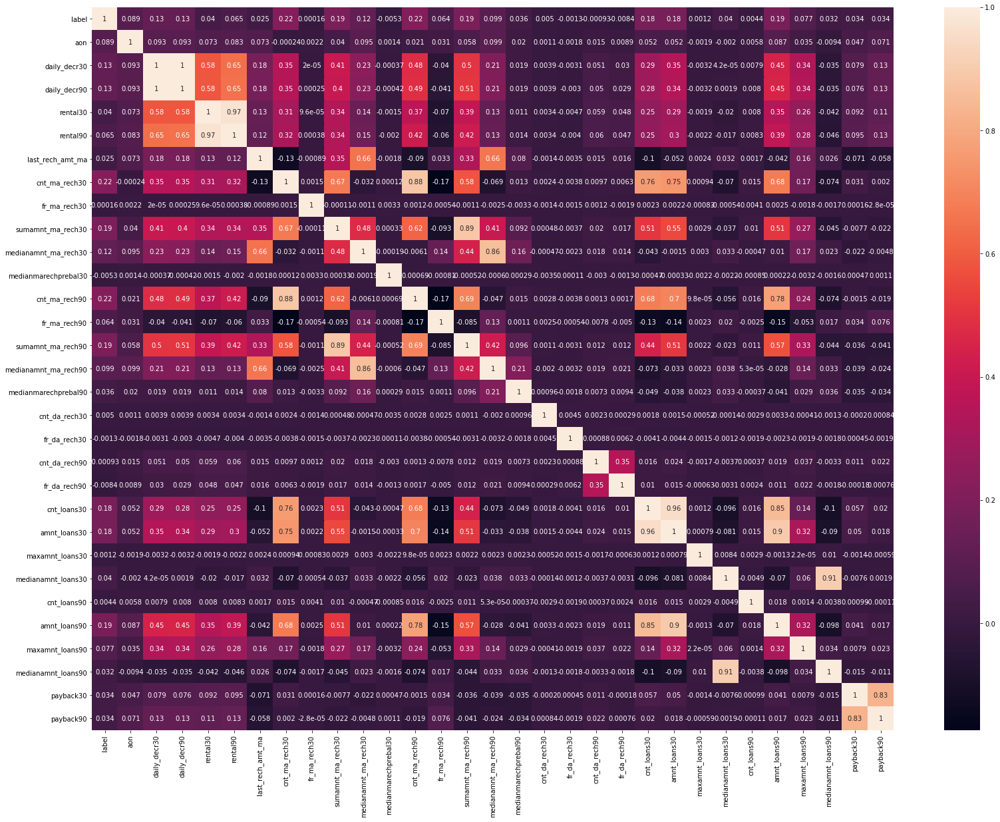

In [1470]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

Observations:
- Data Cleaning
1. More than 16000 zero values found and it will replaced by column mean
2. No Null values are found
3. Skewness is improved after scalling.
- Results by EDA
1. We can clearly analyze by value counts method, that people who do low amount of recharge are higher than others.
2. We can see here, the daily amount spent averaged over last 30 days is increasing as the last recharge amount is increasing
3. Avrage maion account balance is also proportional to last recharge amount
4. As the age of cellular network increases, the last recharge amount is increases.
5. this column have very less multicollinearity with other columns

In [1471]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (193253, 33)


# Column10: cnt_ma_rech30 - Number of times main account got recharged in last 30 days

In [1472]:
df['cnt_ma_rech30'].unique() #check the unique values

array([  2,   1,   0,   7,   4,   3,   5,  15,   6,   9,  10,  11,  13,
         8,  12,  16,  18,  19,  29,  17,  14,  21,  27,  22,  37,  23,
        20,  26,  25,  24,  34,  28,  32,  35,  31,  33,  40,  30,  41,
        36,  52,  38,  48,  61,  39,  54,  42,  44,  46,  45,  47,  49,
        43,  74,  58,  64,  59,  53,  51,  77,  78,  50,  91,  99, 115,
       203,  60,  71,  63,  55], dtype=int64)

In [1473]:
df['cnt_ma_rech30'].value_counts() #check the counts of unique values

1      32900
2      29139
3      24252
0      21981
4      19444
       ...  
77         1
78         1
91         1
99         1
115        1
Name: cnt_ma_rech30, Length: 70, dtype: int64

In [1474]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['cnt_ma_rech30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['cnt_ma_rech30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['cnt_ma_rech30'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 3.259686631995342


In [1475]:
df['cnt_ma_rech30'] = df['cnt_ma_rech30'].replace(0.0, df['cnt_ma_rech30'].mean())
#replace the zero value by mean value

In [1476]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['cnt_ma_rech30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['cnt_ma_rech30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['cnt_ma_rech30'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 3.707843601006016


In [1477]:
df['cnt_ma_rech30'] = np.log(df['cnt_ma_rech30']) #scale the column

In [1478]:
#check the skewness
print('Check the skewness in Column:---------->',df['cnt_ma_rech30'].skew())

Check the skewness in Column:----------> -0.010251416207682735


Text(0, 0.5, 'aon')

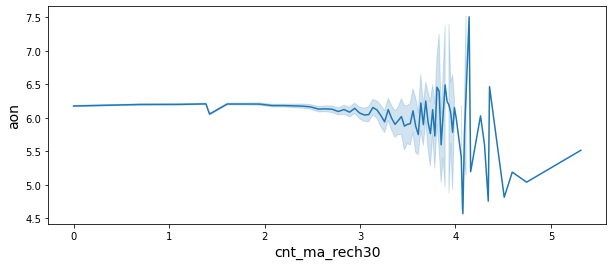

In [1479]:
#visualization
plt.figure(figsize=(10,4))
sns.lineplot(x= 'cnt_ma_rech30', y = 'aon', data=df)
plt.xlabel('cnt_ma_rech30', fontsize = 14)
plt.ylabel('aon', fontsize = 14)

Text(0, 0.5, 'daily_decr30')

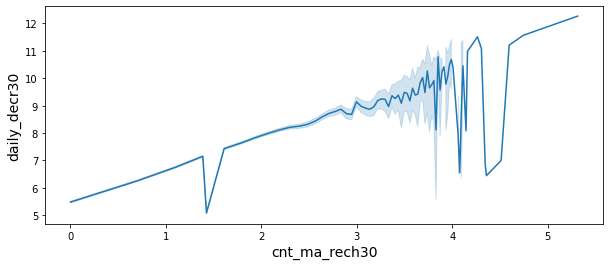

In [1480]:
#visualization
plt.figure(figsize=(10,4))
sns.lineplot(x= 'cnt_ma_rech30', y = 'daily_decr30', data=df)
plt.xlabel('cnt_ma_rech30', fontsize = 14)
plt.ylabel('daily_decr30', fontsize = 14)

Text(0, 0.5, 'rental30')

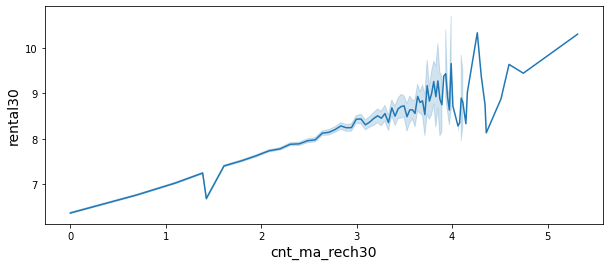

In [1481]:
#visualization
plt.figure(figsize=(10,4))
sns.lineplot(x= 'cnt_ma_rech30', y = 'rental30', data=df)
plt.xlabel('cnt_ma_rech30', fontsize = 14)
plt.ylabel('rental30', fontsize = 14)

Text(0, 0.5, 'last_rech_amt_ma')

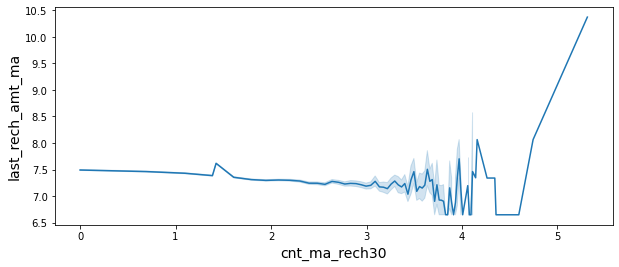

In [1482]:
#visualization
plt.figure(figsize=(10,4))
sns.lineplot(x= 'cnt_ma_rech30', y = 'last_rech_amt_ma', data=df)
plt.xlabel('cnt_ma_rech30', fontsize = 14)
plt.ylabel('last_rech_amt_ma', fontsize = 14)

Text(0, 0.5, 'label')

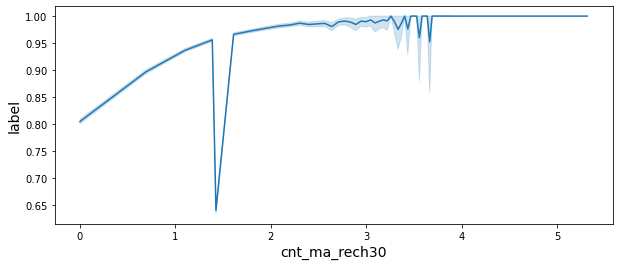

In [1483]:
#visualization
plt.figure(figsize=(10,4))
sns.lineplot(x= 'cnt_ma_rech30', y = 'label', data=df)
plt.xlabel('cnt_ma_rech30', fontsize = 14)
plt.ylabel('label', fontsize = 14)

correlation between the Features and with label:-----> (31, 31)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

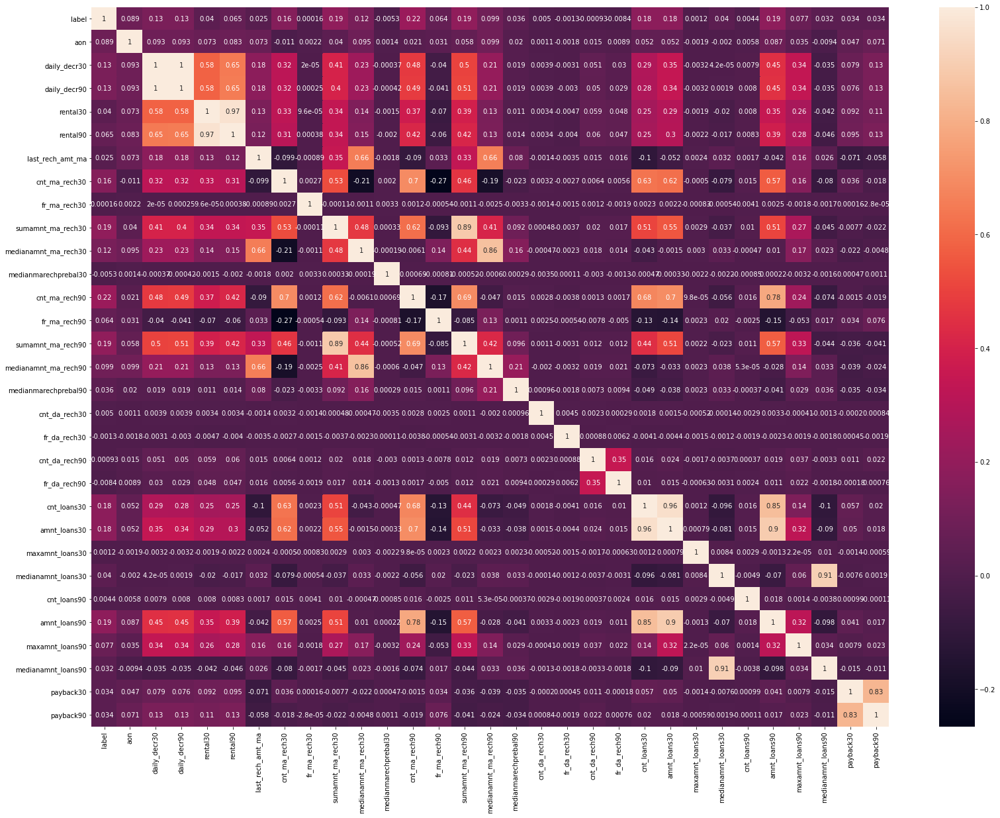

In [1484]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

Observation:
- Data Cleaning
1. Zero values are found and treated
2. skewness is improved from 3.25 to -0.01
3. No null values are found
- Results by EDA
1. One times recharge is more than others
2. Mostly people have done 4 times recharge when we compare it to age of celluar network in days
3. As the daily amount spent is increases, the main account got recharged more 
4. As we see,Number of times main account got recharged, the average main amount balance increases.
5. We can see clearly, people do recharge 4 times in 30 days, when their rechatge amount is less
6. We can see, people who do 1 0r 2 times recharge their success rate is less than others.
7. we see cleary by histogram, this column doesnot have much multicollinearity than any other column

In [1485]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (193253, 33)


# Column11: fr_ma_rech30 - Frequency of main account recharged in last 30 days

In [1486]:
df['fr_ma_rech30'].unique() #check the unique values

array([2.10000000e+01, 0.00000000e+00, 2.00000000e+00, ...,
       9.05481035e+05, 6.20381981e+05, 7.47564075e+05])

In [1487]:
df['fr_ma_rech30'].value_counts() #check the counts of unique values

0.000000         67740
1.000000         21493
2.000000         18142
3.000000         13805
4.000000         10769
                 ...  
747564.075282        1
873928.759480        1
863261.394436        1
668170.012999        1
924382.837722        1
Name: fr_ma_rech30, Length: 1006, dtype: int64

In [1488]:
df['fr_ma_rech30'].value_counts(bins=15) #check the counts of unique values

(-999.607, 66640.425]       192283
(599763.821, 666404.245]       140
(866325.519, 932965.944]       139
(733044.67, 799685.095]        137
(666404.245, 733044.67]        129
(533123.396, 599763.821]       123
(799685.095, 866325.519]       123
(932965.944, 999606.368]       117
(466482.972, 533123.396]        62
(66640.425, 133280.849]          0
(133280.849, 199921.274]         0
(199921.274, 266561.698]         0
(266561.698, 333202.123]         0
(333202.123, 399842.547]         0
(399842.547, 466482.972]         0
Name: fr_ma_rech30, dtype: int64

In [1489]:
df.groupby('label')['fr_ma_rech30'].value_counts()
#check the relationship between column and label

label  fr_ma_rech30 
0      0.000000         15078
       1.000000           903
       2.000000           664
       3.000000           585
       4.000000           458
                        ...  
1      996727.694990        1
       997387.033771        1
       999128.664262        1
       999395.400286        1
       999606.368132        1
Name: fr_ma_rech30, Length: 1038, dtype: int64

In [1490]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['fr_ma_rech30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['fr_ma_rech30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['fr_ma_rech30'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 14.737605891973482


In [1491]:
df['fr_ma_rech30'] = df['fr_ma_rech30'].replace(0.0, df['fr_ma_rech30'].mean())
#replace the zero value by mean value

In [1492]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['fr_ma_rech30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['fr_ma_rech30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['fr_ma_rech30'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 14.715375349030959


In [1493]:
df['fr_ma_rech30'].value_counts(bins=15) #check the counts of unique values

(-998.606, 66641.358]       192283
(599764.221, 666404.579]       140
(866325.652, 932966.01]        139
(733044.937, 799685.295]       137
(666404.579, 733044.937]       129
(533123.863, 599764.221]       123
(799685.295, 866325.652]       123
(932966.01, 999606.368]        117
(466483.505, 533123.863]        62
(66641.358, 133281.716]          0
(133281.716, 199922.074]         0
(199922.074, 266562.432]         0
(266562.432, 333202.789]         0
(333202.789, 399843.147]         0
(399843.147, 466483.505]         0
Name: fr_ma_rech30, dtype: int64

In [1494]:
df.groupby('label')['fr_ma_rech30'].value_counts()
#check the relationship between column and label

label  fr_ma_rech30 
0      3757.390080      15078
       1.000000           903
       2.000000           664
       3.000000           585
       4.000000           458
                        ...  
1      996727.694990        1
       997387.033771        1
       999128.664262        1
       999395.400286        1
       999606.368132        1
Name: fr_ma_rech30, Length: 1038, dtype: int64

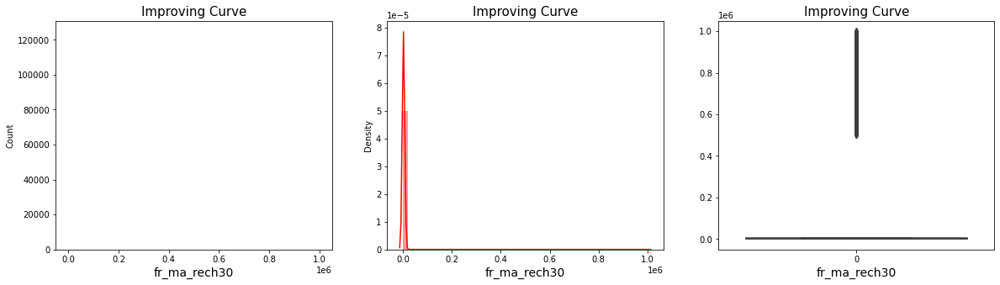

In [1495]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['fr_ma_rech30']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('fr_ma_rech30', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['fr_ma_rech30'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('fr_ma_rech30', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['fr_ma_rech30']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('fr_ma_rech30', fontsize= 14)
plt.show()

In [1496]:
df.drop(columns='fr_ma_rech30',inplace = True) #drop the column

correlation between the Features and with label:-----> (30, 30)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

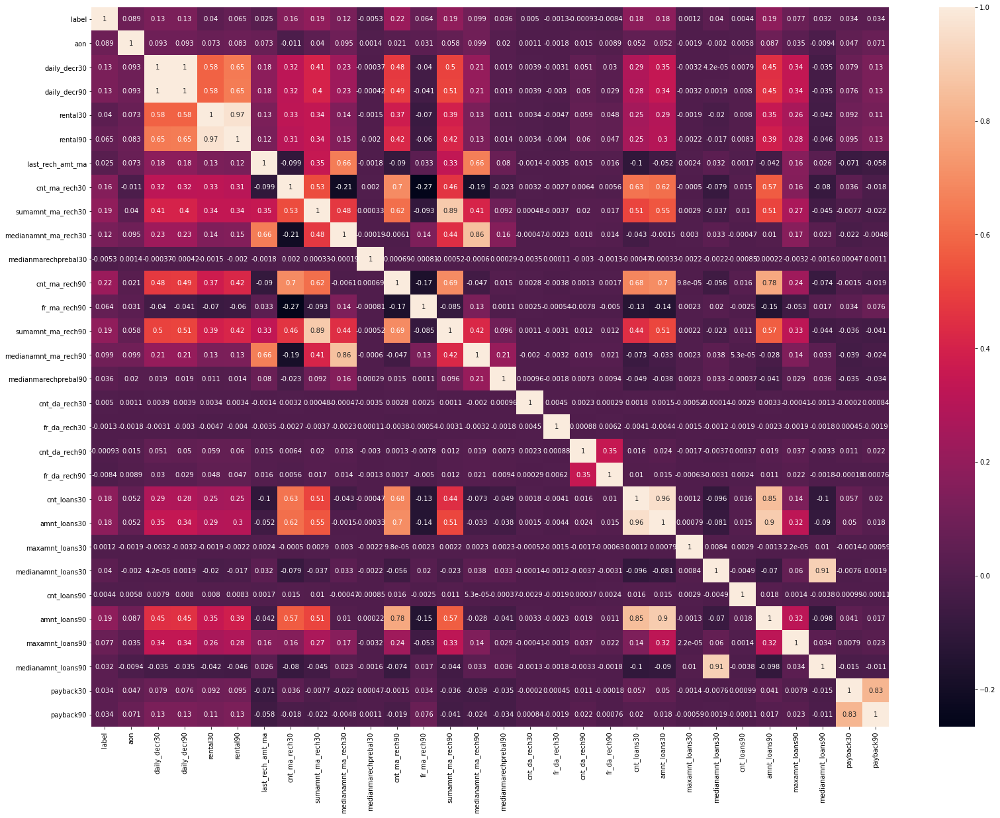

In [1497]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

Observations:
1. This column is highly skewed, so, we need to drop this column

In [1498]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (193253, 32)


# Column12: sumamnt_ma_rech30 - Total amount of recharge in main account over last 30 days (in Indonesian Rupiah)

In [1499]:
df['sumamnt_ma_rech30'].unique() #check the unique values

array([ 3078.,  5787.,  1539., ..., 37270., 23967., 12154.])

In [1500]:
df['sumamnt_ma_rech30'].value_counts() #check the counts of unique values

0.0        21981
1539.0      8514
770.0       5420
2309.0      4321
3078.0      3968
           ...  
17357.0        1
92831.0        1
10434.0        1
28702.0        1
31801.0        1
Name: sumamnt_ma_rech30, Length: 14580, dtype: int64

In [1501]:
df['sumamnt_ma_rech30'].value_counts(bins=15) #check the counts of unique values

(-275.01099999999997, 18334.0]    174762
(18334.0, 36668.0]                 14913
(36668.0, 55002.0]                  2438
(55002.0, 73336.0]                   718
(73336.0, 91670.0]                   242
(91670.0, 110004.0]                  106
(110004.0, 128338.0]                  39
(128338.0, 146672.0]                  15
(146672.0, 165006.0]                  12
(165006.0, 183340.0]                   3
(183340.0, 201674.0]                   2
(201674.0, 220008.0]                   1
(238342.0, 256676.0]                   1
(256676.0, 275010.0]                   1
(220008.0, 238342.0]                   0
Name: sumamnt_ma_rech30, dtype: int64

In [1502]:
df.groupby('label')['sumamnt_ma_rech30'].value_counts()
#check the relationship between column and label

label  sumamnt_ma_rech30
0      0.0                  7932
       1539.0               1710
       770.0                1488
       773.0                 990
       2309.0                655
                            ... 
1      185965.0                1
       187118.0                1
       202624.0                1
       247227.0                1
       275010.0                1
Name: sumamnt_ma_rech30, Length: 15800, dtype: int64

In [1503]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['sumamnt_ma_rech30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['sumamnt_ma_rech30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['sumamnt_ma_rech30'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 3.88113314484618


In [1504]:
df['sumamnt_ma_rech30'] = df['sumamnt_ma_rech30'].replace(0.0,df['sumamnt_ma_rech30'].mean())
#replace the zero value by column mean

In [1505]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['sumamnt_ma_rech30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['sumamnt_ma_rech30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['sumamnt_ma_rech30'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 4.198191272000269


In [1506]:
df['sumamnt_ma_rech30'].value_counts(bins=15) #check the counts of unique values

(-101.83800000000001, 18495.467]    175147
(18495.467, 36817.933]               14564
(36817.933, 55140.4]                  2410
(55140.4, 73462.867]                   716
(73462.867, 91785.333]                 236
(91785.333, 110107.8]                  106
(110107.8, 128430.267]                  39
(128430.267, 146752.733]                15
(146752.733, 165075.2]                  12
(165075.2, 183397.667]                   3
(183397.667, 201720.133]                 2
(201720.133, 220042.6]                   1
(238365.067, 256687.533]                 1
(256687.533, 275010.0]                   1
(220042.6, 238365.067]                   0
Name: sumamnt_ma_rech30, dtype: int64

In [1507]:
df=df[df['sumamnt_ma_rech30']<55140.4].reset_index(drop=True) #removing the outliers

In [1508]:
df.groupby('label')['sumamnt_ma_rech30'].value_counts()
#check the relationship between column and label

label  sumamnt_ma_rech30
0      7844.457219          7932
       1539.000000          1710
       770.000000           1488
       773.000000            990
       2309.000000           655
                            ... 
1      55073.000000            1
       55092.000000            1
       55098.000000            1
       55127.000000            1
       55137.000000            1
Name: sumamnt_ma_rech30, Length: 14818, dtype: int64

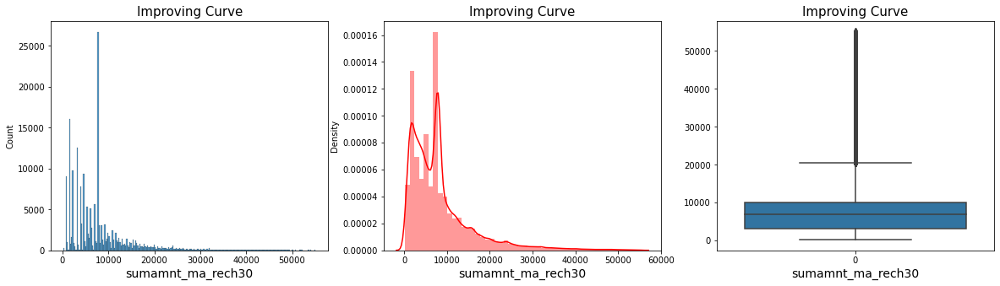

In [1509]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['sumamnt_ma_rech30']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('sumamnt_ma_rech30', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['sumamnt_ma_rech30'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('sumamnt_ma_rech30', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['sumamnt_ma_rech30']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('sumamnt_ma_rech30', fontsize= 14)
plt.show()

In [1510]:
df['sumamnt_ma_rech30'] = np.log(df['sumamnt_ma_rech30'])
#scale the data

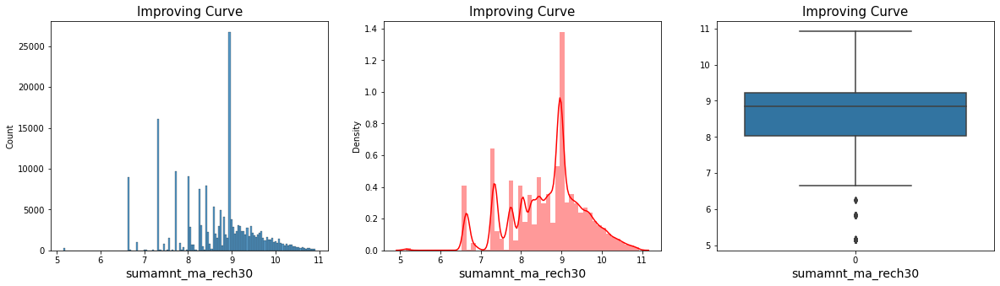

In [1511]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['sumamnt_ma_rech30']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('sumamnt_ma_rech30', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['sumamnt_ma_rech30'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('sumamnt_ma_rech30', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['sumamnt_ma_rech30']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('sumamnt_ma_rech30', fontsize= 14)
plt.show()

In [1512]:
df=df[df['sumamnt_ma_rech30']>6.5].reset_index(drop=True) #removing the outliers

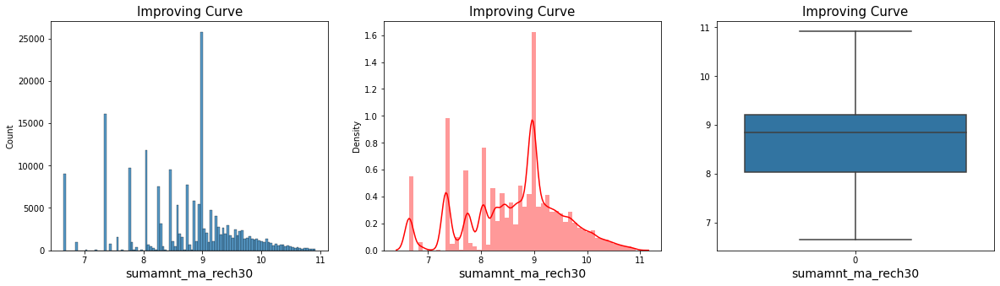

In [1513]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['sumamnt_ma_rech30']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('sumamnt_ma_rech30', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['sumamnt_ma_rech30'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('sumamnt_ma_rech30', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['sumamnt_ma_rech30']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('sumamnt_ma_rech30', fontsize= 14)
plt.show()

In [1514]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['sumamnt_ma_rech30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['sumamnt_ma_rech30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['sumamnt_ma_rech30'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> -0.30925529309806105


correlation between the Features and with label:-----> (30, 30)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

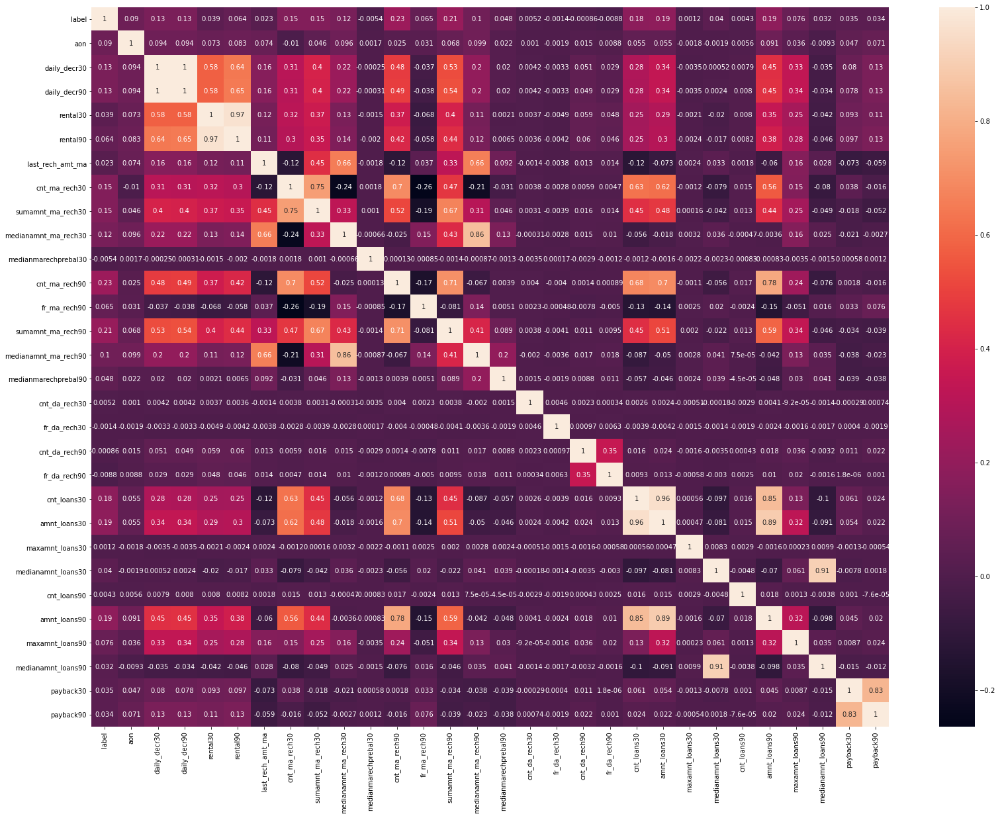

In [1515]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

Observations:
- Data Cleaning
1. Zero values are found and replaced by column mean value
2. No null values are found
3. Skewness is improved from 3.88 to -0.30
- Results by EDA
1. People who do less amount of recharge their success rate is very less
2. we see by histogram, this columns have some multicollinearity with other columns.

In [1516]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (191828, 32)


# Column13: medianamnt_ma_rech30 - Median of amount of recharges done in main account over last 30 days at user level (in Indonesian Rupiah)

In [1517]:
df['medianamnt_ma_rech30'].unique() #check the unique values

array([ 1539. ,  5787. ,     0. ,  2309. ,  3178. ,   773. ,  1156. ,
        4532.5,  4773.5,   770. ,  4769.5,   771.5,  1543. ,  1160. ,
        1547. ,  1154.5,  4048. ,  8000. ,  1924. ,  3178.5,  2020. ,
        2793.5,  3613. ,  1243. ,  5352. ,  2593. ,  4917. ,  7526. ,
        1928. ,  2410.5,  2320. ,  1158.5,   856. , 10000. ,   947. ,
        1720. ,  2551. ,  3322.5,   473. ,  5804. ,  8830.5,  1541. ,
        1247. ,  1731.5,  5154.5, 11900.5,  1353. ,  2743.5,  3663. ,
        1633.5,  2409. ,  4067. ,   860. ,  1539.5,  4149.5, 11874. ,
        1347. ,  1158. ,  6670. ,  7763. ,  3622.5,  3855.5,  2370. ,
        5814. ,  6024. ,  3467. ,  1928.5,  6706.5,  1974. ,  4385. ,
        4482.5,  6589. ,  1821. ,  2358.5,  1176.5,  7091.5,  2314.5,
        7400. ,  5733.5,  4917.5,  6893.5, 15400. ,  5589. ,  1933. ,
         858.5,  4148. ,  3228. ,  2986. ,  2014.5,  3278.5,  9937. ,
        4536.5,  2070. , 16000. ,  4490. ,  2803. ,  3193. ,  2116.5,
       17391. ,  756

In [1518]:
df['medianamnt_ma_rech30'].value_counts() #check the counts of unique values

1539.0    46361
770.0     29569
0.0       21981
773.0     20875
2309.0    10699
          ...  
8469.5        1
4173.5        1
862.0         1
2690.5        1
4628.5        1
Name: medianamnt_ma_rech30, Length: 473, dtype: int64

In [1519]:
df['medianamnt_ma_rech30'].value_counts(bins=15) #check the counts of unique values

(-55.001, 3666.667]       171003
(3666.667, 7333.333]       12183
(7333.333, 11000.0]         7979
(11000.0, 14666.667]         586
(14666.667, 18333.333]        61
(51333.333, 55000.0]           7
(29333.333, 33000.0]           5
(18333.333, 22000.0]           4
(22000.0, 25666.667]           0
(25666.667, 29333.333]         0
(33000.0, 36666.667]           0
(36666.667, 40333.333]         0
(40333.333, 44000.0]           0
(44000.0, 47666.667]           0
(47666.667, 51333.333]         0
Name: medianamnt_ma_rech30, dtype: int64

In [1520]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['medianamnt_ma_rech30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['medianamnt_ma_rech30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['medianamnt_ma_rech30'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 3.3702702802127766


In [1521]:
df['medianamnt_ma_rech30'] = df['medianamnt_ma_rech30'].replace(0.0,df['medianamnt_ma_rech30'].mean())

In [1522]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['medianamnt_ma_rech30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['medianamnt_ma_rech30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['medianamnt_ma_rech30'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 3.784481654289461


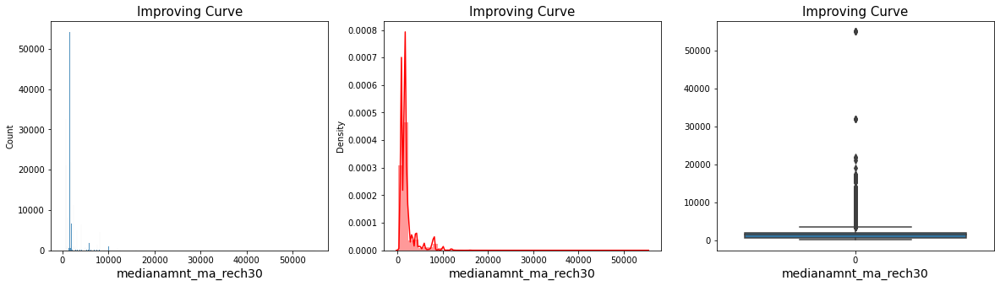

In [1523]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['medianamnt_ma_rech30']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('medianamnt_ma_rech30', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['medianamnt_ma_rech30'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('medianamnt_ma_rech30', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['medianamnt_ma_rech30']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('medianamnt_ma_rech30', fontsize= 14)
plt.show()

In [1524]:
df['medianamnt_ma_rech30'] = np.log(df['medianamnt_ma_rech30']) #scale the data

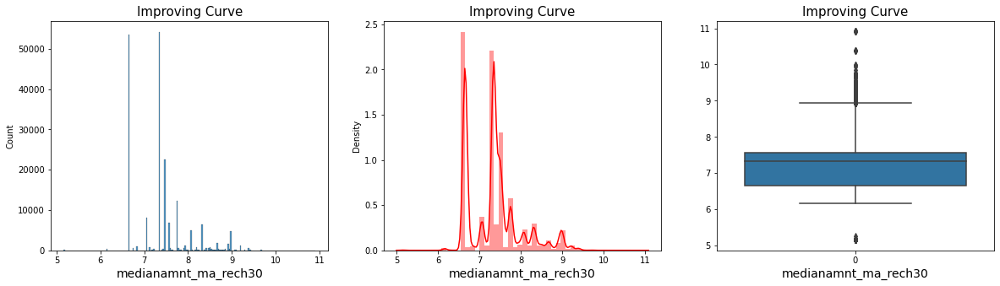

In [1525]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['medianamnt_ma_rech30']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('medianamnt_ma_rech30', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['medianamnt_ma_rech30'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('medianamnt_ma_rech30', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['medianamnt_ma_rech30']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('medianamnt_ma_rech30', fontsize= 14)
plt.show()

correlation between the Features and with label:-----> (30, 30)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

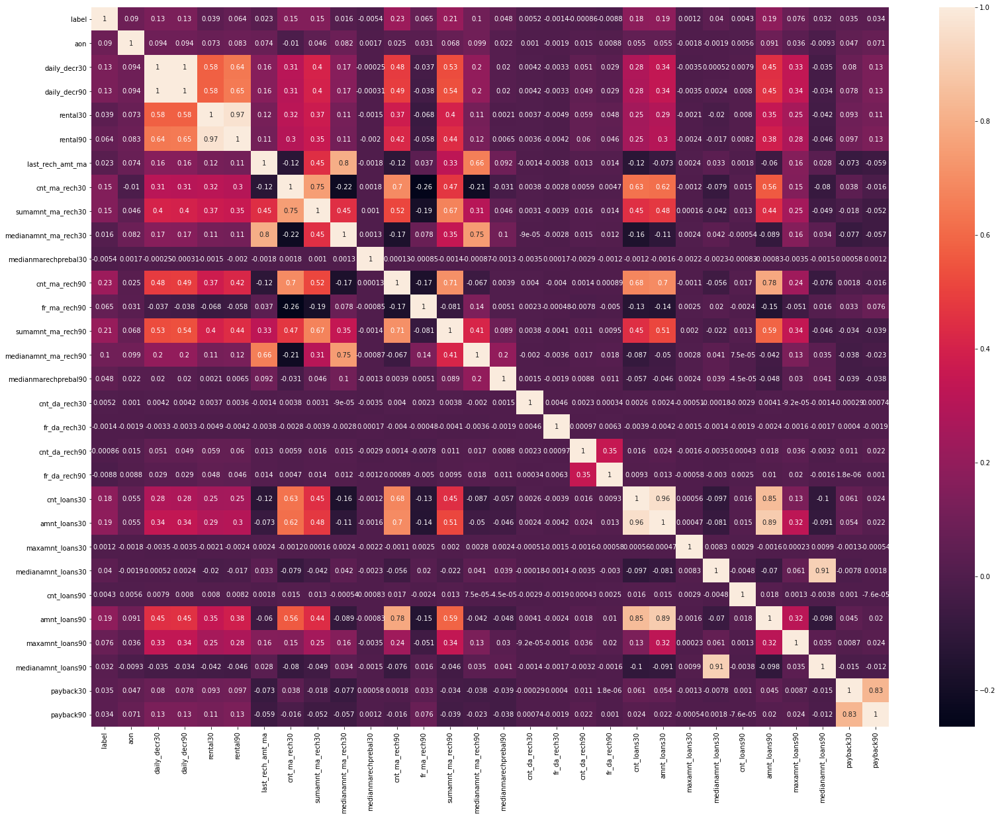

In [1526]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

In [1527]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (191828, 32)


# Column14: medianmarechprebal30 - Median of main account balance just before recharge in last 30 days at user level (in Indonesian Rupiah)

In [1528]:
df['medianmarechprebal30'].unique() #check the unique values

array([  7.5 ,  61.04,  66.32, ..., 490.07, 260.17,  71.37])

In [1529]:
df['medianmarechprebal30'].value_counts() #check the counts of unique values

0.00       24397
20.00       1029
19.00       1020
17.00        994
10.00        964
           ...  
2737.00        1
20.10          1
53.94          1
6.18           1
46.30          1
Name: medianmarechprebal30, Length: 28728, dtype: int64

In [1530]:
df['medianmarechprebal30'].value_counts(bins=15) #check the counts of unique values

(-1199.68, 66445.295]       190886
(866188.83, 932834.125]        140
(666252.946, 732898.241]       132
(932834.125, 999479.419]       129
(799543.535, 866188.83]        124
(532962.357, 599607.652]       123
(732898.241, 799543.535]       120
(599607.652, 666252.946]       110
(466317.062, 532962.357]        64
(66445.295, 133090.589]          0
(133090.589, 199735.884]         0
(199735.884, 266381.178]         0
(266381.178, 333026.473]         0
(333026.473, 399671.768]         0
(399671.768, 466317.062]         0
Name: medianmarechprebal30, dtype: int64

In [1531]:
df.groupby('label')['medianmarechprebal30'].value_counts()
#check the relationship between column and label

label  medianmarechprebal30
0      0.000000                8375
       10.000000                196
       13.000000                138
       3.000000                 117
       12.000000                116
                               ... 
1      995816.957788              1
       996556.547354              1
       996826.781891              1
       997896.677582              1
       999479.419319              1
Name: medianmarechprebal30, Length: 31876, dtype: int64

In [1532]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['medianmarechprebal30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['medianmarechprebal30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['medianmarechprebal30'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 14.905112333450065


In [1533]:
df['medianmarechprebal30'] = df['medianmarechprebal30'].replace(0.0,df['medianmarechprebal30'].mean())
#replace zero value by mean

In [1534]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['medianmarechprebal30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['medianmarechprebal30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['medianmarechprebal30'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 14.894207473404458


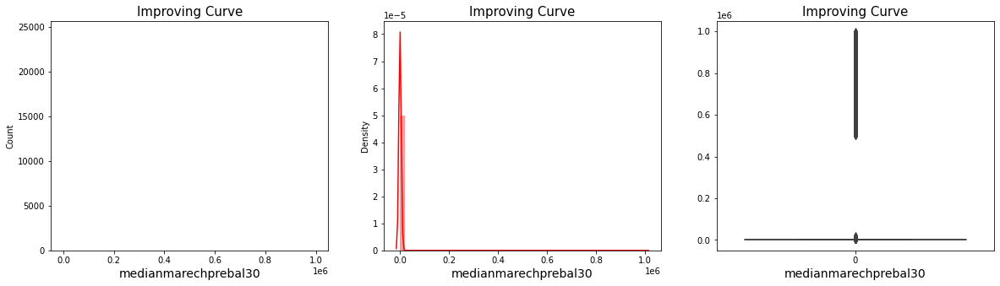

In [1535]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['medianmarechprebal30']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('medianmarechprebal30', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['medianmarechprebal30'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('medianmarechprebal30', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['medianmarechprebal30']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('medianmarechprebal30', fontsize= 14)
plt.show()

In [1536]:
df['medianmarechprebal30'] = np.log(df['medianmarechprebal30']) #scale the data

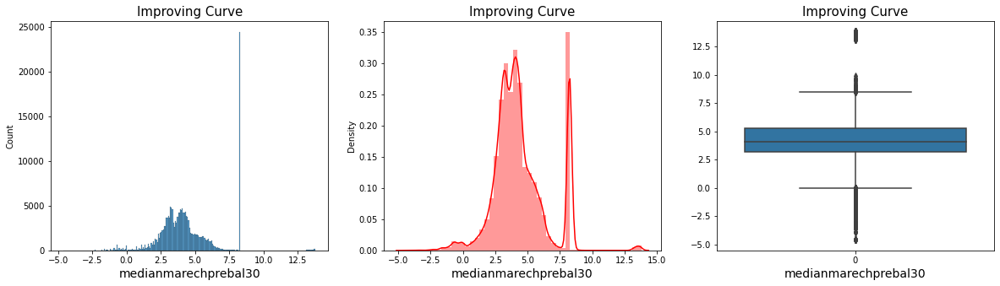

In [1537]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['medianmarechprebal30']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('medianmarechprebal30', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['medianmarechprebal30'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('medianmarechprebal30', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['medianmarechprebal30']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('medianmarechprebal30', fontsize= 14)
plt.show()

In [1538]:
df.drop(columns='medianmarechprebal30',inplace= True) #drop the column

correlation between the Features and with label:-----> (29, 29)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

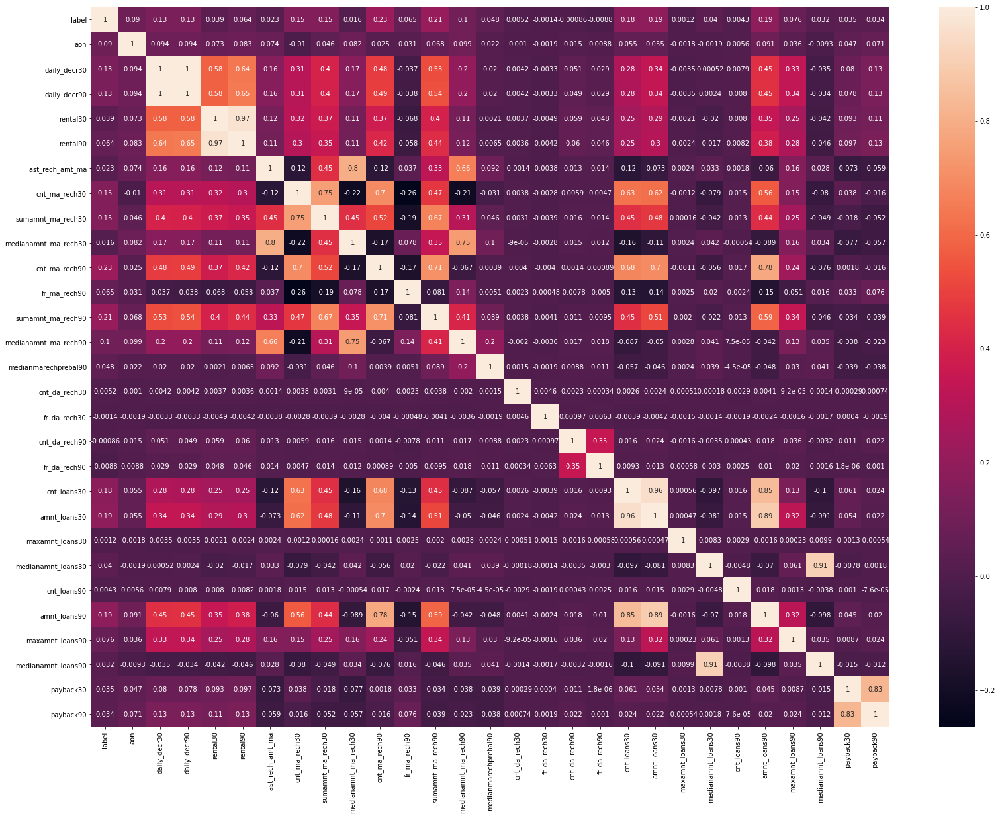

In [1539]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

Observation:
Highly skewed column, thats why we need to drop it.

In [1540]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (191828, 31)


# Column15: cnt_ma_rech90 - Number of times main account got recharged in last 90 days

In [1541]:
df['cnt_ma_rech90'].unique() #check the unique values

array([  2,   1,   8,   9,   4,   7,   0,   3,  19,  10,   6,  20,  11,
        16,  15,   5,  18,  14,  13,  12,  34,  30,  17,  25,  26,  23,
        33,  27,  22,  70,  40,  21,  39,  24,  35,  31,  29,  43,  45,
        48,  28,  63,  42,  36,  46,  38,  53,  57,  32,  51,  62,  49,
        58,  41,  37,  83,  82,  67,  50,  60,  90,  97,  54,  44,  56,
        73,  74,  47,  71,  78,  52,  69,  64,  61,  55,  92,  80,  77,
        65,  68,  79,  94,  59,  72,  75, 140, 105,  81, 121,  66,  84,
        88, 151,  85, 104, 100,  91,  86,  99], dtype=int64)

In [1542]:
df['cnt_ma_rech90'].value_counts() #check the counts of unique values

1      23666
2      21644
3      19046
4      16308
0      16140
       ...  
85         1
84         1
83         1
140        1
121        1
Name: cnt_ma_rech90, Length: 99, dtype: int64

In [1543]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['cnt_ma_rech90'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['cnt_ma_rech90'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['cnt_ma_rech90'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 2.670708293817732


In [1544]:
df['cnt_ma_rech90'] = df['cnt_ma_rech90'].replace(0.0,df['cnt_ma_rech90'].mean())
#replace the zero value by mean value

In [1545]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['cnt_ma_rech90'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['cnt_ma_rech90'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['cnt_ma_rech90'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 2.8545424603468414


correlation between the Features and with label:-----> (29, 29)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

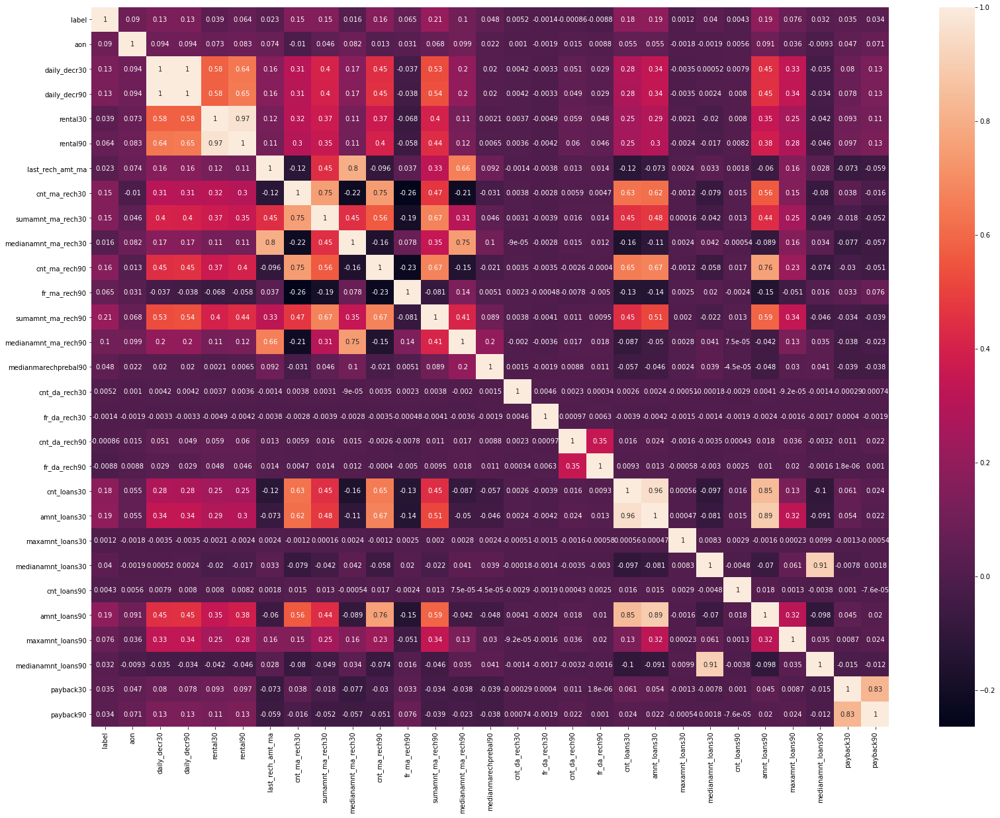

In [1546]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

In [1547]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (191828, 31)


# Column16: fr_ma_rech90 - Frequency of main account recharged in last 90 days

In [1548]:
df['fr_ma_rech90'].unique() #check the unique values

array([21,  0,  2,  3,  1,  5, 30, 10, 26,  8, 31, 64, 66, 12, 15,  7, 18,
        4, 57, 50, 67, 32, 11,  6, 44, 41, 45, 35, 40, 33, 37, 22, 23, 34,
        9, 36, 42, 25, 20, 13, 14, 17, 47, 46, 51, 16, 39, 48, 59, 24, 38,
       19, 55, 62, 52, 65, 29, 74, 28, 71, 56, 60, 43, 54, 49, 27, 70, 53,
       73, 78, 68, 58, 61, 72, 85, 75, 79, 80, 69, 63, 77, 86, 83, 76, 88,
       82, 84, 81, 87], dtype=int64)

In [1549]:
df['fr_ma_rech90'].value_counts() #check the counts of unique values

0     55725
1     22893
2     18320
3     12634
4      9597
      ...  
85        6
86        6
88        5
84        4
87        1
Name: fr_ma_rech90, Length: 89, dtype: int64

In [1550]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['fr_ma_rech90'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['fr_ma_rech90'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['fr_ma_rech90'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 2.279365983010013


In [1551]:
df['fr_ma_rech90'] = df['fr_ma_rech90'].replace(0.0,df['fr_ma_rech90'].mean())
#replace the zero value by mean

In [1552]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['fr_ma_rech90'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['fr_ma_rech90'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['fr_ma_rech90'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 2.3829843745110217


Text(0, 0.5, 'label')

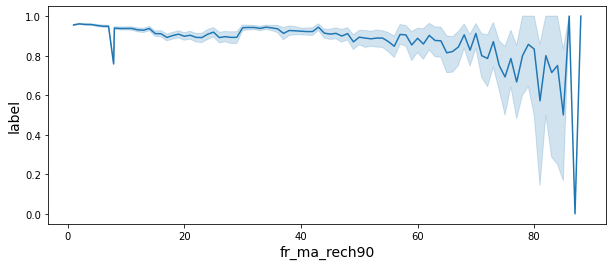

In [1553]:
#visualization
plt.figure(figsize=(10,4))
sns.lineplot(x= 'fr_ma_rech90', y = 'label', data=df)
plt.xlabel('fr_ma_rech90', fontsize = 14)
plt.ylabel('label', fontsize = 14)

In [1554]:
df['fr_ma_rech90'] = np.log(df['fr_ma_rech90']) #scale the data

correlation between the Features and with label:-----> (29, 29)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

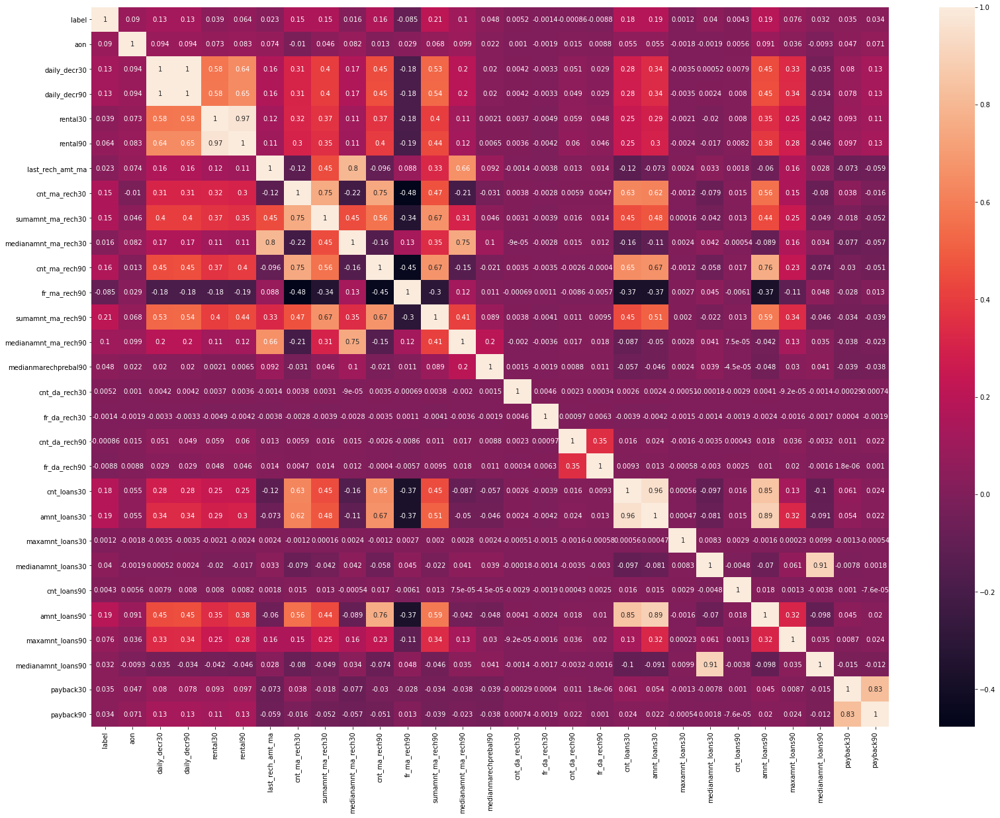

In [1555]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

Observations:
1. zero values are found
2. skewness is found
3. We can see by lineplot, maximum success rate at any frequency.
4. By histogram, we can see, this column have less multicolinearity than others

In [1556]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (191828, 31)


# Column17: sumamnt_ma_rech90 - Total amount of recharge in main account over last 90 days (in Indonasian Rupiah)

In [1557]:
df['sumamnt_ma_rech90'].unique() #check the unique values

array([ 3078,  5787,  1539, ..., 36422, 52487, 17941], dtype=int64)

In [1558]:
df['sumamnt_ma_rech90'].value_counts() #check the counts of unique values

0        16140
1539      5251
770       3473
773       3227
2309      2415
         ...  
70940        1
13496        1
23733        1
25778        1
64672        1
Name: sumamnt_ma_rech90, Length: 29991, dtype: int64

In [1559]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['sumamnt_ma_rech90'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['sumamnt_ma_rech90'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['sumamnt_ma_rech90'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 2.6155854936696143


In [1560]:
df['sumamnt_ma_rech90'] = df['sumamnt_ma_rech90'].replace(0.0, df['sumamnt_ma_rech90'].mean())
#replace the zero value by column mean

In [1561]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['sumamnt_ma_rech90'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['sumamnt_ma_rech90'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['sumamnt_ma_rech90'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 2.7323092012941266


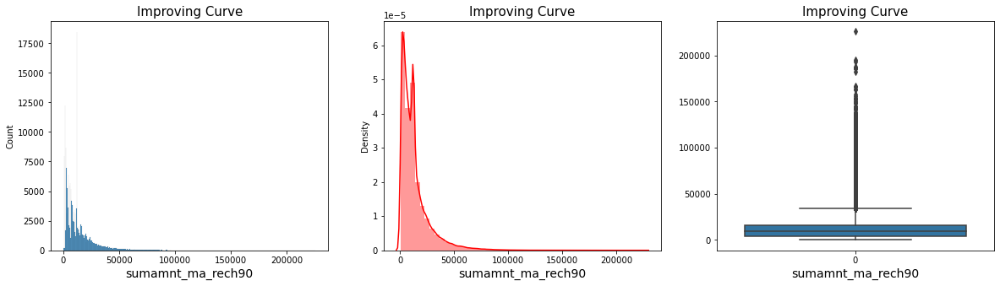

In [1562]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['sumamnt_ma_rech90']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('sumamnt_ma_rech90', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['sumamnt_ma_rech90'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('sumamnt_ma_rech90', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['sumamnt_ma_rech90']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('sumamnt_ma_rech90', fontsize= 14)
plt.show()

In [1563]:
df['sumamnt_ma_rech90'] = np.log(df['sumamnt_ma_rech90']) #scale the data

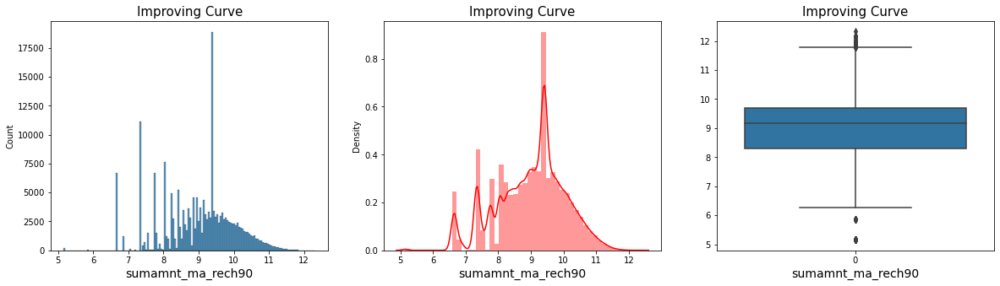

In [1564]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['sumamnt_ma_rech90']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('sumamnt_ma_rech90', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['sumamnt_ma_rech90'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('sumamnt_ma_rech90', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['sumamnt_ma_rech90']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('sumamnt_ma_rech90', fontsize= 14)
plt.show()

In [1565]:
df=df[df['sumamnt_ma_rech90']>6].reset_index(drop=True)

In [1566]:
df=df[df['sumamnt_ma_rech90']<11.5].reset_index(drop=True)

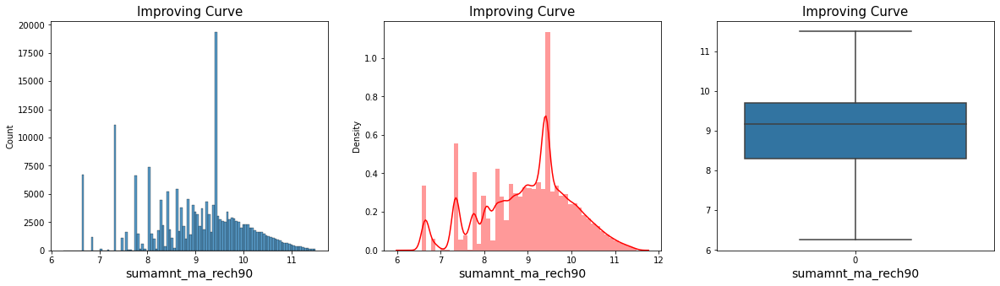

In [1567]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['sumamnt_ma_rech90']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('sumamnt_ma_rech90', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['sumamnt_ma_rech90'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('sumamnt_ma_rech90', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['sumamnt_ma_rech90']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('sumamnt_ma_rech90', fontsize= 14)
plt.show()

In [1568]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['sumamnt_ma_rech90'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['sumamnt_ma_rech90'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['sumamnt_ma_rech90'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> -0.3419654803290995


Text(0, 0.5, 'sumamnt_ma_rech90')

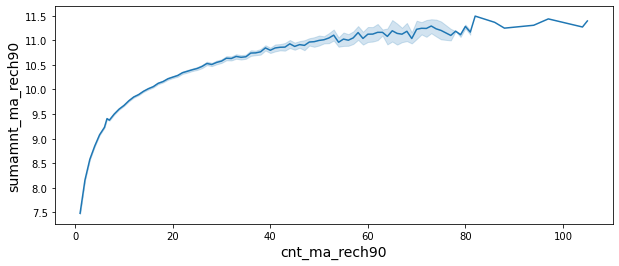

In [1569]:
#visualization
plt.figure(figsize=(10,4))
sns.lineplot(x= 'cnt_ma_rech90', y = 'sumamnt_ma_rech90', data=df)
plt.xlabel('cnt_ma_rech90', fontsize = 14)
plt.ylabel('sumamnt_ma_rech90', fontsize = 14)

correlation between the Features and with label:-----> (29, 29)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

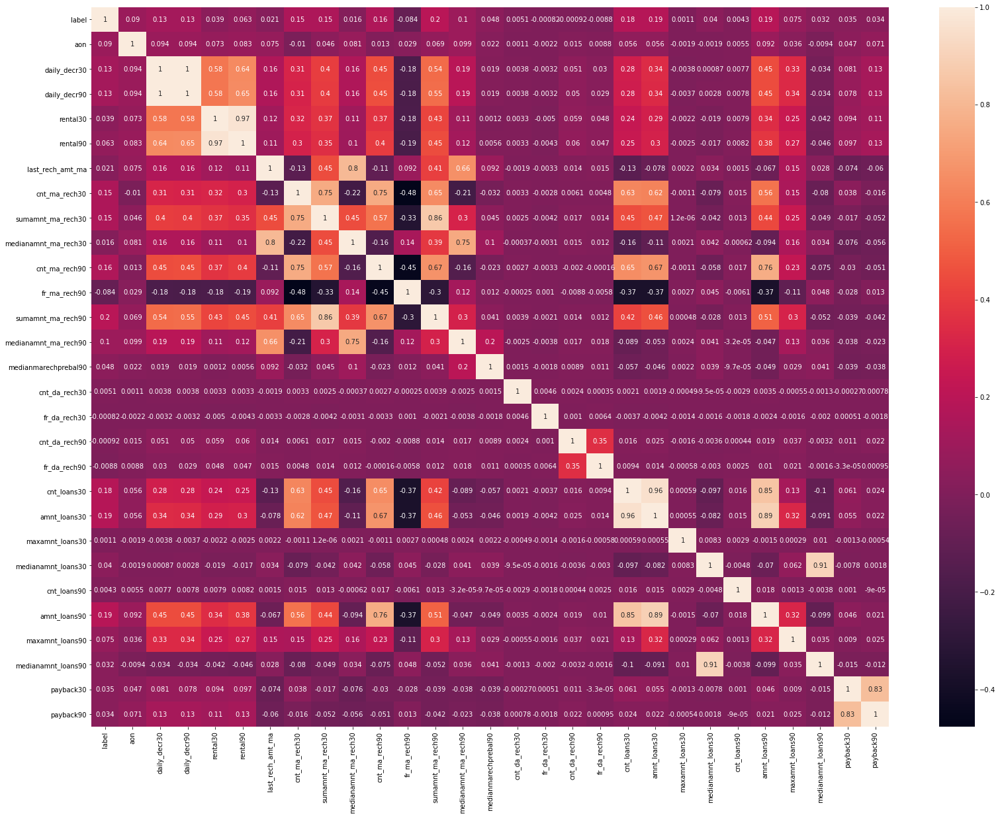

In [1570]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

Observations:
1. Zero values are found and replaced by column mean
2. skewness is improved
3. data is highly skewed 
4. Outliers are found and removed by scalling 
5. As the number of frequency of recharge increases, recharge amount is also increases.
6. there is less multicolinearity of this column with other columns

In [1571]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (191286, 31)


# Column18: medianamnt_ma_rech90 - Median of amount of recharges done in main account over last 90 days at user level (in Indonasian Rupiah)

In [1572]:
df['medianamnt_ma_rech90'].unique() #check the unique values

array([ 1539. ,  5787. ,   947. ,  2888. ,  3178. ,   773. ,  1156. ,
        4532.5,  1720. ,     0. ,  4769.5,   771.5,   770. ,  3178.5,
        1543. ,  1160. ,  2309. ,  4048. ,  1247. ,  1924. ,  2803. ,
        8000. ,  3278.5, 10250. ,  2020. ,  3193. ,  1243. ,  1547. ,
         173. ,  3613. ,  3855.5,  2358.5,  5359.5,  1928. ,  1541. ,
        2410.5,  2320. ,  9937. ,  1154.5,  4773.5,  6024. ,  1158.5,
         856. , 10000. ,  4067. ,  2593. ,   473. ,  5804. ,  3676.5,
        1333. ,  1731.5,  5154.5, 11874. ,  1353. ,  3569. ,  1929.5,
        1633.5,   858.5,  2409. ,  2314.5,  2551. ,  7763. ,  4149.5,
        4917. ,  9663.5,  1546.5,  1347. ,  2743.5,  6670. ,  3757.5,
        2793.5,  3622.5,  2749. ,   860. ,  2893. ,  1539.5,  2370. ,
        5814. ,  4473.5,  1736. ,  1821. ,  3467. ,   772.5,  7526. ,
        2797.5,  1928.5,  4496. ,  1683. ,  7400. ,  2451. ,  1974. ,
        4385. ,  4057.5,  3663. ,  1176.5,  7091.5,  4253.5,  1629.5,
        7607. ,  756

In [1573]:
df['medianamnt_ma_rech90'].value_counts() #check the counts of unique values

1539.0     44441
773.0      28416
770.0      22842
0.0        16140
2309.0     10202
           ...  
9503.0         1
16860.0        1
7974.0         1
3755.0         1
6250.0         1
Name: medianamnt_ma_rech90, Length: 569, dtype: int64

In [1574]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['medianamnt_ma_rech90'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['medianamnt_ma_rech90'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['medianamnt_ma_rech90'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 3.5020393784841417


In [1575]:
df['medianamnt_ma_rech90'] = df['medianamnt_ma_rech90'].replace(0.0,df['medianamnt_ma_rech90'].mean())
#replace zero value by column mean

In [1576]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['medianamnt_ma_rech90'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['medianamnt_ma_rech90'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['medianamnt_ma_rech90'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 3.8165186469956867


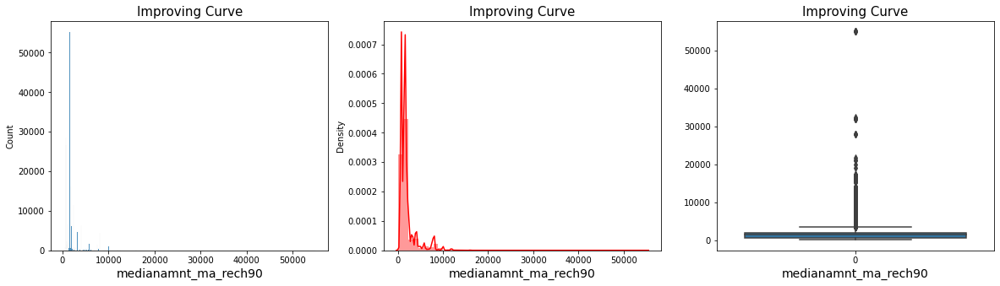

In [1577]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['medianamnt_ma_rech90']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('medianamnt_ma_rech90', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['medianamnt_ma_rech90'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('medianamnt_ma_rech90', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['medianamnt_ma_rech90']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('medianamnt_ma_rech90', fontsize= 14)
plt.show()

In [1578]:
df['medianamnt_ma_rech90'] = np.log(df['medianamnt_ma_rech90']) #scale the data

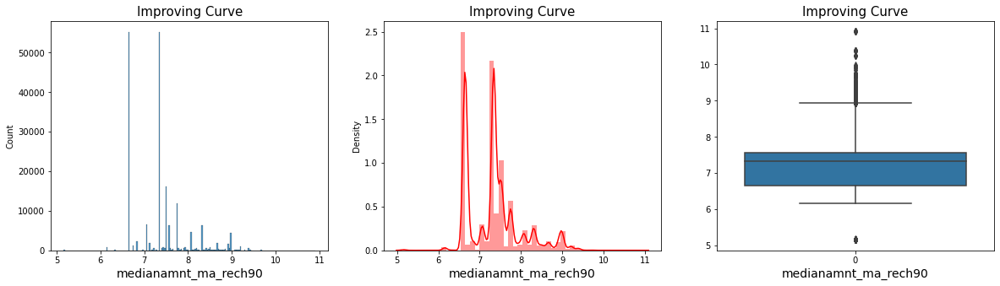

In [1579]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['medianamnt_ma_rech90']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('medianamnt_ma_rech90', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['medianamnt_ma_rech90'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('medianamnt_ma_rech90', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['medianamnt_ma_rech90']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('medianamnt_ma_rech90', fontsize= 14)
plt.show()

In [1580]:
df.drop(columns='medianamnt_ma_rech90',inplace = True) #drop the column

correlation between the Features and with label:-----> (28, 28)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

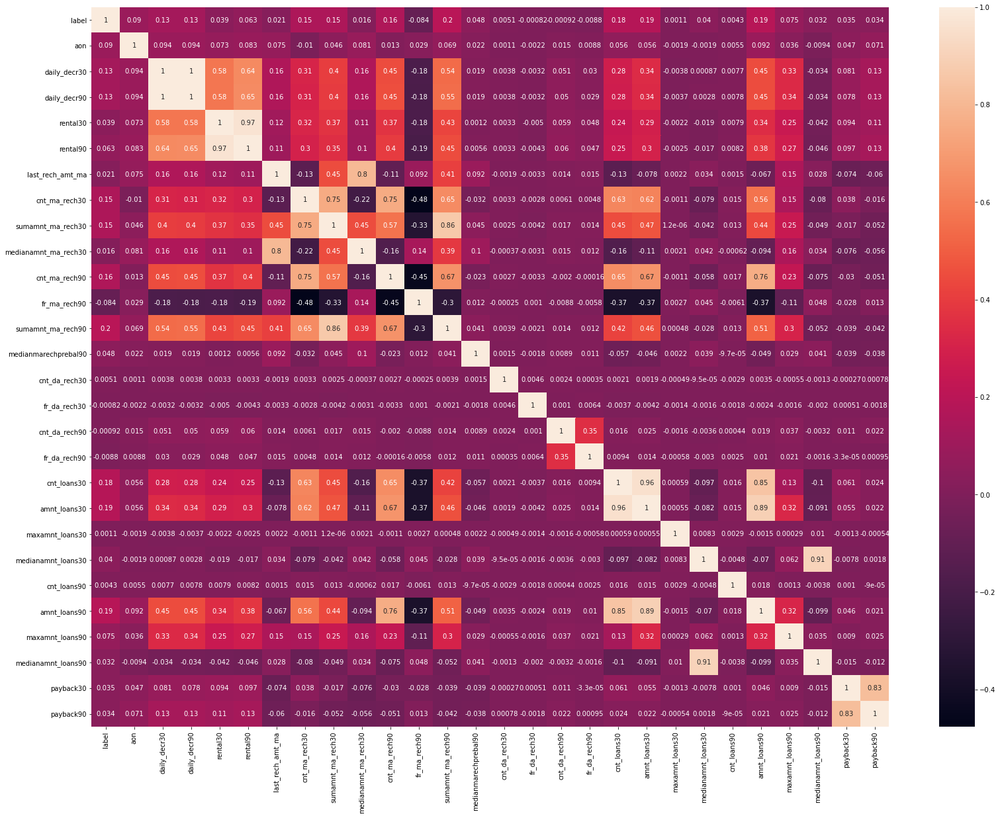

In [1581]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

Observation:
1.  column is highly skewed, and full of outliers, we dont want to loose more data, thats why we drop this column

In [1582]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (191286, 30)


# Column19: medianmarechprebal90 - Median of main account balance just before recharge in last 90 days at user level (in Indonasian Rupiah)

In [1583]:
df['medianmarechprebal90'].unique() #check the unique values

array([  7.5 ,  61.04,  66.32, ...,  27.66, 118.97, 392.2 ])

In [1584]:
df['medianmarechprebal90'].value_counts() #check the counts of unique values

0.00      18258
20.00      1190
19.00      1129
26.00      1096
27.00      1091
          ...  
3.28          1
69.73         1
5.83          1
20.95         1
738.50        1
Name: medianmarechprebal90, Length: 27966, dtype: int64

In [1585]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['medianmarechprebal90'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['medianmarechprebal90'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['medianmarechprebal90'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 32.79662466856393


In [1586]:
df['medianmarechprebal90'] = df['medianmarechprebal90'].replace(0.0,df['medianmarechprebal90'].mean())

In [1587]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['medianmarechprebal90'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['medianmarechprebal90'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['medianmarechprebal90'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 33.19866614060402


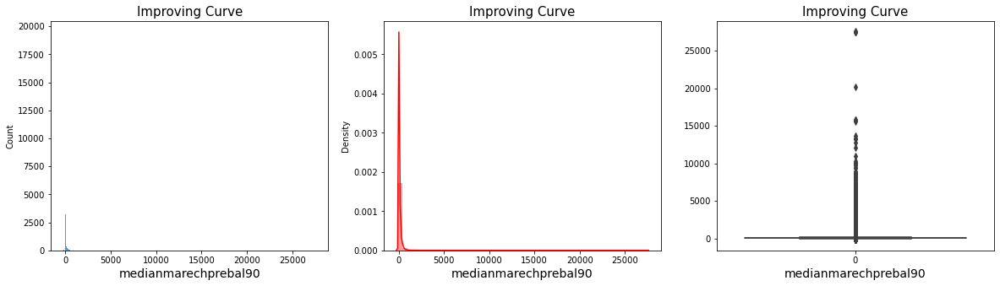

In [1588]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['medianmarechprebal90']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('medianmarechprebal90', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['medianmarechprebal90'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('medianmarechprebal90', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['medianmarechprebal90']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('medianmarechprebal90', fontsize= 14)
plt.show()

In [1589]:
df['medianmarechprebal90'] = np.log(df['medianmarechprebal90']) #scale the data

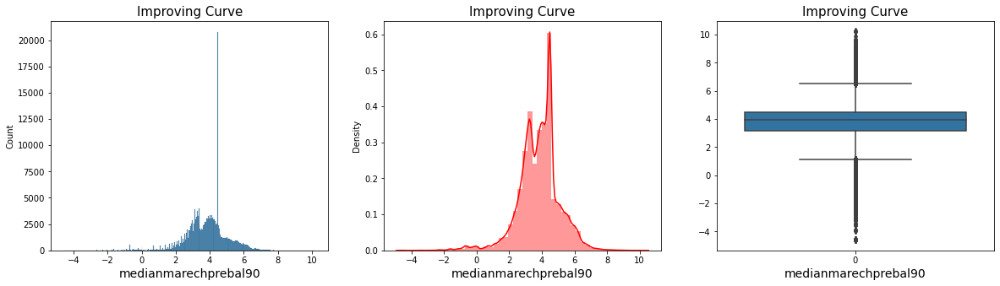

In [1590]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['medianmarechprebal90']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('medianmarechprebal90', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['medianmarechprebal90'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('medianmarechprebal90', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['medianmarechprebal90']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('medianmarechprebal90', fontsize= 14)
plt.show()

In [1591]:
df.drop(columns='medianmarechprebal90',inplace = True) #drop the column

correlation between the Features and with label:-----> (27, 27)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

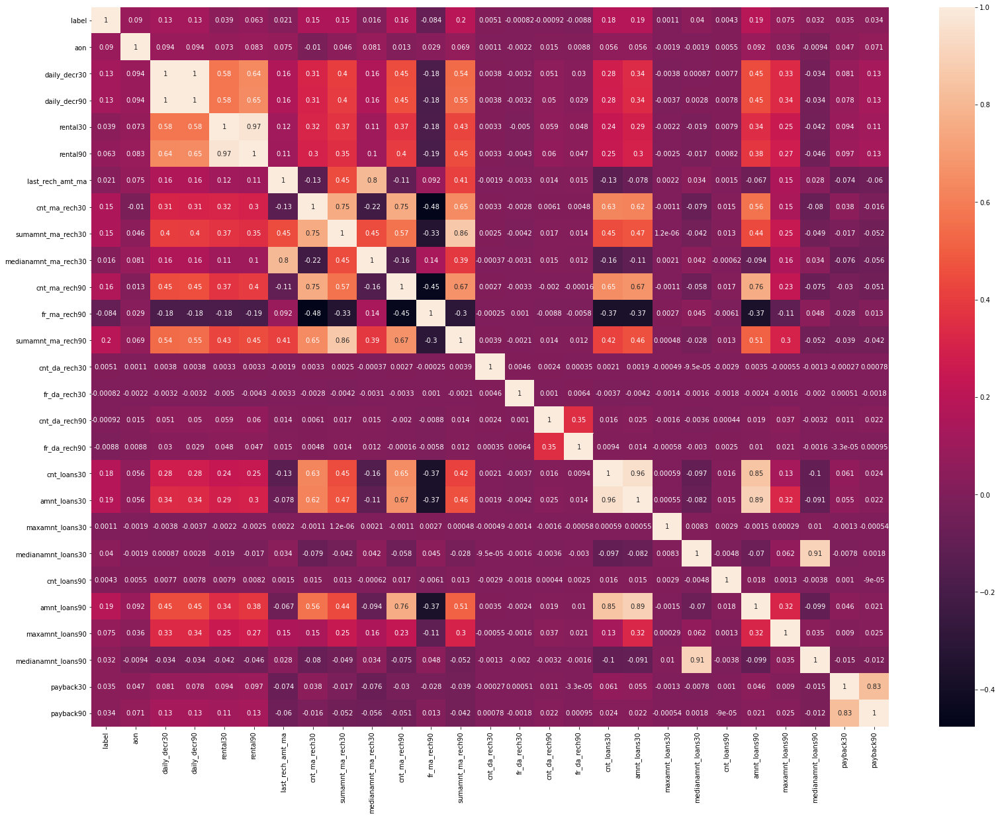

In [1592]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

Observations:
1. Column is highly skewed, thats why we drop this column

In [1593]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (191286, 29)


# Column20: cnt_da_rech30 - Number of times data account got recharged in last 30 days

In [1594]:
df['cnt_da_rech30'].unique() #check the unique values

array([0.00000000e+00, 3.07214638e+04, 9.17643917e+04, 1.00000000e+00,
       2.00000000e+00, 4.00000000e+00, 8.00000000e+00, 1.10391421e+04,
       9.88085231e+04, 4.87541408e+04, 1.92862817e+04, 5.19805303e+04,
       8.19107624e+04, 6.29716488e+04, 5.68746096e+04, 8.47492865e+04,
       3.00000000e+00, 5.32534132e+04, 1.00485400e+04, 4.88867924e+04,
       5.79778573e+04, 9.64583778e+04, 1.40000000e+01, 9.20706981e+04,
       1.06223154e+04, 1.99150109e+04, 1.19739217e+04, 8.27812436e+04,
       9.45801591e+03, 6.00000000e+00, 5.81692609e+04, 6.76295006e+04,
       9.38589512e+04, 1.89369174e+04, 8.47973873e+04, 4.59080535e+04,
       9.64303514e+04, 2.27558068e+04, 6.78650807e+04, 9.32692526e+04,
       4.90597863e+04, 5.73163378e+04, 3.46046107e+04, 8.04302658e+04,
       7.34715343e+04, 1.26534481e+04, 1.82614116e+04, 1.10000000e+01,
       7.00000000e+00, 3.42725280e+04, 6.99787173e+04, 8.95966941e+04,
       7.23728668e+03, 2.72468162e+04, 2.70472549e+04, 8.01132981e+04,
      

In [1595]:
df['cnt_da_rech30'].value_counts() #check the counts of unique values

0.000000        187442
1.000000          2192
2.000000           358
3.000000           146
4.000000            83
                 ...  
27148.122974         1
68163.493812         1
9908.475102          1
43135.709066         1
30176.182534         1
Name: cnt_da_rech30, Length: 969, dtype: int64

In [1596]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['cnt_da_rech30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['cnt_da_rech30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['cnt_da_rech30'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 17.871412478238174


In [1597]:
df['cnt_da_rech30'] = df['cnt_da_rech30'].replace(0.0, df['cnt_da_rech30'].mean())

In [1598]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['cnt_da_rech30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['cnt_da_rech30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['cnt_da_rech30'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 17.89238430717618


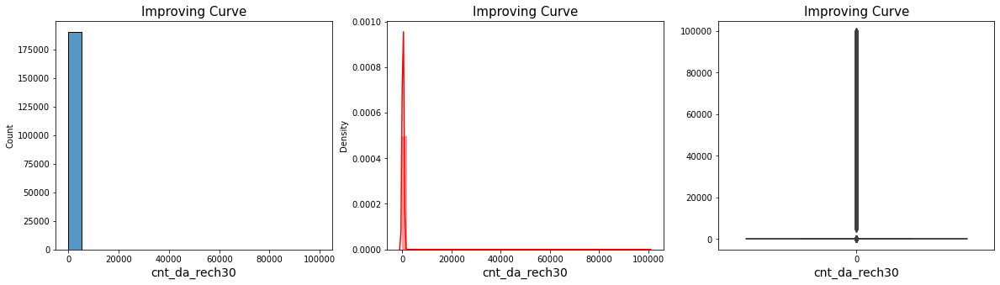

In [1599]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['cnt_da_rech30']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('cnt_da_rech30', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['cnt_da_rech30'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('cnt_da_rech30', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['cnt_da_rech30']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('cnt_da_rech30', fontsize= 14)
plt.show()

In [1600]:
df['cnt_da_rech30'] = np.log(df['cnt_da_rech30']) #scale the data

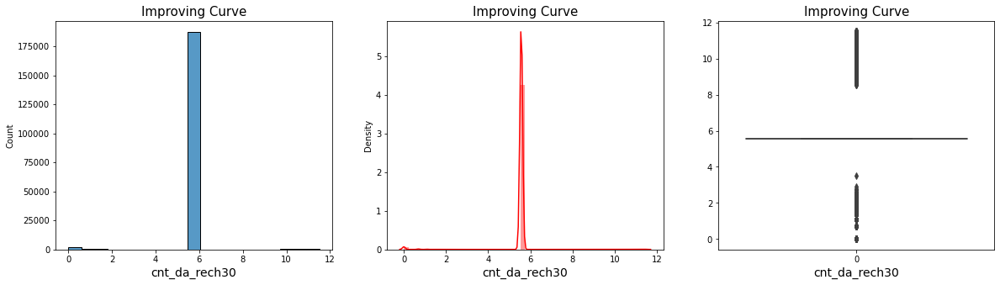

In [1601]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['cnt_da_rech30']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('cnt_da_rech30', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['cnt_da_rech30'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('cnt_da_rech30', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['cnt_da_rech30']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('cnt_da_rech30', fontsize= 14)
plt.show()

In [1602]:
df.drop(columns='cnt_da_rech30',inplace = True) #drop the column

correlation between the Features and with label:-----> (26, 26)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

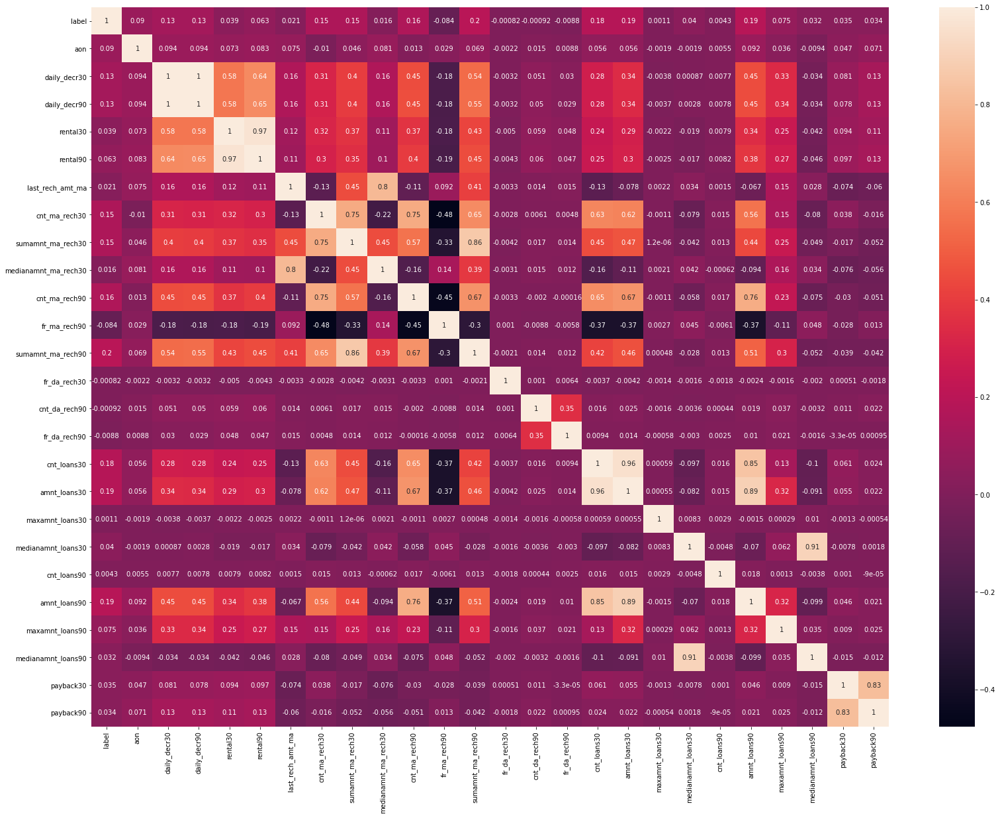

In [1603]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

Observations:
1. columns contains almost 95% similar value that is zero. so, we need to drop this column

In [1604]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (191286, 28)


# Column21: fr_da_rech30 - Frequency of data account recharged in last 30 days

In [1605]:
df['fr_da_rech30'].unique() #check the unique values

array([0.00000000e+00, 7.23845092e+05, 9.00000000e+00, 7.70942026e+05,
       8.00000000e+00, 1.00000000e+01, 7.00000000e+00, 7.63374603e+05,
       8.80214795e+05, 9.89535130e+05, 7.51789480e+05, 9.14904326e+05,
       5.07515883e+05, 8.95487920e+05, 5.73927400e+05, 9.43535429e+05,
       6.79678157e+05, 5.18279370e+05, 6.00000000e+00, 9.43968193e+05,
       8.71252343e+05, 5.51961066e+05, 7.17431242e+05, 4.00000000e+00,
       6.21548111e+05, 8.93085317e+05, 9.24556638e+05, 8.85863192e+05,
       7.64371623e+05, 5.89976717e+05, 8.74610302e+05, 7.56142966e+05,
       8.97998365e+05, 9.76227638e+05, 9.27306351e+05, 5.00000000e+00,
       5.33002607e+05, 8.76149158e+05, 9.91674106e+05, 9.81892639e+05,
       7.66891935e+05, 8.14203808e+05, 7.65961363e+05, 1.00000000e+00,
       7.99518931e+05, 5.66922874e+05, 3.00000000e+00, 8.93133664e+05,
       7.20116266e+05, 6.37662986e+05, 6.14829614e+05, 5.90449126e+05,
       5.59442536e+05, 9.99202934e+05, 1.30000000e+01, 7.86060624e+05,
      

In [1606]:
df['fr_da_rech30'].value_counts() #check the counts of unique values

0.000000         189824
3.000000             60
1.000000             53
2.000000             49
7.000000             46
                  ...  
925894.245971         1
891165.122623         1
518777.867779         1
911051.991163         1
978390.348610         1
Name: fr_da_rech30, Length: 980, dtype: int64

In [1607]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['fr_da_rech30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['fr_da_rech30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['fr_da_rech30'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 14.775844537403424


In [1608]:
df['fr_da_rech30'] = df['fr_da_rech30'].replace(0.0,df['fr_da_rech30'].mean())

In [1609]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['fr_da_rech30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['fr_da_rech30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['fr_da_rech30'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 14.78239213512295


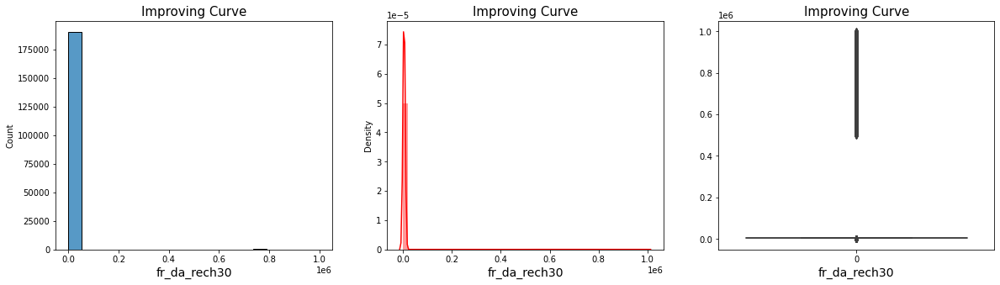

In [1610]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['fr_da_rech30']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('fr_da_rech30', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['fr_da_rech30'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('fr_da_rech30', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['fr_da_rech30']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('fr_da_rech30', fontsize= 14)
plt.show()

In [1611]:
df.drop(columns='fr_da_rech30',inplace = True) #drop the column

correlation between the Features and with label:-----> (25, 25)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

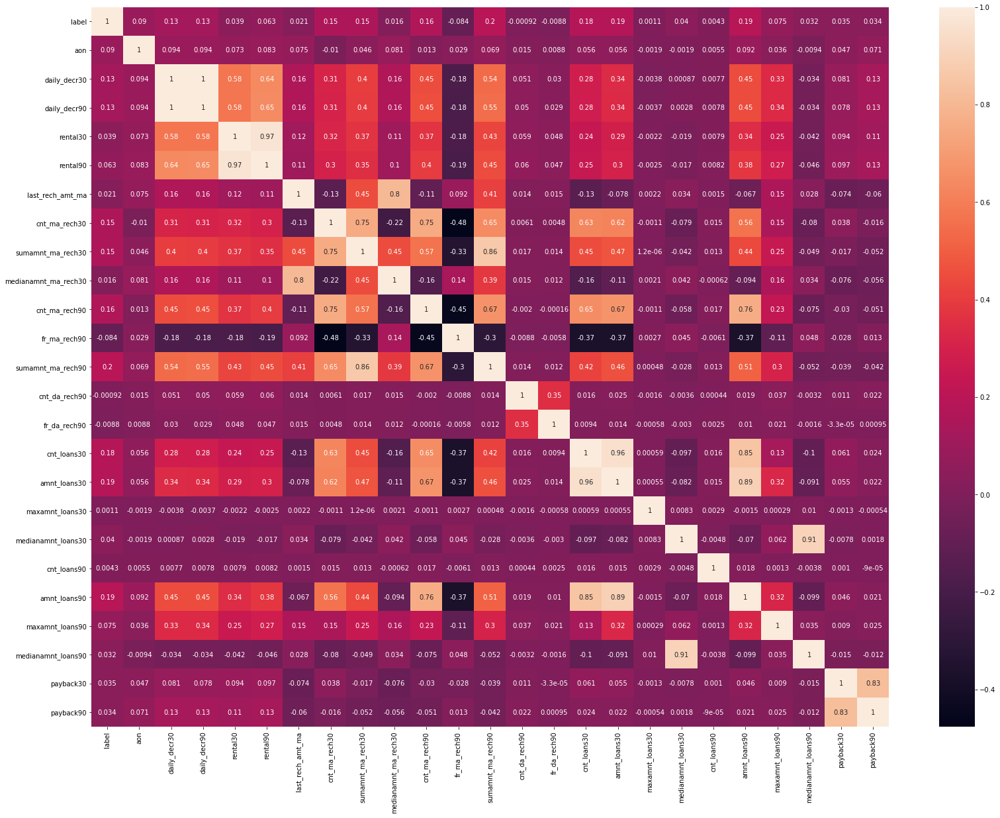

In [1612]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

Observations:
1. columns contains almost 95% similar value that is zero. so, we need to drop this column

In [1613]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (191286, 27)


# Column22: cnt_da_rech90 - Number of times data account got recharged in last 90 days

In [1614]:
df['cnt_da_rech90'].unique() #check the unique values

array([ 0,  1,  3,  2,  5,  6,  8,  4, 27,  7,  9, 14, 12, 22, 13, 10, 16,
       19, 11, 15, 38, 18, 20, 30, 28, 25, 17], dtype=int64)

In [1615]:
df['cnt_da_rech90'].value_counts() #check the counts of unique values

0     186186
1       3969
2        527
3        213
4        142
5         72
6         45
7         34
8         29
9         17
14         9
12         7
13         6
11         6
10         6
16         4
18         3
15         2
17         1
19         1
20         1
22         1
25         1
27         1
28         1
30         1
38         1
Name: cnt_da_rech90, dtype: int64

In [1616]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['cnt_da_rech90'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['cnt_da_rech90'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['cnt_da_rech90'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 27.042575732234514


In [1617]:
df['cnt_da_rech90'] = df['cnt_da_rech90'].replace(0.0, df['cnt_da_rech90'].mean())

In [1618]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['cnt_da_rech90'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['cnt_da_rech90'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['cnt_da_rech90'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 27.630026011993746


In [1619]:
df['cnt_da_rech90'] = np.log(df['cnt_da_rech90'])

Text(0, 0.5, 'last_rech_amt_ma')

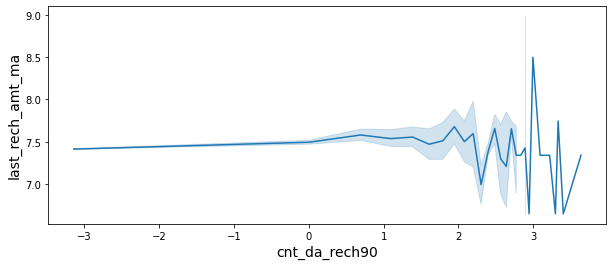

In [1620]:
#visualization
plt.figure(figsize=(10,4))
sns.lineplot(x= 'cnt_da_rech90', y = 'last_rech_amt_ma', data=df)
plt.xlabel('cnt_da_rech90', fontsize = 14)
plt.ylabel('last_rech_amt_ma', fontsize = 14)

correlation between the Features and with label:-----> (25, 25)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

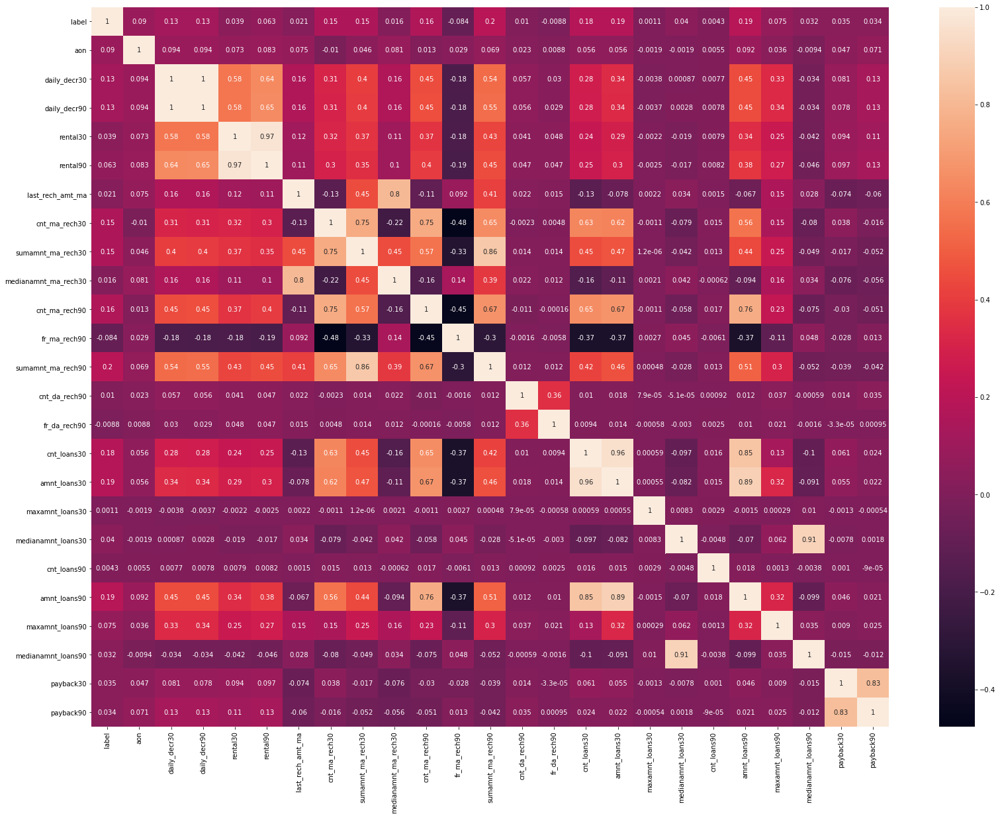

In [1621]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

Observations:
1. zero values are found
2. No null values are found
3. Column is highly skewed
4. 3 times data account is recharged for approximately low to medium recharge values

In [1622]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (191286, 27)


# Column23: fr_da_rech90 - Frequency of data account recharged in last 90 days

In [1623]:
df['fr_da_rech90'].unique() #check the unique values

array([ 0, 16,  8,  5, 11,  4,  6, 27, 29,  3,  9, 19, 24,  1, 35, 28, 30,
        7, 18, 13, 37,  2, 17, 14, 10, 12, 22, 15, 21, 42, 20, 23, 26, 25,
       34, 32, 39, 31, 33, 57, 43, 46, 41, 55, 64], dtype=int64)

In [1624]:
df['fr_da_rech90'].value_counts() #check the counts of unique values

0     190469
3         75
1         63
2         60
7         54
4         50
6         50
5         43
8         43
14        32
10        32
11        30
9         30
12        27
19        20
28        18
15        17
18        16
16        14
29        14
13        14
17        13
25        11
22        10
21        10
24         8
20         8
26         7
27         7
31         6
32         6
23         5
30         5
37         3
34         3
35         2
41         2
57         2
33         1
39         1
42         1
43         1
46         1
55         1
64         1
Name: fr_da_rech90, dtype: int64

In [1625]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['fr_da_rech90'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['fr_da_rech90'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['fr_da_rech90'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 28.062940005476236


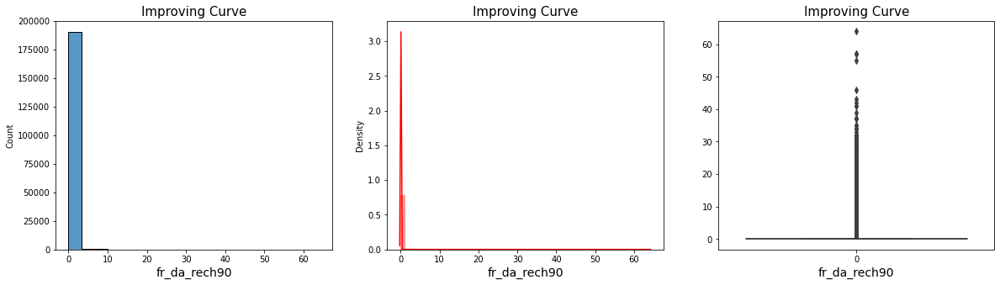

In [1626]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['fr_da_rech90']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('fr_da_rech90', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['fr_da_rech90'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('fr_da_rech90', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['fr_da_rech90']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('fr_da_rech90', fontsize= 14)
plt.show()

In [1627]:
df.drop(columns='fr_da_rech90',inplace=True)

correlation between the Features and with label:-----> (24, 24)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

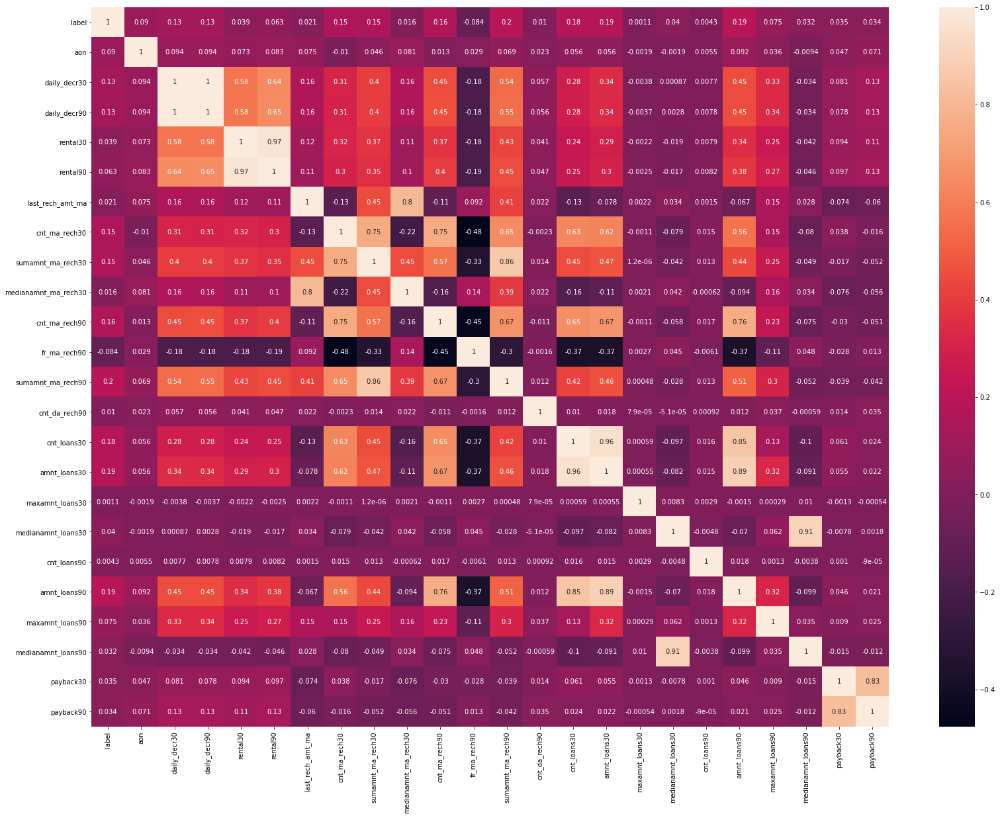

In [1628]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

Observations:
1. column is highly skewed, thats why we need to drop this column

In [1629]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (191286, 26)


# Column24: cnt_loans30 - Number of loans taken by user in last 30 days

In [1630]:
df['cnt_loans30'].unique() #check the unique values

array([ 2,  1,  7,  3,  4,  5,  8,  6, 10, 12,  0, 11,  9, 21, 15, 13, 18,
       25, 17, 20, 16, 14, 22, 29, 19, 33, 30, 36, 31, 27, 23, 26, 28, 24],
      dtype=int64)

In [1631]:
df['cnt_loans30'].value_counts() #check the counts of unique values

1     71505
2     40106
3     25833
4     16758
5     11196
6      7443
7      4816
8      3238
0      3163
9      2156
10     1479
11     1085
12      739
13      508
14      347
15      239
16      189
17      140
18       85
19       63
20       44
21       37
22       33
23       29
25       13
26       10
24        6
28        6
29        6
27        5
31        4
30        2
33        2
36        1
Name: cnt_loans30, dtype: int64

In [1632]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['cnt_loans30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['cnt_loans30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['cnt_loans30'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 2.4346199964129083


In [1633]:
df['cnt_loans30'] = df['cnt_loans30'].replace(0.0, df['cnt_loans30'].mean())

In [1634]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['cnt_loans30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['cnt_loans30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['cnt_loans30'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 2.4811636187898154


Text(0, 0.5, 'cnt_loans30')

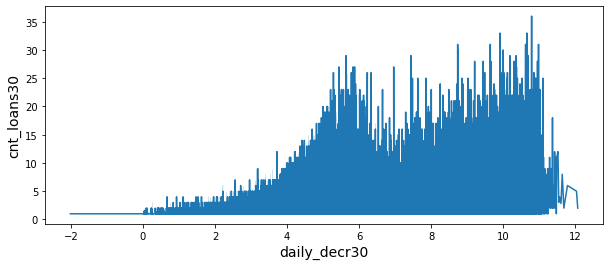

In [1635]:
#visualization
plt.figure(figsize=(10,4))
sns.lineplot(x= 'daily_decr30', y = 'cnt_loans30', data=df)
plt.xlabel('daily_decr30', fontsize = 14)
plt.ylabel('cnt_loans30', fontsize = 14)

Text(0, 0.5, 'cnt_loans30')

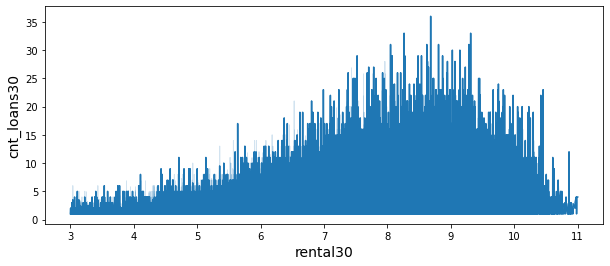

In [1636]:
#visualization
plt.figure(figsize=(10,4))
sns.lineplot(x= 'rental30', y = 'cnt_loans30', data=df)
plt.xlabel('rental30', fontsize = 14)
plt.ylabel('cnt_loans30', fontsize = 14)

Text(0, 0.5, 'cnt_loans30')

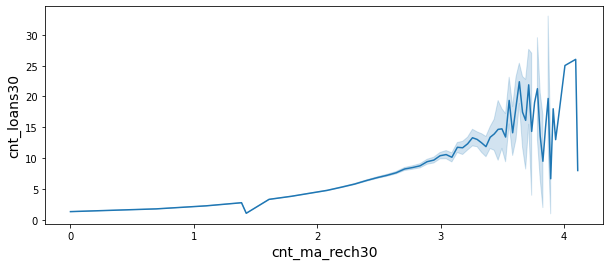

In [1637]:
#visualization
plt.figure(figsize=(10,4))
sns.lineplot(x= 'cnt_ma_rech30', y = 'cnt_loans30', data=df)
plt.xlabel('cnt_ma_rech30', fontsize = 14)
plt.ylabel('cnt_loans30', fontsize = 14)

correlation between the Features and with label:-----> (24, 24)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

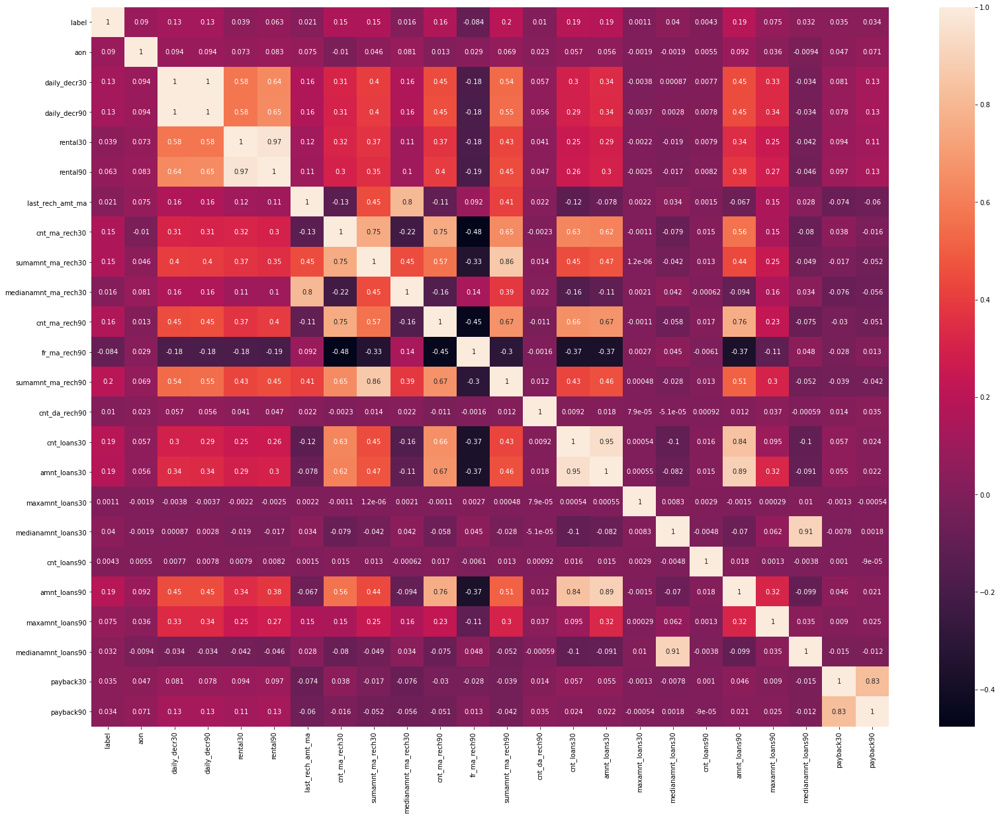

In [1638]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

Observations:
1. zero values are found
2. No null values are found
3. Column is highly skewed
4. as the daily amount spent increases, number of loans are also increases
5. Average amount balance increases increases when number of loans also increases
6. More peoples are recharged their account and takes 4 times loan
7. by observing histogram, this column is highly collinear with this column 'amnt_loans30'

In [1639]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (191286, 26)


# Column25: amnt_loans30 - Total amount of loans taken by user in last 30 days

In [1640]:
df['amnt_loans30'].unique() #check the unique values

array([ 12,   6,  42,  18,  24,  30,  48,  54,  36,  60,  72,   0,  66,
       114, 102, 126,  90,  78, 108,  84, 150,  96, 120, 180, 138, 156,
       162, 168, 132, 174, 144, 198, 222, 186, 270, 258, 216, 210, 276,
       192, 240, 252, 204], dtype=int64)

In [1641]:
df['amnt_loans30'].value_counts() #check the counts of unique values

6      64972
12     41753
18     25202
24     17640
30     11545
36      8188
42      5363
48      3813
0       3163
54      2542
60      1928
66      1326
72      1027
78       694
84       534
90       362
96       304
102      224
108      157
114      115
120      100
132       77
126       70
138       50
156       24
150       21
144       20
162       14
168       13
180       10
174       10
186        8
198        3
276        2
216        2
258        2
222        2
192        1
270        1
240        1
210        1
204        1
252        1
Name: amnt_loans30, dtype: int64

In [1642]:
df['amnt_loans30'].value_counts(bins=15) #check the counts of unique values

(-0.277, 18.4]    135090
(18.4, 36.8]       37373
(36.8, 55.2]       11718
(55.2, 73.6]        4281
(73.6, 92.0]        1590
(92.0, 110.4]        685
(110.4, 128.8]       285
(128.8, 147.2]       147
(147.2, 165.6]        59
(165.6, 184.0]        33
(184.0, 202.4]        12
(257.6, 276.0]         5
(202.4, 220.8]         4
(220.8, 239.2]         2
(239.2, 257.6]         2
Name: amnt_loans30, dtype: int64

In [1643]:
df.groupby('label')['amnt_loans30'].value_counts()
#check the relationship between column and label

label  amnt_loans30
0      6               15075
       12               3502
       18               1335
       24                586
       30                283
                       ...  
1      204                 1
       210                 1
       240                 1
       252                 1
       270                 1
Name: amnt_loans30, Length: 63, dtype: int64

In [1644]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['amnt_loans30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['amnt_loans30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['amnt_loans30'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 2.6300519856705282


In [1645]:
df['amnt_loans30'] = df['amnt_loans30'].replace(0.0, df['amnt_loans30'].mean())

In [1646]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['amnt_loans30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['amnt_loans30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['amnt_loans30'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 2.67629691385805


Text(0, 0.5, 'amnt_loans30')

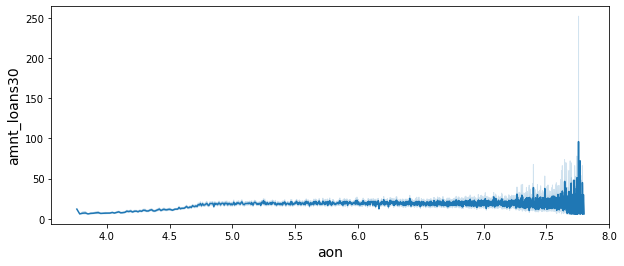

In [1647]:
#visualization
plt.figure(figsize=(10,4))
sns.lineplot(x= 'aon', y = 'amnt_loans30', data=df)
plt.xlabel('aon', fontsize = 14)
plt.ylabel('amnt_loans30', fontsize = 14)

Text(0, 0.5, 'amnt_loans30')

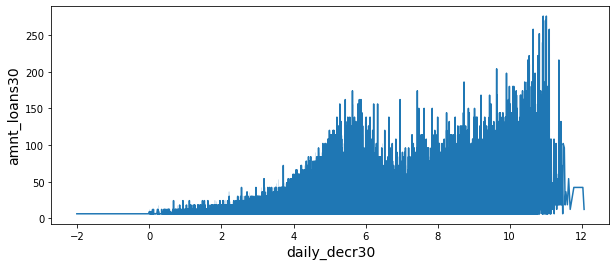

In [1648]:
#visualization
plt.figure(figsize=(10,4))
sns.lineplot(x= 'daily_decr30', y = 'amnt_loans30', data=df)
plt.xlabel('daily_decr30', fontsize = 14)
plt.ylabel('amnt_loans30', fontsize = 14)

Text(0, 0.5, 'amnt_loans30')

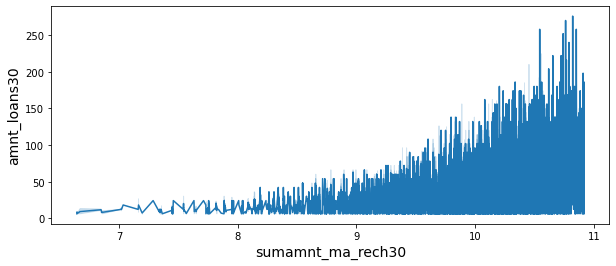

In [1649]:
#visualization
plt.figure(figsize=(10,4))
sns.lineplot(x= 'sumamnt_ma_rech30', y = 'amnt_loans30', data=df)
plt.xlabel('sumamnt_ma_rech30', fontsize = 14)
plt.ylabel('amnt_loans30', fontsize = 14)

Text(0, 0.5, 'label')

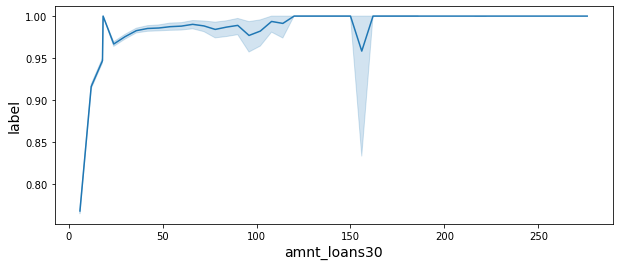

In [1650]:
#visualization
plt.figure(figsize=(10,4))
sns.lineplot(y= 'label', x = 'amnt_loans30', data=df)
plt.xlabel('amnt_loans30', fontsize = 14)
plt.ylabel('label', fontsize = 14)

correlation between the Features and with label:-----> (24, 24)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

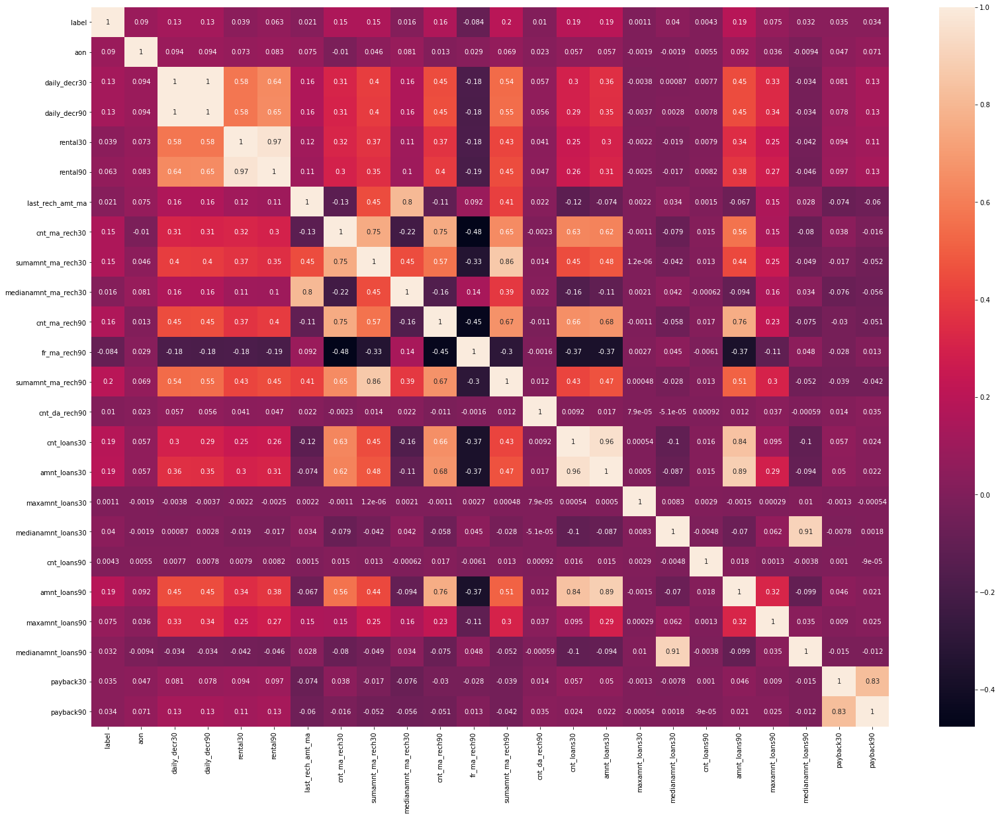

In [1651]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

Observations:
1. zero values are found
2. No null values are found
3. Column is highly skewed
4. As the age of cellular network increases, number of times loans taken by users are increases sligthly
5. success rate is high when when amount of taking loan is high
6. amount of loans is high because Amount of daily spent is high 
7. We can see clearly, amount of loan increases, when the total amount of recharge in main account increases.

In [1652]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (191286, 26)


# Column26: maxamnt_loans30 - maximum amount of loan taken by the user in last 30 days

In [1653]:
df['maxamnt_loans30'].unique() #check the unique values

array([6.00000000e+00, 1.20000000e+01, 0.00000000e+00, 6.19076974e+04,
       9.87459340e+04, 5.89253641e+04, 7.82324643e+04, 2.85748310e+04,
       7.15329354e+04, 8.32074956e+04, 3.40443620e+04, 4.32213892e+04,
       6.04173139e+03, 5.57238580e+04, 6.72114613e+03, 4.56835960e+04,
       5.63830805e+04, 8.19424671e+04, 8.64168788e+04, 4.50736302e+04,
       3.73414255e+04, 7.56894113e+04, 1.44533176e+04, 3.19063270e+04,
       3.04231047e+04, 9.84161892e+04, 9.28913547e+04, 1.17212372e+04,
       5.94725589e+04, 7.35390258e+04, 6.46459347e+04, 1.80917470e+04,
       8.12608299e+04, 2.34832696e+04, 1.92326012e+04, 4.06188760e+04,
       8.13810212e+04, 6.74644291e+04, 8.95592162e+04, 2.03380522e+04,
       1.32614795e+04, 5.55232465e+04, 1.14667799e+04, 1.91140474e+04,
       9.03040897e+04, 9.05772027e+04, 9.28569502e+04, 4.96696087e+04,
       5.40370977e+03, 2.83195900e+04, 5.71443242e+04, 7.53499190e+04,
       2.65211958e+04, 8.07985637e+04, 3.86945207e+04, 9.17204940e+04,
      

In [1654]:
df['maxamnt_loans30'].value_counts() #check the counts of unique values

6.000000        162373
12.000000        24813
0.000000          3149
61111.313784         1
94122.633158         1
                 ...  
34044.361979         1
69969.396759         1
41661.775719         1
46030.422072         1
96775.751803         1
Name: maxamnt_loans30, Length: 954, dtype: int64

In [1655]:
df['maxamnt_loans30'].value_counts(bins=15) #check the counts of unique values

(-99.866, 6657.637]       190352
(59918.737, 66576.374]        77
(66576.374, 73234.011]        73
(53261.099, 59918.737]        72
(79891.649, 86549.286]        72
(86549.286, 93206.923]        72
(93206.923, 99864.561]        69
(26630.55, 33288.187]         67
(13315.275, 19972.912]        66
(33288.187, 39945.824]        63
(39945.824, 46603.462]        63
(46603.462, 53261.099]        62
(6657.637, 13315.275]         60
(19972.912, 26630.55]         60
(73234.011, 79891.649]        58
Name: maxamnt_loans30, dtype: int64

In [1656]:
df.groupby('label')['maxamnt_loans30'].value_counts()
#check the relationship between column and label

label  maxamnt_loans30
0      6.000000           20107
       12.000000            966
       5954.923847            1
       8460.587413            1
       8804.930021            1
                          ...  
1      99222.975702           1
       99358.403181           1
       99600.070135           1
       99788.550177           1
       99864.560864           1
Name: maxamnt_loans30, Length: 956, dtype: int64

In [1657]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['maxamnt_loans30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['maxamnt_loans30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['maxamnt_loans30'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 17.67013767098254


In [1658]:
df['maxamnt_loans30'] = df['maxamnt_loans30'].replace(0.0, df['maxamnt_loans30'].mean())

In [1659]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['maxamnt_loans30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['maxamnt_loans30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['maxamnt_loans30'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 17.668802425719278


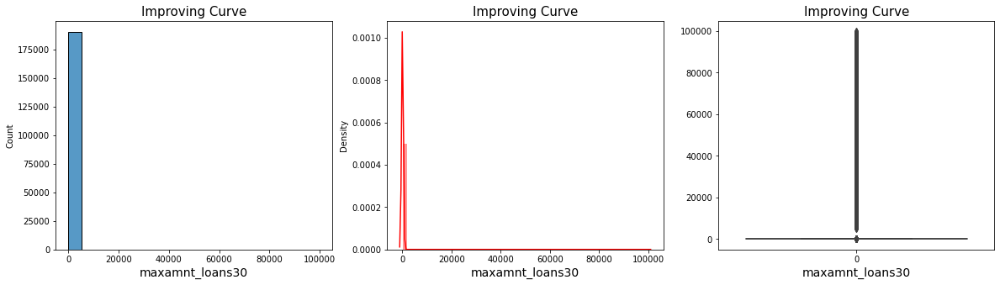

In [1660]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['maxamnt_loans30']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('maxamnt_loans30', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['maxamnt_loans30'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('maxamnt_loans30', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['maxamnt_loans30']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('maxamnt_loans30', fontsize= 14)
plt.show()

In [1661]:
df.drop(columns= 'maxamnt_loans30', inplace = True)

correlation between the Features and with label:-----> (23, 23)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

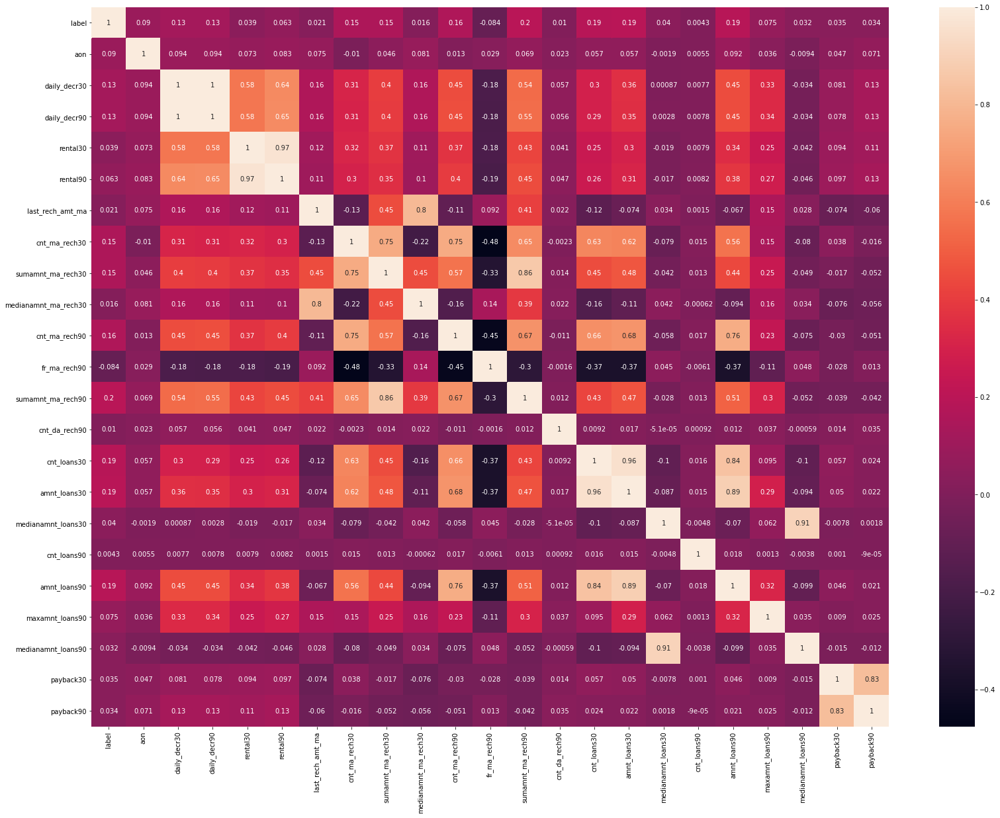

In [1662]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

Observations:
1. This column is highly skewed, thats why we need to drop this column

In [1663]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (191286, 25)


# Column27: medianamnt_loans30 - Median of amounts of loan taken by the user in last 30 days

In [1664]:
df['medianamnt_loans30'].unique() #check the unique values

array([0. , 0.5, 1. , 2. , 1.5, 3. ])

In [1665]:
df['medianamnt_loans30'].value_counts() #check the counts of unique values

0.0    178305
1.0      6396
0.5      6133
2.0       412
1.5        37
3.0         3
Name: medianamnt_loans30, dtype: int64

In [1666]:
df.groupby('label')['medianamnt_loans30'].value_counts()
#check the relationship between column and label

label  medianamnt_loans30
0      0.0                    20364
       1.0                      423
       0.5                      385
1      0.0                   157941
       1.0                     5973
       0.5                     5748
       2.0                      412
       1.5                       37
       3.0                        3
Name: medianamnt_loans30, dtype: int64

In [1667]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['medianamnt_loans30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['medianamnt_loans30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['medianamnt_loans30'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 4.590543519545387


In [1668]:
df['medianamnt_loans30'] = df['medianamnt_loans30'].replace(0.0,df['medianamnt_loans30'].mean())

In [1669]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['medianamnt_loans30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['medianamnt_loans30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['medianamnt_loans30'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 4.739895519867019


In [1670]:
df['medianamnt_loans30'].value_counts() #check the counts of unique values

0.054113    178305
1.000000      6396
0.500000      6133
2.000000       412
1.500000        37
3.000000         3
Name: medianamnt_loans30, dtype: int64

correlation between the Features and with label:-----> (23, 23)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

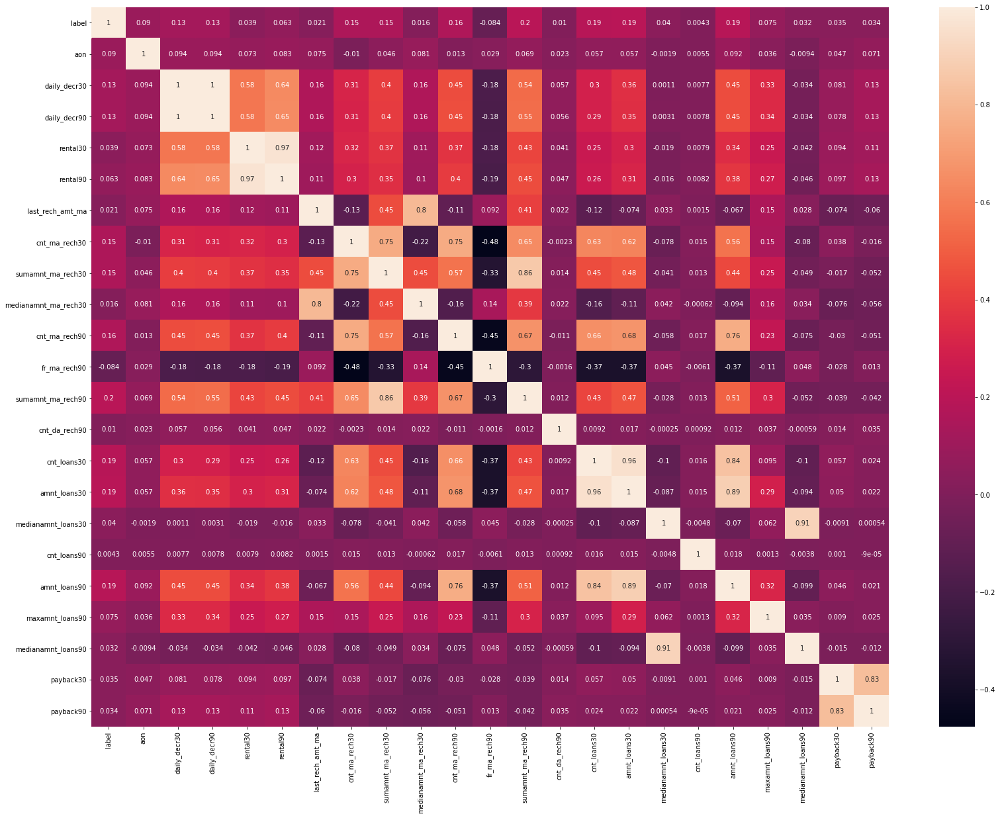

In [1671]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

Observations:
1. zero values are found
2. No null values are found
3. Column is highly skewed

In [1672]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (191286, 25)


# Column28: cnt_loans90 - Number of loans taken by user in last 90 days

In [1673]:
df['cnt_loans90'].unique() #check the unique values

array([2.00000000e+00, 1.00000000e+00, 7.00000000e+00, ...,
       3.02706822e+03, 4.47977118e+03, 2.04790245e+03])

In [1674]:
df['cnt_loans90'].value_counts() #check the counts of unique values

1.000000       62301
2.000000       34840
3.000000       22802
4.000000       16051
5.000000       11868
               ...  
3353.027570        1
2230.073293        1
1401.943058        1
4387.480688        1
4885.059153        1
Name: cnt_loans90, Length: 1007, dtype: int64

In [1675]:
df['cnt_loans90'].value_counts(bins=15) #check the counts of unique values

(-4.9990000000000006, 333.168]    190336
(1332.671, 1665.839]                  98
(2332.175, 2665.343]                  95
(2665.343, 2998.511]                  88
(3664.846, 3998.014]                  83
(4664.35, 4997.518]                   81
(999.504, 1332.671]                   80
(3998.014, 4331.182]                  77
(3331.679, 3664.846]                  73
(4331.182, 4664.35]                   73
(2998.511, 3331.679]                  71
(1999.007, 2332.175]                  66
(1665.839, 1999.007]                  65
(333.168, 666.336]                     0
(666.336, 999.504]                     0
Name: cnt_loans90, dtype: int64

In [1676]:
df.groupby('label')['cnt_loans90'].value_counts()
#check the relationship between column and label

label  cnt_loans90
0      1.000000       14491
       2.000000        3630
       3.000000        1402
       4.000000         651
       5.000000         360
                      ...  
1      4981.993623        1
       4983.979026        1
       4987.330418        1
       4992.821587        1
       4997.517944        1
Name: cnt_loans90, Length: 1031, dtype: int64

In [1677]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['cnt_loans90'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['cnt_loans90'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['cnt_loans90'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 16.636215828839767


In [1678]:
df['cnt_loans90'] = df['cnt_loans90'].replace(0.0, df['cnt_loans90'].mean())
#replace the zero value by mean value

In [1679]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['cnt_loans90'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['cnt_loans90'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['cnt_loans90'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 16.635444340771524


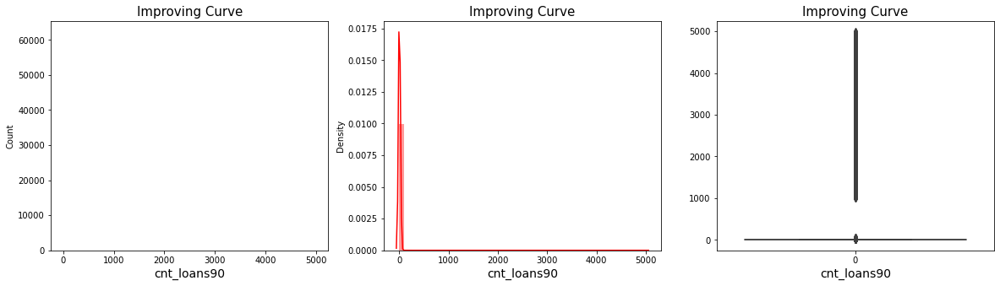

In [1680]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['cnt_loans90']) #visualize the outliers by using histplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('cnt_loans90', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['cnt_loans90'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('cnt_loans90', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['cnt_loans90']) #visualize the outliers by using boxplot
plt.title('Improving Curve', fontsize=15)
plt.xlabel('cnt_loans90', fontsize= 14)
plt.show()

In [1681]:
df['cnt_loans90'] = np.log(df['cnt_loans90']) #scale the data

correlation between the Features and with label:-----> (23, 23)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

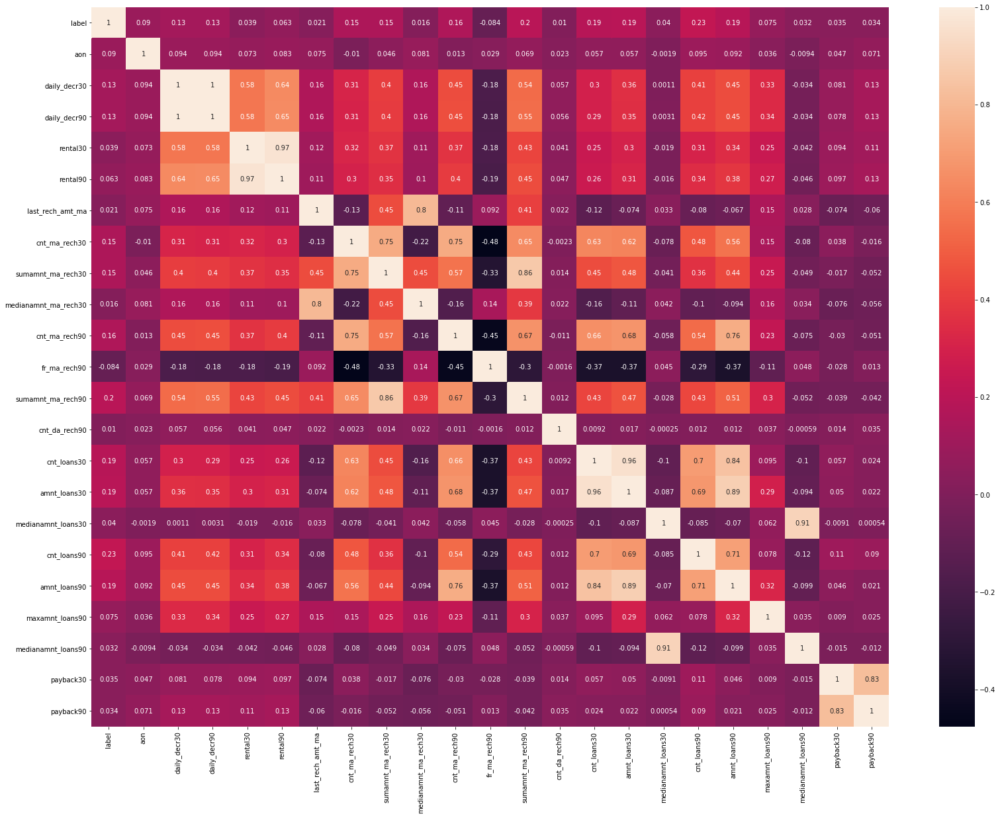

In [1682]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

Observations:
1. zero values are found
2. No null values are found
3. Column is highly skewed

In [1683]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (191286, 25)


# Column29: amnt_loans90 - Total amount of loans taken by user in last 90 days

In [1684]:
df['amnt_loans90'].unique() #check the unique values

array([ 12,   6,  42,  18,  24,  30,  48, 108,  36,  60,  78,  54,  72,
         0, 204, 162,  84, 132,  66,  90, 102, 300, 138, 168, 120,  96,
       144, 180, 198, 126, 114, 174, 156, 216, 192, 150, 234, 222, 186,
       240, 252, 288, 210, 312, 354, 258, 228, 276, 270, 396, 342, 264,
       426, 294, 438, 306, 246, 378, 360, 384, 282, 408, 318, 324, 348],
      dtype=int64)

In [1685]:
df['amnt_loans90'].value_counts() #check the counts of unique values

6      57728
12     36398
18     22673
24     16518
30     12032
       ...  
360        1
318        1
396        1
324        1
438        1
Name: amnt_loans90, Length: 65, dtype: int64

In [1686]:
df['amnt_loans90'].value_counts(bins=15) #check the counts of unique values

(-0.439, 29.2]    135289
(29.2, 58.4]       38138
(58.4, 87.6]       11261
(87.6, 116.8]       3968
(116.8, 146.0]      1578
(146.0, 175.2]       607
(175.2, 204.4]       252
(204.4, 233.6]        89
(233.6, 262.8]        54
(262.8, 292.0]        26
(292.0, 321.2]        10
(379.6, 408.8]         5
(350.4, 379.6]         4
(321.2, 350.4]         3
(408.8, 438.0]         2
Name: amnt_loans90, dtype: int64

In [1687]:
df.groupby('label')['amnt_loans90'].value_counts()
#check the relationship between column and label

label  amnt_loans90
0      6               14302
       12               3665
       18               1471
       24                709
       30                394
                       ...  
1      360                 1
       378                 1
       396                 1
       426                 1
       438                 1
Name: amnt_loans90, Length: 91, dtype: int64

In [1688]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['amnt_loans90'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['amnt_loans90'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['amnt_loans90'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 2.874195972459812


In [1689]:
df['amnt_loans90'] = df['amnt_loans90'].replace(0.0, df['amnt_loans90'].mean())

In [1690]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['amnt_loans90'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['amnt_loans90'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['amnt_loans90'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 2.8931715487132643


Text(0, 0.5, 'label')

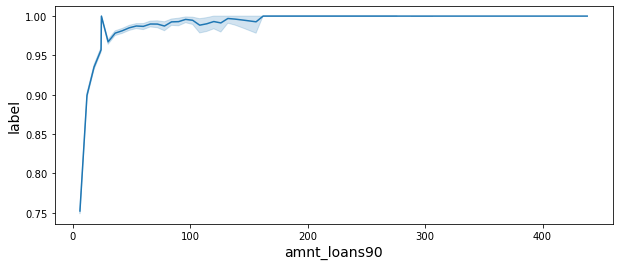

In [1691]:
#visualization
plt.figure(figsize=(10,4))
sns.lineplot(y= 'label', x = 'amnt_loans90', data=df)
plt.xlabel('amnt_loans90', fontsize = 14)
plt.ylabel('label', fontsize = 14)

Text(0, 0.5, 'daily_decr90')

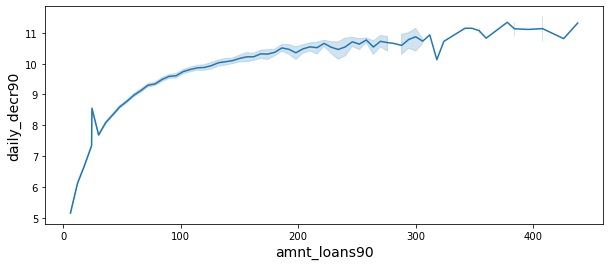

In [1692]:
#visualization
plt.figure(figsize=(10,4))
sns.lineplot(y= 'daily_decr90', x = 'amnt_loans90', data=df)
plt.xlabel('amnt_loans90', fontsize = 14)
plt.ylabel('daily_decr90', fontsize = 14)

Text(0, 0.5, 'rental90')

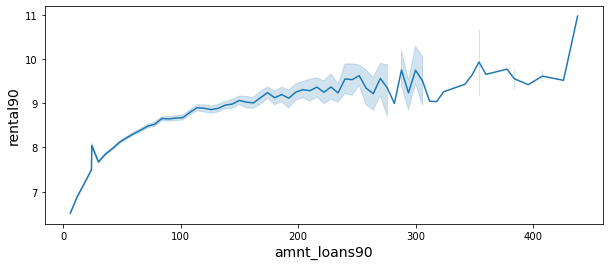

In [1693]:
#visualization
plt.figure(figsize=(10,4))
sns.lineplot(y= 'rental90', x = 'amnt_loans90', data=df)
plt.xlabel('amnt_loans90', fontsize = 14)
plt.ylabel('rental90', fontsize = 14)

Text(0, 0.5, 'cnt_ma_rech90')

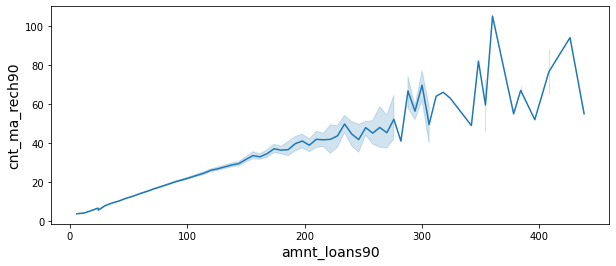

In [1694]:
#visualization
plt.figure(figsize=(10,4))
sns.lineplot(y= 'cnt_ma_rech90', x = 'amnt_loans90', data=df)
plt.xlabel('amnt_loans90', fontsize = 14)
plt.ylabel('cnt_ma_rech90', fontsize = 14)

Text(0, 0.5, 'cnt_da_rech90')

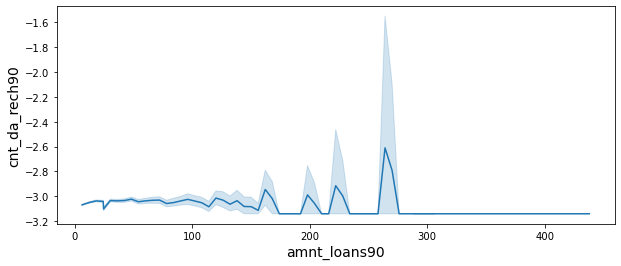

In [1695]:
#visualization
plt.figure(figsize=(10,4))
sns.lineplot(y= 'cnt_da_rech90', x = 'amnt_loans90', data=df)
plt.xlabel('amnt_loans90', fontsize = 14)
plt.ylabel('cnt_da_rech90', fontsize = 14)

correlation between the Features and with label:-----> (23, 23)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

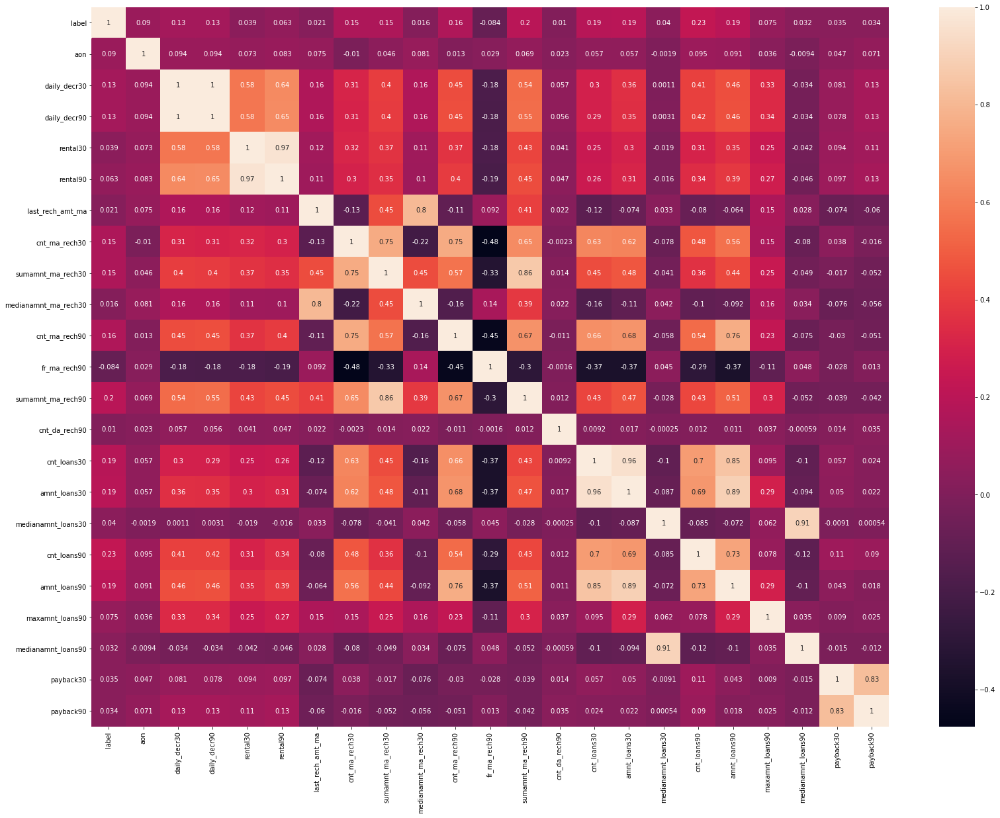

In [1696]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

Observations:
1. zero values are found
2. No null values are found
3. Column is highly skewed
4. success is higher for users taking total amount of loans in last 90 days
5. Daily amount is higher thats why users taking more amount of loans
6. Main account balance is high because users taking more amount of loans 


In [1697]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (191286, 25)


# Column30: maxamnt_loans90 - maximum amount of loan taken by the user in last 90 days

In [1698]:
df['maxamnt_loans90'].unique() #check the unique values

array([ 6, 12,  0], dtype=int64)

In [1699]:
df['maxamnt_loans90'].value_counts() #check the counts of unique values

6     164017
12     25297
0       1972
Name: maxamnt_loans90, dtype: int64

In [1700]:
df['maxamnt_loans90'].value_counts(normalize= True) #check the counts of unique values

6     0.857444
12    0.132247
0     0.010309
Name: maxamnt_loans90, dtype: float64

correlation between the Features and with label:-----> (23, 23)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

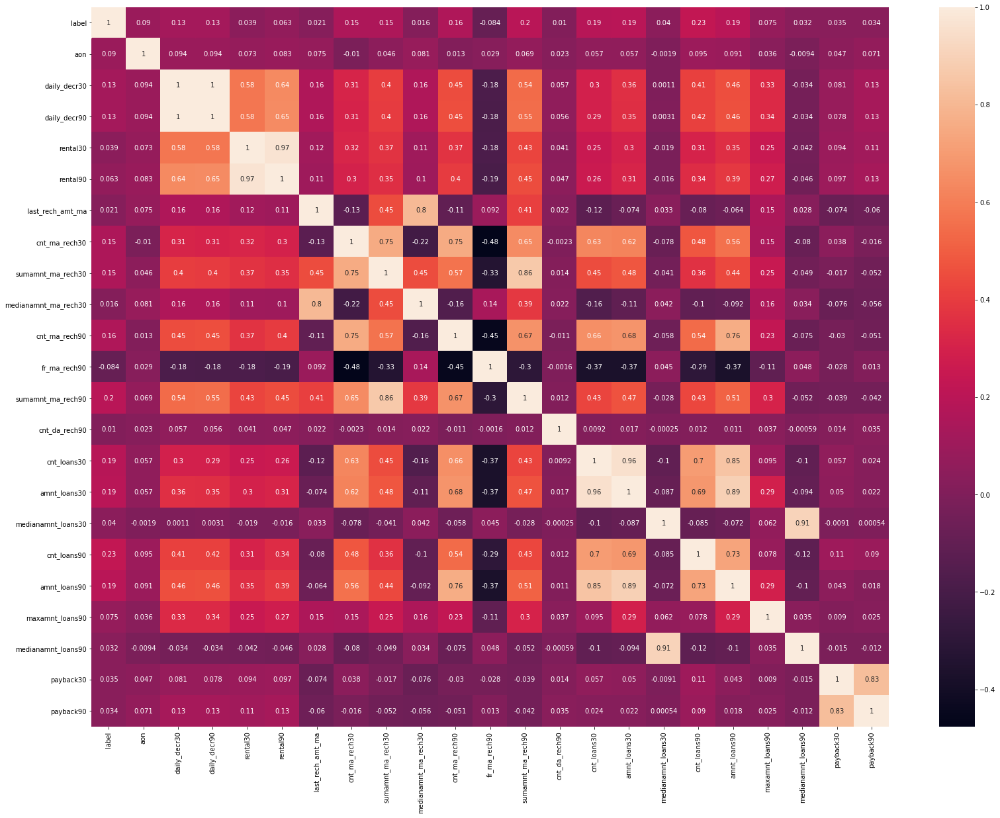

In [1701]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

Observations:
1. zero values are found
2. No null values are found
3. Column is highly skewed
4. There are only three values in this column 6,12,0
5. 85.7% are 6, 13.12% are 12 and rest is zero

In [1702]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (191286, 25)


# Column31: medianamnt_loans90 - Median of amounts of loan taken by the user in last 90 days

In [1703]:
df['medianamnt_loans90'].unique() #check the unique values

array([0. , 0.5, 1. , 2. , 1.5, 3. ])

In [1704]:
df['medianamnt_loans90'].value_counts() #check the counts of unique values

0.0    180222
1.0      5447
0.5      5292
2.0       303
1.5        19
3.0         3
Name: medianamnt_loans90, dtype: int64

In [1705]:
df['medianamnt_loans90'].value_counts(normalize = True) #check the counts of unique values

0.0    0.942160
1.0    0.028476
0.5    0.027665
2.0    0.001584
1.5    0.000099
3.0    0.000016
Name: medianamnt_loans90, dtype: float64

In [1706]:
df.groupby('label')['medianamnt_loans90'].value_counts()
#check the relationship between column and label

label  medianamnt_loans90
0      0.0                    20391
       1.0                      391
       0.5                      390
1      0.0                   159831
       1.0                     5056
       0.5                     4902
       2.0                      303
       1.5                       19
       3.0                        3
Name: medianamnt_loans90, dtype: int64

In [1707]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['medianamnt_loans90'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['medianamnt_loans90'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['medianamnt_loans90'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 4.972250430923543


In [1708]:
#check the skewness
print('Check the skewness in Column:---------->',df['medianamnt_loans90'].skew())

Check the skewness in Column:----------> 4.972250430923543


correlation between the Features and with label:-----> (23, 23)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

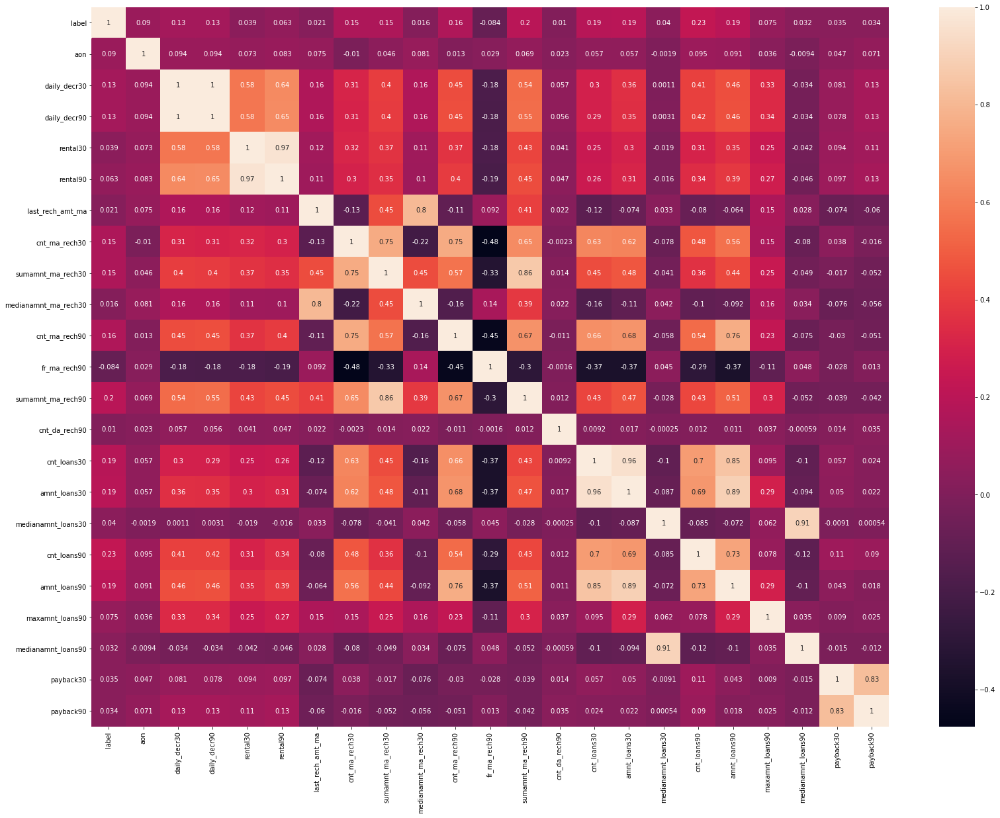

In [1709]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

In [1710]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (191286, 25)


# Column32: payback30 - Average payback time in days over last 30 days

In [1711]:
df['payback30'].unique() #check the unique values

array([29.        ,  0.        ,  2.33333333, ..., 56.75      ,
       64.33333333,  5.61538462])

In [1712]:
df['payback30'].value_counts() #check the counts of unique values

0.000000      93351
2.000000       5251
3.000000       4829
4.000000       3787
2.500000       3349
              ...  
170.500000        1
2.588235          1
60.333333         1
3.529412          1
6.062500          1
Name: payback30, Length: 1315, dtype: int64

In [1713]:
df['payback30'].value_counts(bins=5) #check the counts of unique values

(-0.173, 34.3]    188838
(34.3, 68.6]        1666
(68.6, 102.9]        473
(102.9, 137.2]       176
(137.2, 171.5]       133
Name: payback30, dtype: int64

In [1714]:
df.groupby('label')['payback30'].value_counts()
#check the relationship between column and label

label  payback30
0      0.0          17608
       3.0            100
       4.0            100
       5.0             86
       2.5             82
                    ...  
1      167.5            1
       169.5            1
       170.0            1
       170.5            1
       171.5            1
Name: payback30, Length: 1778, dtype: int64

In [1715]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['payback30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['payback30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['payback30'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 8.098477875612351


In [1716]:
df['payback30'] = df['payback30'].replace(0.0, df['payback30'].mean())
#replace the zero value by column mean

In [1717]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['payback30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['payback30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['payback30'].skew())

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 9.133670948881761


In [1718]:
df['payback30'] = np.log(df['payback30']) #scale the data

In [1719]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['payback30'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['payback30'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['payback30'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 1.7813067702380712


correlation between the Features and with label:-----> (23, 23)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

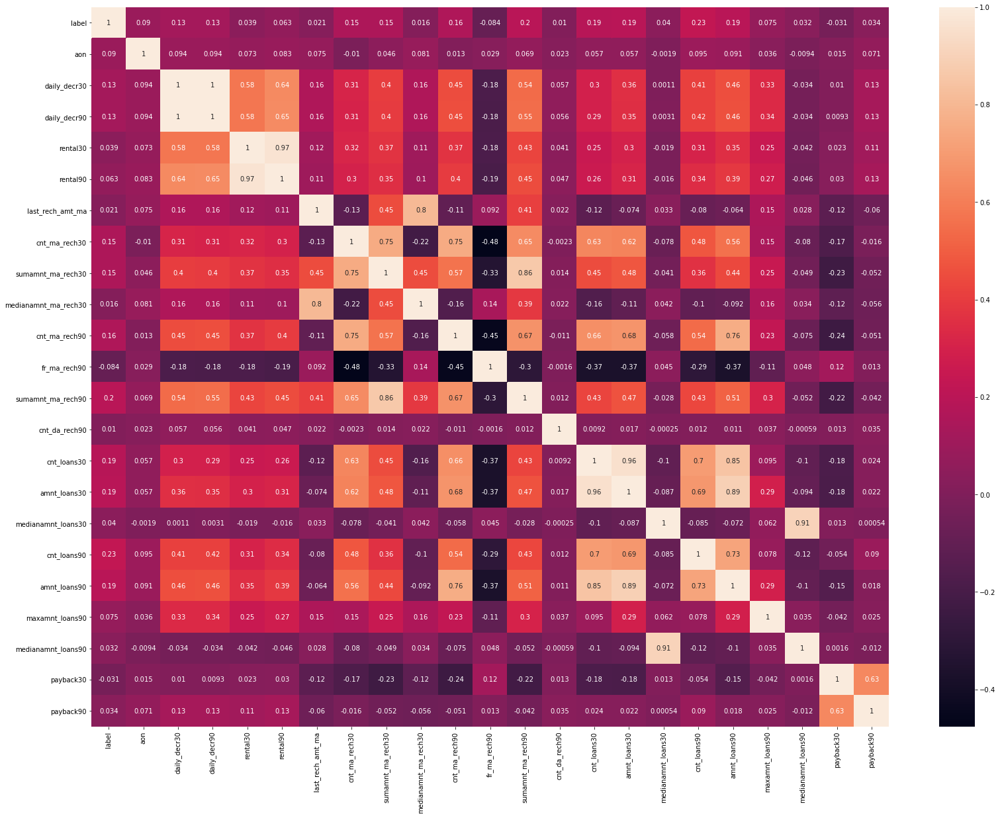

In [1720]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

In [1721]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (191286, 25)


# Column33: payback90 - Average payback time in days over last 90 days

In [1722]:
df['payback90'].unique() #check the unique values

array([29.        ,  0.        ,  2.33333333, ..., 64.33333333,
        5.23529412, 25.84615385])

In [1723]:
df['payback90'].value_counts() #check the counts of unique values

0.000000     82669
2.000000      4642
3.000000      4253
4.000000      3465
2.500000      2854
             ...  
21.625000        1
62.800000        1
3.043478         1
4.764706         1
3.560000         1
Name: payback90, Length: 2318, dtype: int64

In [1724]:
df['payback90'].value_counts(bins=5) #check the counts of unique values

(-0.173, 34.3]    187574
(34.3, 68.6]        2605
(68.6, 102.9]        698
(102.9, 137.2]       242
(137.2, 171.5]       167
Name: payback90, dtype: int64

In [1725]:
df.groupby('label')['payback90'].value_counts()
#check the relationship between column and label

label  payback90
0      0.0          16967
       3.0             96
       4.0             89
       5.0             89
       7.0             83
                    ...  
1      167.5            1
       169.5            1
       170.0            1
       170.5            1
       171.5            1
Name: payback90, Length: 2931, dtype: int64

In [1726]:
#check the zeros, null and skew data
#check the zero value in column
print('Check the zeros in Column:-------->',df['payback90'].all())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#check the null value in column
print('Check the null values in Column:---------->', df['payback90'].isnull().sum())
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
#check the skewness
print('Check the skewness in Column:---------->',df['payback90'].skew())

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 6.702135449594415


correlation between the Features and with label:-----> (23, 23)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

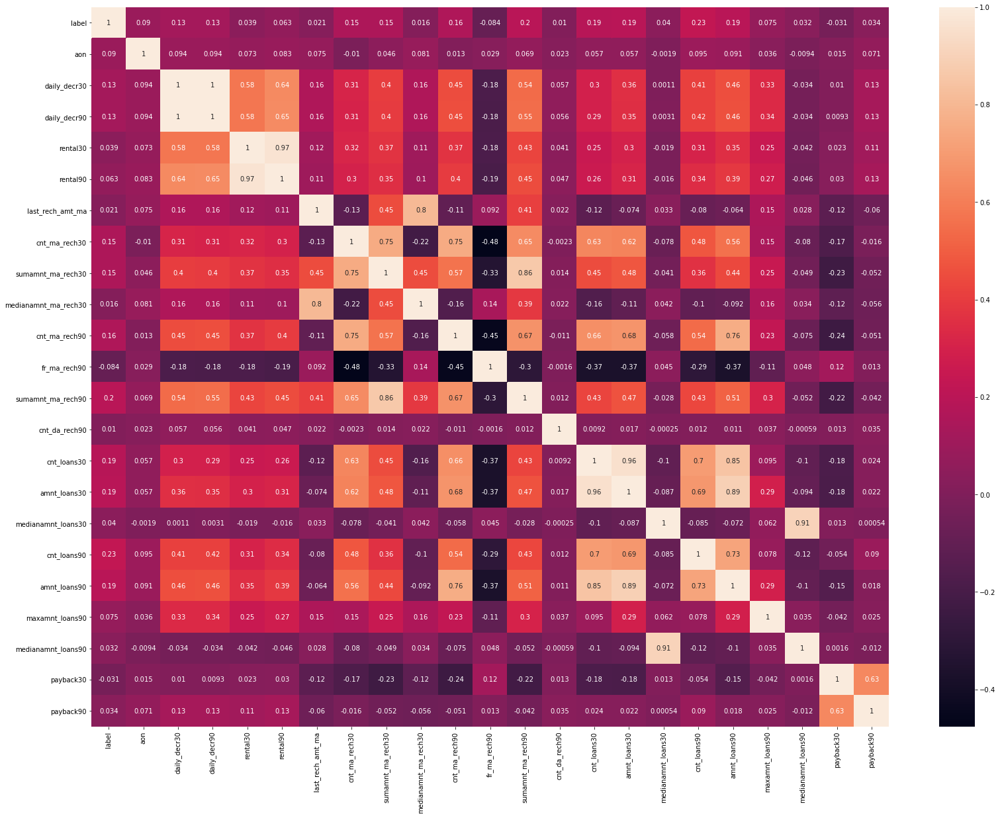

In [1727]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

In [1728]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (191286, 25)


# Column34: pcircle - telecom circle

In [1729]:
df['pcircle'].unique() #check the unique values

array(['UPW'], dtype=object)

In [1730]:
df['pcircle'].value_counts() #check the counts of unique values

UPW    191286
Name: pcircle, dtype: int64

In [1731]:
df.drop(columns='pcircle',inplace = True) #drop the column

correlation between the Features and with label:-----> (23, 23)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

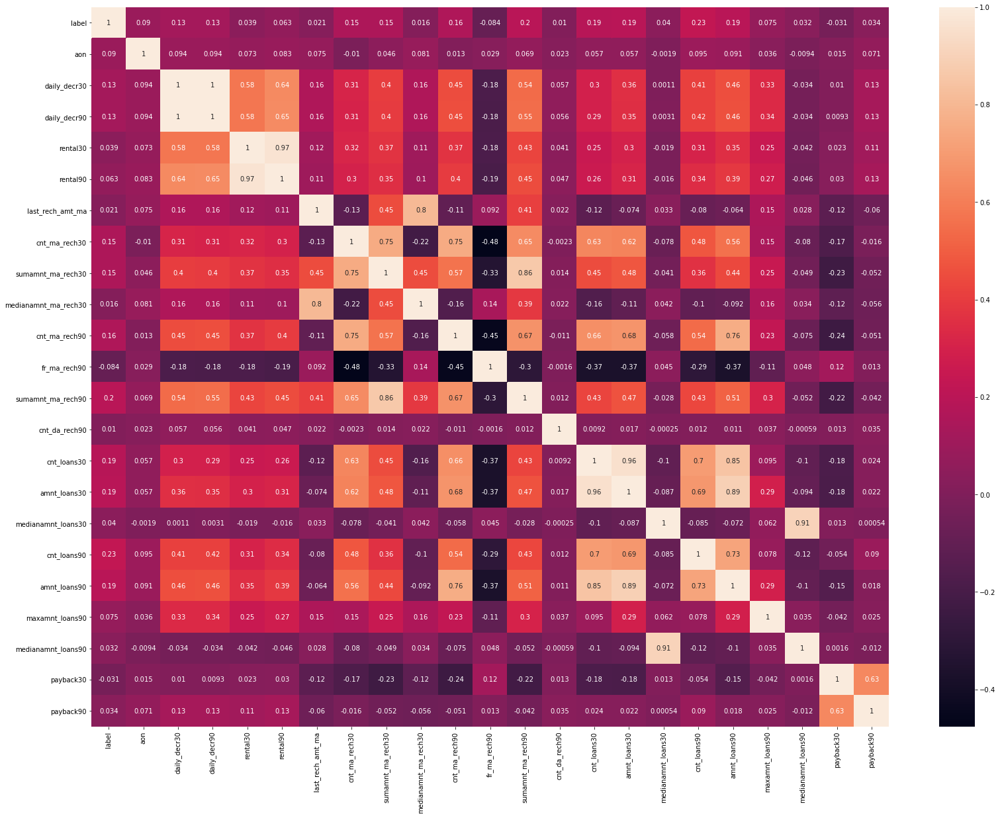

In [1732]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

Observations:
1. Column contains only one value that's why we need to drop this column

In [1733]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (191286, 24)


# Column35: pdate - date

In [1734]:
df['pdate'].unique() #check the unique values

array(['2016-07-20', '2016-08-10', '2016-08-19', '2016-06-06',
       '2016-06-22', '2016-07-02', '2016-07-05', '2016-08-05',
       '2016-06-15', '2016-06-08', '2016-06-12', '2016-06-20',
       '2016-06-29', '2016-06-16', '2016-08-03', '2016-06-24',
       '2016-07-04', '2016-07-03', '2016-07-01', '2016-08-08',
       '2016-06-26', '2016-07-06', '2016-07-09', '2016-06-10',
       '2016-06-27', '2016-08-11', '2016-06-30', '2016-06-19',
       '2016-07-26', '2016-08-14', '2016-06-14', '2016-06-21',
       '2016-06-28', '2016-06-11', '2016-07-27', '2016-07-23',
       '2016-06-23', '2016-08-16', '2016-08-15', '2016-06-02',
       '2016-08-02', '2016-07-28', '2016-07-18', '2016-08-18',
       '2016-07-16', '2016-07-21', '2016-06-03', '2016-08-01',
       '2016-07-13', '2016-06-25', '2016-07-10', '2016-06-09',
       '2016-07-15', '2016-07-11', '2016-08-09', '2016-08-12',
       '2016-07-22', '2016-06-07', '2016-06-04', '2016-07-24',
       '2016-08-13', '2016-06-17', '2016-08-07', '2016-

In [1735]:
df['pdate'].value_counts() #check the counts of unique values

2016-07-04    2957
2016-07-05    2951
2016-07-07    2929
2016-07-06    2886
2016-07-11    2877
              ... 
2016-06-01    1160
2016-06-04    1154
2016-08-19    1120
2016-08-20     779
2016-08-21     321
Name: pdate, Length: 82, dtype: int64

In [1736]:
df['pdate']=pd.to_datetime(df['pdate'])
df['pdate_Month']=df['pdate'].apply(lambda x:x.month)
df['pdate_Day']=df['pdate'].apply(lambda x:x.day)
df['pdate_Years']=df['pdate'].apply(lambda x:x.year)

In [1737]:
df['pdate_Month'].unique() #check the unique values

array([7, 8, 6], dtype=int64)

In [1738]:
df['pdate_Day'].unique() #check the unique values

array([20, 10, 19,  6, 22,  2,  5, 15,  8, 12, 29, 16,  3, 24,  4,  1, 26,
        9, 27, 11, 30, 14, 21, 28, 23, 18, 13, 25,  7, 17, 31],
      dtype=int64)

In [1739]:
df['pdate_Years'].unique() #check the unique values

array([2016], dtype=int64)

In [1740]:
df.drop(columns='pdate_Years',inplace=True) #drop the column

In [1741]:
df.drop(columns='pdate',inplace=True) #drop the column

correlation between the Features and with label:-----> (25, 25)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

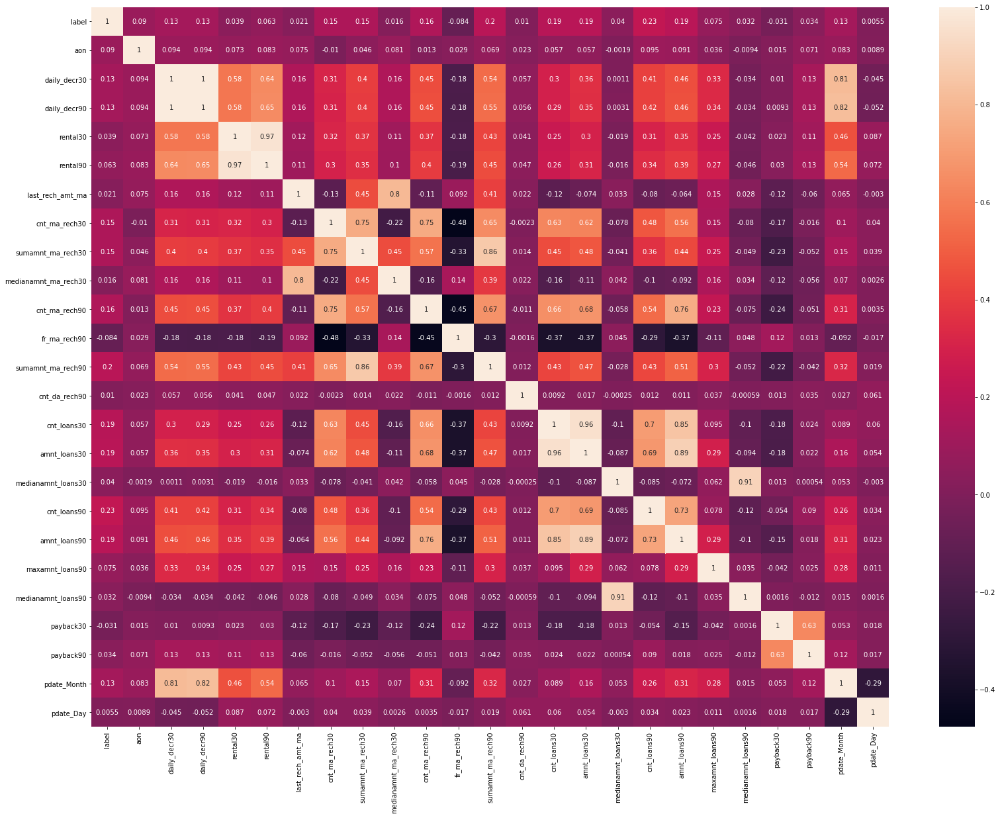

In [1742]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

Observations:
1. zero values are found
2. No null values are found
3. Column is highly skewed
4. Year is same 2016
5. only three months data.

In [1743]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (191286, 25)


# Label: Flag indicating whether the user paid back the credit amount within 5 days of issuing the loan{1:success, 0:failure}

In [1744]:
df['label'].unique() #check the unique values

array([0, 1], dtype=int64)

In [1745]:
df['label'].value_counts() #check the counts of unique values

1    170114
0     21172
Name: label, dtype: int64

In [1746]:
df['label'].value_counts(normalize = True) #check the counts of unique values

1    0.889318
0    0.110682
Name: label, dtype: float64

In [1747]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (191286, 25)


correlation between the Features and with label:-----> (25, 25)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

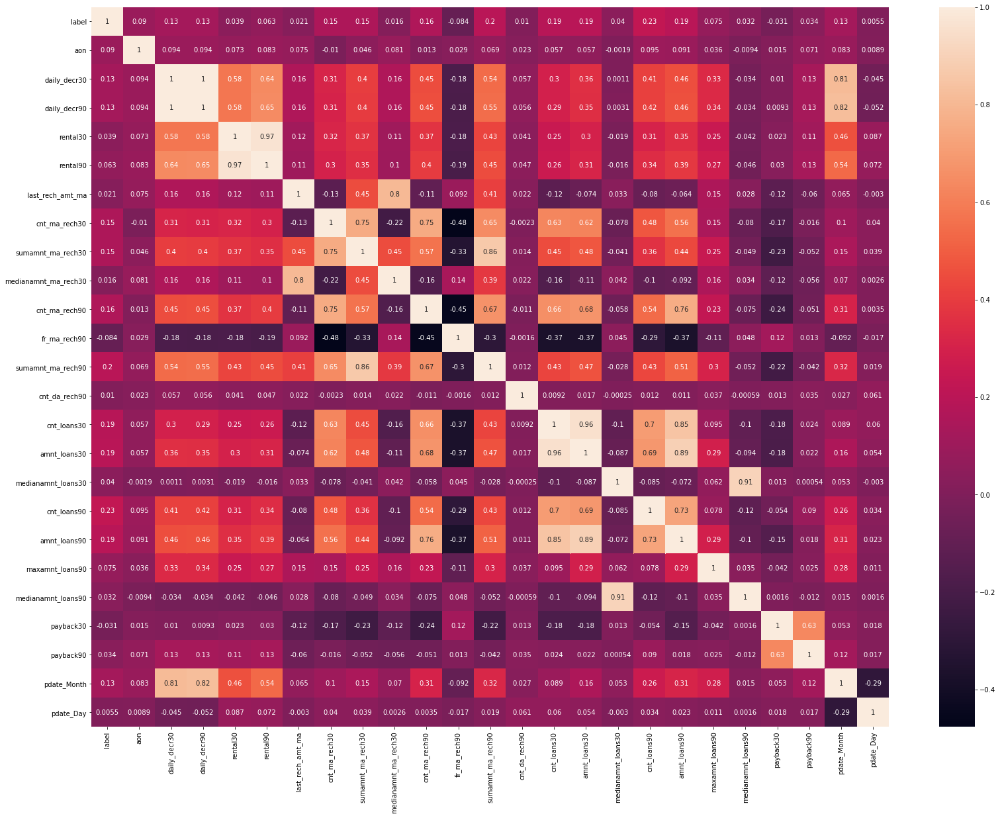

In [1748]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(27,20))
sns.heatmap(corr, annot=True)
plt.show 

In [1749]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 191286 entries, 0 to 191285
Data columns (total 25 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   label                 191286 non-null  int64  
 1   aon                   191286 non-null  float64
 2   daily_decr30          191286 non-null  float64
 3   daily_decr90          191286 non-null  float64
 4   rental30              191286 non-null  float64
 5   rental90              191286 non-null  float64
 6   last_rech_amt_ma      191286 non-null  float64
 7   cnt_ma_rech30         191286 non-null  float64
 8   sumamnt_ma_rech30     191286 non-null  float64
 9   medianamnt_ma_rech30  191286 non-null  float64
 10  cnt_ma_rech90         191286 non-null  float64
 11  fr_ma_rech90          191286 non-null  float64
 12  sumamnt_ma_rech90     191286 non-null  float64
 13  cnt_da_rech90         191286 non-null  float64
 14  cnt_loans30           191286 non-null  float64
 15  

In [1750]:
df.skew()

label                  -2.481816
aon                    -0.335039
daily_decr30           -0.468172
daily_decr90           -0.444073
rental30               -0.381451
rental90               -0.351919
last_rech_amt_ma        0.808423
cnt_ma_rech30          -0.037167
sumamnt_ma_rech30      -0.318950
medianamnt_ma_rech30    0.900493
cnt_ma_rech90           2.649591
fr_ma_rech90           -0.046968
sumamnt_ma_rech90      -0.341965
cnt_da_rech90           6.167517
cnt_loans30             2.481164
amnt_loans30            2.676297
medianamnt_loans30      4.739896
cnt_loans90             1.900154
amnt_loans90            2.893172
maxamnt_loans90         1.609039
medianamnt_loans90      4.972250
payback30               1.781307
payback90               6.702135
pdate_Month             0.259787
pdate_Day               0.189071
dtype: float64

In [1751]:
#split x and y
x = df.drop(['label'], axis=1)
y=df.label

In [1752]:
#scale the value x
Scaler = StandardScaler()
x_scaled = Scaler.fit_transform(x)
x_scaled

array([[-0.66150925,  0.50130734,  0.47672408, ...,  2.31560491,
         0.21344006,  0.64738035],
       [ 0.45986084,  1.01918314,  0.98558449, ..., -0.43327714,
         1.56563243, -0.54750487],
       [ 0.12679617,  0.20755935,  0.18622328, ..., -0.43327714,
         1.56563243,  0.52789183],
       ...,
       [ 0.87074917,  1.01043721,  0.97879614, ..., -0.06991917,
         0.21344006,  1.72277706],
       [ 1.49578691,  1.0303673 ,  0.99905829, ...,  0.56200774,
         0.21344006,  1.24482297],
       [ 1.38948626,  0.64594107,  0.62166436, ..., -0.43327714,
         0.21344006, -0.90597044]])

In [1754]:
# Check the multicollinearity between the features
#import library for VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["vif"]= [ variance_inflation_factor(x_scaled, i)
               for i in range ( x_scaled.shape[1])]
vif['features']= x.columns
vif 

,vif,features
0,1.039572,aon
1,402.819771,daily_decr30
2,436.372651,daily_decr90
3,19.452993,rental30
4,22.368368,rental90
5,3.342157,last_rech_amt_ma
6,25.180667,cnt_ma_rech30
7,31.621087,sumamnt_ma_rech30
8,10.925684,medianamnt_ma_rech30
9,5.442609,cnt_ma_rech90


In [1755]:
x = df.drop(columns = 'daily_decr90', inplace = True) #high collinearity, so, we need to drop this column
time.sleep(1)
x = df.drop(columns = 'rental90', inplace = True) #high collinearity, so, we need to drop this column
time.sleep(1)
x = df.drop(columns = 'sumamnt_ma_rech30', inplace = True) #high collinearity, so, we need to drop this column
time.sleep(1)
x = df.drop(columns = 'amnt_loans30', inplace = True) #high collinearity, so, we need to drop this column
time.sleep(1)
x = df.drop(columns = 'aon', inplace = True) #high collinearity, so, we need to drop this column
time.sleep(1)
x = df.drop(columns = 'medianamnt_ma_rech30', inplace = True) #high collinearity, so, we need to drop this column
time.sleep(1)
x = df.drop(columns = 'cnt_loans90', inplace = True) #high collinearity, so, we need to drop this column

In [1756]:
#split data into train and test.
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y,test_size = 0.25, random_state=42)

In [1757]:
y_train.head()

31532     1
188620    1
139203    1
52279     0
110027    1
Name: label, dtype: int64

# Check the Accuracy by using 5 classification models

In [1758]:
log_reg = LogisticRegression() #Model instantiating
dt = DecisionTreeClassifier()
rf= RandomForestClassifier()
knn = KNeighborsClassifier()
svc = SVC()

In [1759]:
#train the model
log_reg.fit(x_train,y_train)
dt.fit(x_train,y_train)
rf.fit(x_train,y_train)
knn.fit(x_train,y_train)
svc.fit(x_train,y_train)
print("all models are trained")

all models are trained


In [1760]:
log_reg.score(x_test,y_test) #Let's check how well model fits the test data
dt.score(x_test,y_test)
rf.score(x_test,y_test)
knn.score(x_test,y_test)
svc.score(x_test,y_test)
print("all models score are captured")

all models score are captured


In [1761]:
y_pred_log_reg = log_reg.predict(x_test) #save the predictions in some variables
y_pred_dt = dt.predict(x_test) 
y_pred_rf = rf.predict(x_test) 
y_pred_knn = knn.predict(x_test) 
y_pred_svc = svc.predict(x_test) 

In [1762]:
#check the accuracy score, confusion matrix and classification report
print('Accuracy_score of Logistic regression:-------->  ',accuracy_score(y_test,y_pred_log_reg))
time.sleep(2)
print('Confusion_matrix:\n' , confusion_matrix(y_test,y_pred_log_reg))
time.sleep(2)
print('Classification_report:\n' , classification_report(y_test,y_pred_log_reg))

time.sleep(2)
print("\n",'*'*50)
print("\n",'*'*50)
time.sleep(2)


print('Accuracy_score of Decision Tree:-------->  ',accuracy_score(y_test,y_pred_dt))
time.sleep(2)
print('Confusion_matrix:\n' , confusion_matrix(y_test,y_pred_dt))
time.sleep(2)
print('Classification_report:\n' , classification_report(y_test,y_pred_dt))

time.sleep(2)
print("\n",'*'*50)
print("\n",'*'*50)
time.sleep(2)

print('Accuracy_score of Random forest:-------->  ',accuracy_score(y_test,y_pred_rf))
time.sleep(2)
print('Confusion_matrix:\n' , confusion_matrix(y_test,y_pred_rf))
time.sleep(2)
print('Classification_report:\n' , classification_report(y_test,y_pred_rf))

time.sleep(2)
print("\n",'*'*50)
print("\n",'*'*50)
time.sleep(2)

print('Accuracy_score of KNeighbors Classifiers:-------->  ',accuracy_score(y_test,y_pred_knn))
time.sleep(2)
print('Confusion_matrix:\n' , confusion_matrix(y_test,y_pred_knn))
time.sleep(2)
print('Classification_report:\n' , classification_report(y_test,y_pred_knn))

time.sleep(2)
print("\n",'*'*50)
print("\n",'*'*50)
time.sleep(2)

print('Accuracy_score of Support Vector Machine:-------->  ',accuracy_score(y_test,y_pred_svc))
time.sleep(2)
print('Confusion_matrix:\n' , confusion_matrix(y_test,y_pred_svc))
time.sleep(2)
print('Classification_report:\n' , classification_report(y_test,y_pred_svc))

Accuracy_score of Logistic regression:-------->   0.8944000669148091
Confusion_matrix:
 [[  300  4971]
 [   79 42472]]
Classification_report:
               precision    recall  f1-score   support

           0       0.79      0.06      0.11      5271
           1       0.90      1.00      0.94     42551

    accuracy                           0.89     47822
   macro avg       0.84      0.53      0.53     47822
weighted avg       0.88      0.89      0.85     47822


 **************************************************

 **************************************************
Accuracy_score of Decision Tree:-------->   0.8848228848647066
Confusion_matrix:
 [[ 2689  2582]
 [ 2926 39625]]
Classification_report:
               precision    recall  f1-score   support

           0       0.48      0.51      0.49      5271
           1       0.94      0.93      0.94     42551

    accuracy                           0.88     47822
   macro avg       0.71      0.72      0.71     47822
weighted avg   

In [1763]:
#check all model cv score
print("Logistic regression CV Score:")
print(cross_val_score(log_reg,x_scaled,y,cv=5))

time.sleep(2)
print("\n",'*'*50)

print("Decision Tree CV Score:")
print(cross_val_score(dt,x_scaled,y,cv=5))

time.sleep(2)
print("\n",'*'*50)

print("Random Forest CV Score:")
print(cross_val_score(rf,x_scaled,y,cv=5))

time.sleep(2)
print("\n",'*'*50)

print("KNeighbour Classifier CV Score:")
print(cross_val_score(knn,x_scaled,y,cv=5))

time.sleep(2)
print("\n",'*'*50)

print("Support Vector Machine CV Score:")
print(cross_val_score(svc,x_scaled,y,cv=5))

Logistic regression CV Score:
[0.89379999 0.89429385 0.89337899 0.89429385 0.89398019]

 **************************************************
Decision Tree CV Score:
[0.8835799  0.88357686 0.88402122 0.88616462 0.88462242]

 **************************************************
Random Forest CV Score:
[0.92150661 0.92027603 0.92040672 0.92257626 0.92111248]

 **************************************************
KNeighbour Classifier CV Score:
[0.91076376 0.91039548 0.91102282 0.91157174 0.91274799]

 **************************************************
Support Vector Machine CV Score:
[0.91640964 0.91489139 0.91530962 0.9173746  0.91719163]


In [1764]:
#Check the mean of all models cv score one by one
print("Logistic regression CV Score:")
print(cross_val_score(log_reg,x_scaled,y,cv=5).mean())

time.sleep(2)
print("\n",'*'*50)

print("Decision Tree CV Score:")
print(cross_val_score(dt,x_scaled,y,cv=5).mean())

time.sleep(2)
print("\n",'*'*50)

print("Random Forest CV Score:")
print(cross_val_score(rf,x_scaled,y,cv=5).mean())

time.sleep(2)
print("\n",'*'*50)

print("KNeighbour Classifier CV Score:")
print(cross_val_score(knn,x_scaled,y,cv=5).mean())

time.sleep(2)
print("\n",'*'*50)

print("Support Vector Machine CV Score:")
print(cross_val_score(svc,x_scaled,y,cv=5).mean())

Logistic regression CV Score:
0.8939493750163916

 **************************************************
Decision Tree CV Score:
0.8852451283754915

 **************************************************
Random Forest CV Score:
0.9212958613230793

 **************************************************
KNeighbour Classifier CV Score:
0.9113003593394055

 **************************************************
Support Vector Machine CV Score:
0.9162353743908837


# Plot ROC/AUC for multiple models

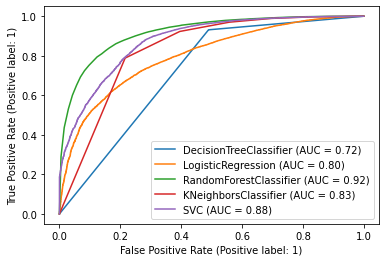

In [1765]:
#how well out model works on test data
disp = plot_roc_curve(dt,x_test,y_test)
plot_roc_curve(log_reg,x_test,y_test, ax= disp.ax_)
plot_roc_curve(rf,x_test,y_test, ax= disp.ax_)
plot_roc_curve(knn,x_test,y_test, ax= disp.ax_)
plot_roc_curve(svc,x_test,y_test, ax= disp.ax_)
plt.show()

# GridSearchCV By using Knn as a estimator

In [ ]:
param_grid = {'algorithm':['kdtree','brute'], 'leaf_size':[12,11,14,15,18,20,25], 'n_neighbors':[3,5,7,9,11,13]}
gridsearch = GridSearchCV(estimator=knn, param_grid= param_grid) #apply GridSearchCV
time.sleep(2)
print(gridsearch.fit(x_train,y_train)) #train the model
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('GridSearchCV best parameters:----->',gridsearch.best_params_) #get best parameters
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#put best params into knn
knn1 = gridsearch.best_estimator_ #save that best param into one variable
print('Trained Model using best parameters:----->',knn1.fit(x_train,y_train))#train the model
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Accuracy score:------>',knn1.score(x_train,y_train)) #check the accuracy score

# GridSearchCV By using SVC as a estimator

In [ ]:
param_grid = {'C': [1,2,4,5,6,7,8,9,10],         
             'gamma': [0.2,0.3,0.4,0.5,0.6,0.7,0.8],
             'kernel': ['rbf']}
gridsearch = GridSearchCV(estimator=svc, param_grid= param_grid)#apply GridSearchCV
time.sleep(2)
print(gridsearch.fit(x_train,y_train)) #train the model
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('GridSearchCV best parameters:----->',gridsearch.best_params_) #get best parameters
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#put best params into svc
svc1 = gridsearch.best_estimator_#save that best param into one variable
print('Trained Model using best parameters:----->',svc1.fit(x_train,y_train))#train the model
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Accuracy score:------>',svc1.score(x_train,y_train))#check the accuracy score

# GridSearchCV By using RandomForestClassifier as a estimator

In [ ]:
params = {'n_estimators':[13,15],
         'criterion':['entropy'],
         'max_depth':[10,15],
         'min_samples_split':[10,11],
         'min_samples_leaf':[5,6]}
gridsearch = GridSearchCV(estimator=rf, param_grid= params)#apply GridSearchCV
time.sleep(2)
print(gridsearch.fit(x_train,y_train)) #train the model
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('GridSearchCV best parameters:----->',gridsearch.best_params_) #get best parameters
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#put best params
rfc = gridsearch.best_estimator_
print('Trained Model using best parameters:----->',rfc.fit(x_train,y_train)) #train the model
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Accuracy score:------>',rfc.score(x_train,y_train))#check the accuracy score

# GridSearchCV By using DecisionTreeClassifier as a estimator

In [ ]:
params = {'criterion':['entropy','gini'],
         'max_depth':range(10,15),
         'min_samples_split':[3,10],
         'min_samples_leaf':[2,10]}
gridsearch = GridSearchCV(estimator=dt, param_grid= params)#apply GridSearchCV
time.sleep(2)
print(gridsearch.fit(x_train,y_train)) #train the model
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('GridSearchCV best parameters:----->',gridsearch.best_params_) #get best parameters
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#put best params 
dtr = gridsearch.best_estimator_
print('Trained Model using best parameters:----->',dtr.fit(x_train,y_train))#train the model
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Accuracy score:------>',dtr.score(x_train,y_train))#check the accuracy score

# Bagging Classifier with Bootstrap = True (Using 4 models)

Using knn as a best estimator

In [ ]:
bag_knn = BaggingClassifier(KNeighborsClassifier(n_neighbors=5),
                           n_estimators=10, max_samples=0.5,
                           bootstrap=True, random_state=3,
                           oob_score=True)
time.sleep(2)
print('Model is Trained:- ', bag_knn.fit(x_train,y_train))
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Accuracy score by using BaggingClassifier:-', bag_knn.score(x_test,y_test))

Using svc as a best estimator

In [ ]:
bag_svc = BaggingClassifier(SVC(),                       #using svc as a best estimator
                           n_estimators=15,
                           bootstrap=True, random_state=5,
                           oob_score=True)
time.sleep(2)
print('Model is Trained:- ', bag_svc.fit(x_train,y_train))
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Accuracy score by using BaggingClassifier:-', bag_svc.score(x_test,y_test))

Using RandomForestClassifier as a best estimator

In [ ]:
bag_rf = BaggingClassifier(RandomForestClassifier(),#using RandomForest as a best estimator
                           n_estimators=15,
                           bootstrap=True, random_state=7,
                           oob_score=True)
time.sleep(2)
print('Model is Trained:- ', bag_rf.fit(x_train,y_train))
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Accuracy score by using BaggingClassifier:-', bag_rf.score(x_test,y_test))

Using DecisionTreeClassifier as a best estimator

In [ ]:
bag_dt = BaggingClassifier(dt,                        #using DecisionTree as a best estimator
                           n_estimators=15,
                           bootstrap=True, random_state=7,
                           oob_score=True)
time.sleep(2)
print('Model is Trained:- ', bag_dt.fit(x_train,y_train))
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Accuracy score by using BaggingClassifier:-', bag_dt.score(x_test,y_test))

# Bagging Classifier with Bootstrap = False (Using 4 models)

Using knn as a best estimator

In [ ]:
bag_knn = BaggingClassifier(KNeighborsClassifier(n_neighbors=5),#using knn as a best estimator
                           n_estimators=10, max_samples=0.5,
                           bootstrap=False, random_state=3,
                           )
time.sleep(2)
print('Model is Trained:- ', bag_knn.fit(x_train,y_train))
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Accuracy score by using BaggingClassifier:-', bag_knn.score(x_test,y_test))

Using svc as a best estimator

In [ ]:
bag_svc = BaggingClassifier(SVC(),                  #using svc as a best estimator
                           n_estimators=15,
                           bootstrap=False, random_state=5,
                           )
time.sleep(2)
print('Model is Trained:- ', bag_svc.fit(x_train,y_train))
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Accuracy score by using BaggingClassifier:-', bag_svc.score(x_test,y_test))

Using rf as a best estimator

In [ ]:
bag_rf = BaggingClassifier(RandomForestClassifier(),   #using RandomForest as a best estimator
                           n_estimators=15,
                           bootstrap=False, random_state=7,
                           )
time.sleep(2)
print('Model is Trained:- ', bag_rf.fit(x_train,y_train))
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Accuracy score by using BaggingClassifier:-', bag_rf.score(x_test,y_test))

Using dt as a best estimator

In [ ]:
bag_dt = BaggingClassifier(dt,                       #using DecisionTree as a best estimator
                           n_estimators=15,
                           bootstrap=False, random_state=7,
                           )
time.sleep(2)
print('Model is Trained:- ', bag_dt.fit(x_train,y_train))
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Accuracy score by using BaggingClassifier:-', bag_dt.score(x_test,y_test))

In [ ]:
# Saving the model

In [ ]:
with open('micro_credit_card_defaulter_project','wb') as f:
    pickle.dump(rf,f)